<a href="https://colab.research.google.com/github/Haikal7090/TUBES-LIDEA-7/blob/main/Tubes_lidea_ril_fix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Dependecies

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import zscore
from scipy import stats

# Load Data

In [3]:
!pip install gdown
!gdown --fuzzy "https://docs.google.com/spreadsheets/d/1mhDBGeIt2b6-FFKrolccp6Jog7ZvhrZN/edit?usp=sharing&ouid=116842443111305752575&rtpof=true&sd=true"

Downloading...
From: https://drive.google.com/uc?id=1mhDBGeIt2b6-FFKrolccp6Jog7ZvhrZN
To: /content/1744774003471_Data_Tugas_Besar_FINAL.xlsx
100% 1.40M/1.40M [00:00<00:00, 96.9MB/s]


In [4]:
df_raw = pd.read_excel("1744774003471_Data_Tugas_Besar_FINAL.xlsx")
df_raw.head()

,NAME,DESCRIPTION,VALUE,UNITS,DATE_TIME,TAG,DATE_NO,Amount Comp_01
0,AA1,AA1_91_9500062414,0.0,Sm3/d,20210401,91_9500062414,44287,0.0
1,AA1,AA1_91_9500062414,0.0,Sm3/d,20210402,91_9500062414,44288,0.0
2,AA1,AA1_91_9500062414,0.0,Sm3/d,20210403,91_9500062414,44289,0.0
3,AA1,AA1_91_9500062414,0.0,Sm3/d,20210404,91_9500062414,44290,0.0
4,AA1,AA1_91_9500062414,0.0,Sm3/d,20210405,91_9500062414,44291,0.0


In [5]:
df_raw.shape

(35200, 8)

In [6]:
# prompt: hitung missing value anggap nilai 0 sama dengan NaN, lalu hitung persentasenya

# Mengganti nilai 0 dengan NaN
df_raw = df_raw.replace(0, np.nan)

# Menghitung jumlah missing value per kolom
missing_values = df_raw.isnull().sum()

# Menghitung persentase missing value per kolom
missing_percentage = (missing_values / len(df_raw)) * 100

# Membuat dataframe untuk menampilkan jumlah dan persentase missing value
missing_info = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage (%)': missing_percentage
})

print("Informasi Missing Value (termasuk nilai 0 yang dianggap NaN):")
print(missing_info)

# Anda juga bisa menampilkan kolom dengan missing value > 0
print("\nKolom dengan Missing Values:")
print(missing_info[missing_info['Missing Values'] > 0])

Informasi Missing Value (termasuk nilai 0 yang dianggap NaN):
                Missing Values  Percentage (%)
NAME                         0        0.000000
DESCRIPTION                  0        0.000000
VALUE                     2292        6.511364
UNITS                        0        0.000000
DATE_TIME                    0        0.000000
TAG                          0        0.000000
DATE_NO                      0        0.000000
Amount Comp_01            2292        6.511364

Kolom dengan Missing Values:
                Missing Values  Percentage (%)
VALUE                     2292        6.511364
Amount Comp_01            2292        6.511364


In [7]:
# prompt: cek data duplikat

# Mengecek data duplikat
duplicate_rows = df_raw[df_raw.duplicated()]

print("\nJumlah data duplikat:", duplicate_rows.shape[0])

if duplicate_rows.shape[0] > 0:
    print("\nContoh data duplikat:")
    print(duplicate_rows.head())
else:
    print("\nTidak ada data duplikat ditemukan.")

# Jika Anda ingin melihat baris yang sepenuhnya sama, Anda bisa menggunakan keep=False
# all_duplicate_rows = df_raw[df_raw.duplicated(keep=False)]
# print("\nSemua baris duplikat:")
# print(all_duplicate_rows)


Jumlah data duplikat: 0

Tidak ada data duplikat ditemukan.


In [8]:
# prompt: cek jumlah outlier menggunakan iqr dan z-score

def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers.shape[0]

def detect_outliers_zscore(df, column, threshold=3):
    df_cleaned = df.dropna(subset=[column]) # Z-score is sensitive to NaN
    if df_cleaned.empty:
        return 0
    z_scores = np.abs(zscore(df_cleaned[column]))
    outliers = df_cleaned[z_scores > threshold]
    return outliers.shape[0]

# Identify numerical columns to check for outliers (excluding 'No' and potentially others if not numerical)
numerical_cols = df_raw.select_dtypes(include=np.number).columns.tolist()
if 'No' in numerical_cols:
    numerical_cols.remove('No')

print("\nDeteksi Outlier per Kolom:")
print("-" * 30)

for col in numerical_cols:
    iqr_outliers = detect_outliers_iqr(df_raw, col)
    zscore_outliers = detect_outliers_zscore(df_raw, col)

    print(f"Kolom '{col}':")
    print(f"  Jumlah outlier (IQR): {iqr_outliers}")
    print(f"  Jumlah outlier (Z-score): {zscore_outliers}")
    print("-" * 30)



Deteksi Outlier per Kolom:
------------------------------
Kolom 'VALUE':
  Jumlah outlier (IQR): 1013
  Jumlah outlier (Z-score): 703
------------------------------
Kolom 'DATE_TIME':
  Jumlah outlier (IQR): 0
  Jumlah outlier (Z-score): 0
------------------------------
Kolom 'DATE_NO':
  Jumlah outlier (IQR): 0
  Jumlah outlier (Z-score): 0
------------------------------
Kolom 'Amount Comp_01':
  Jumlah outlier (IQR): 1013
  Jumlah outlier (Z-score): 703
------------------------------


In [9]:
df_raw.shape

(35200, 8)

# Data Wrangling

In [11]:
# Hapus kolom yang tidak diperlukan
df = df_raw.copy()
df.drop(columns=['DATE_NO', 'TAG', 'Amount Comp_01', 'NAME'], inplace=True, errors='ignore')

# Pivot: setiap kolom adalah satu DESCRIPTION, isinya VALUE, baris berdasarkan DATE_TIME
pivot_df = df.pivot(index='DATE_TIME', columns='DESCRIPTION', values='VALUE')

# Ambil hanya 640 baris pertama dari index 0
pivot_df = pivot_df.iloc[0:640]

# Simpan ke file Excel baru
output_pivot = "pivot_55_description_640rows.xlsx"
pivot_df.to_excel(output_pivot)

print(f"Data pivot dengan 55 kolom DESCRIPTION dan 640 baris DATE_TIME telah disimpan di: {output_pivot}")

Data pivot dengan 55 kolom DESCRIPTION dan 640 baris DATE_TIME telah disimpan di: pivot_55_description_640rows.xlsx


In [12]:
df = pd.read_excel('pivot_55_description_640rows.xlsx')
df.head()

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20210402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20210403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20210404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20210405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Convert DATE_TIME to datetime
df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'], format='%Y%m%d')

In [14]:
df.shape

(640, 56)

# Explanatory Data Analysis

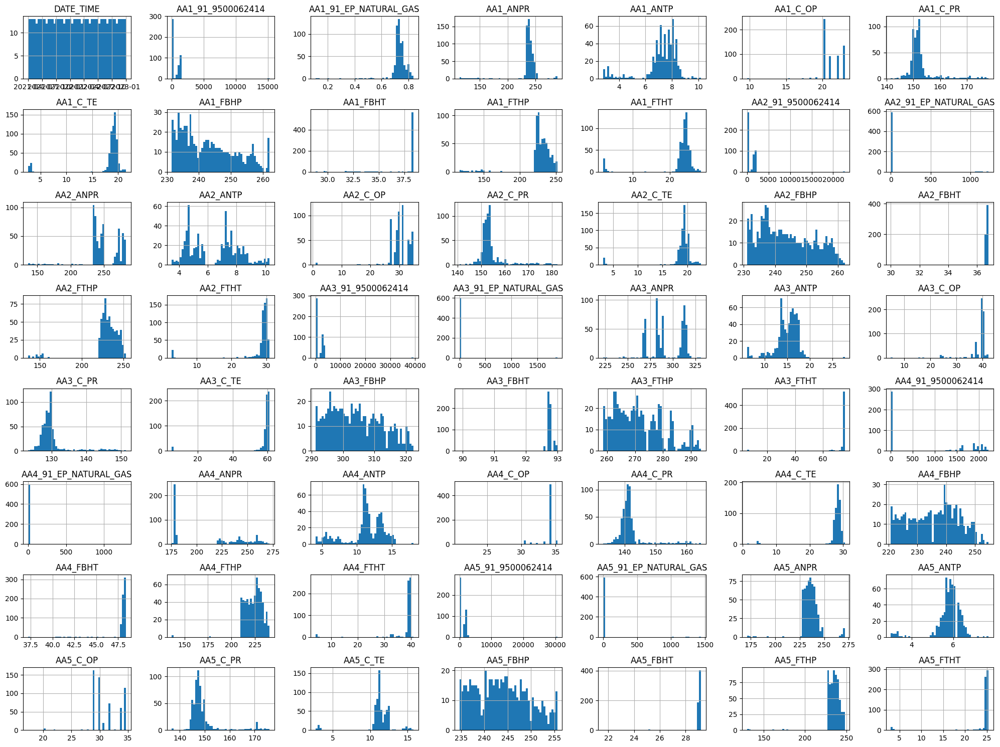

In [16]:
# prompt: buatkan aku grafik histogram untuk semua kolom

df.hist(bins=50, figsize=(20, 15))
plt.tight_layout()
plt.show()


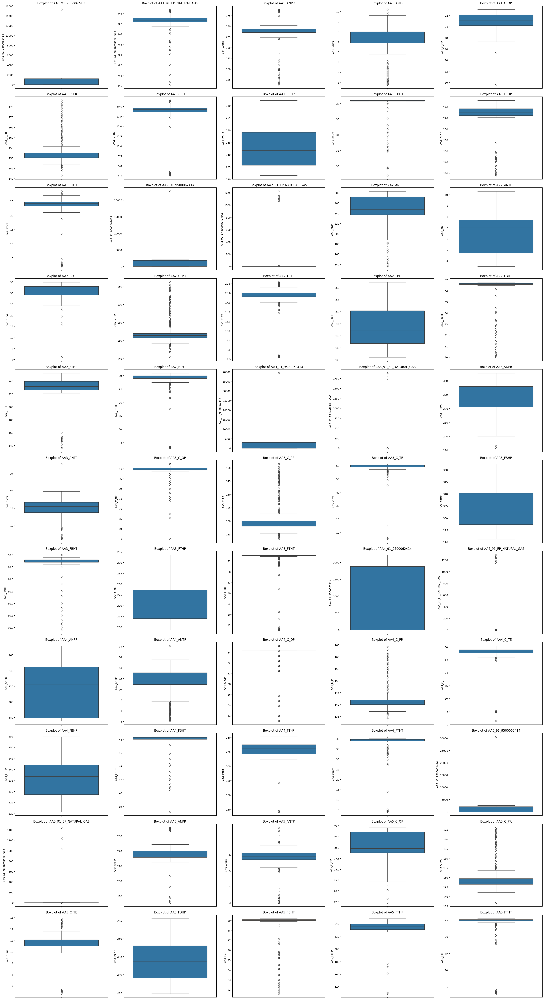

In [18]:
# prompt: buatkan aku kode boxplot dibuat dalam satu gambar 6x5

# Plotting boxplots for numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Determine the number of rows and columns for the subplot grid
n_cols = 5
n_rows = int(np.ceil(len(numerical_cols) / n_cols))

# Adjust figure size
plt.figure(figsize=(6 * n_cols, 5 * n_rows)) # Adjust the overall figure size

for i, col in enumerate(numerical_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col) # Set the y-axis label

plt.tight_layout()
plt.show()

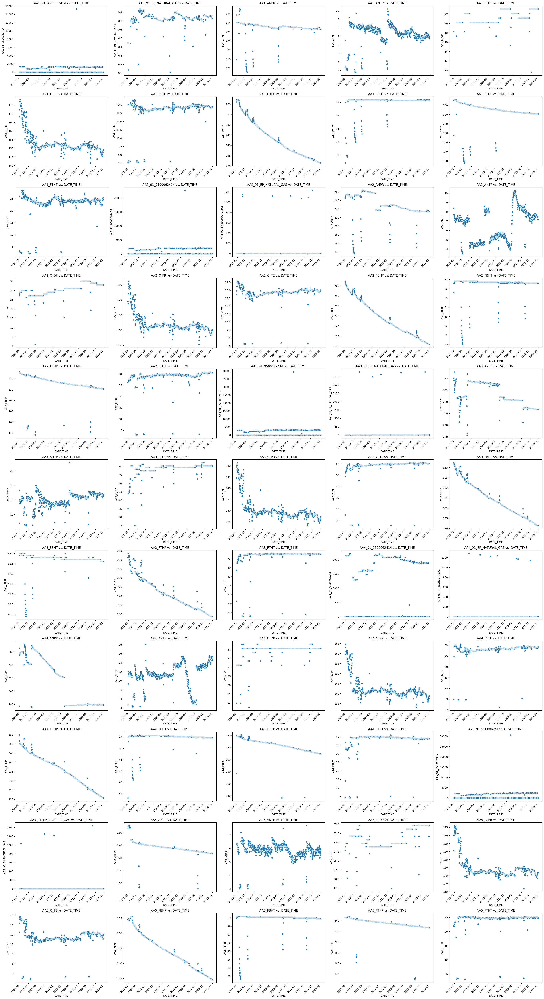

In [19]:
# prompt: buatkan aku kode bivariat dari tiap kolom dengan sumbu x adalah date_time dibuat dalam satu gambar 6x5

# Get the list of columns excluding 'DATE_TIME'
columns_to_plot = df.columns.drop('DATE_TIME')

# Determine the number of rows and columns for the subplot grid
n_cols = 5
n_rows = int(np.ceil(len(columns_to_plot) / n_cols))

# Adjust figure size (6x5 inches per subplot)
plt.figure(figsize=(6 * n_cols, 5 * n_rows))

# Create a scatter plot for each column against 'DATE_TIME'
for i, col in enumerate(columns_to_plot):
    plt.subplot(n_rows, n_cols, i + 1) # Select the subplot
    sns.scatterplot(x=df['DATE_TIME'], y=df[col]) # Create the scatter plot
    plt.title(f'{col} vs. DATE_TIME') # Set title
    plt.xlabel('DATE_TIME') # Set x-axis label
    plt.ylabel(col) # Set y-axis label
    plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for readability

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show() # Display the plot


--- Summary Statistics for AA1 ---

--- Summary Statistics for AA1_91_9500062414 ---
count      484.000000
mean       501.582066
std        887.993962
min          0.200000
25%          1.240000
50%          1.320000
75%       1219.000000
max      15302.000000
Name: AA1_91_9500062414, dtype: float64


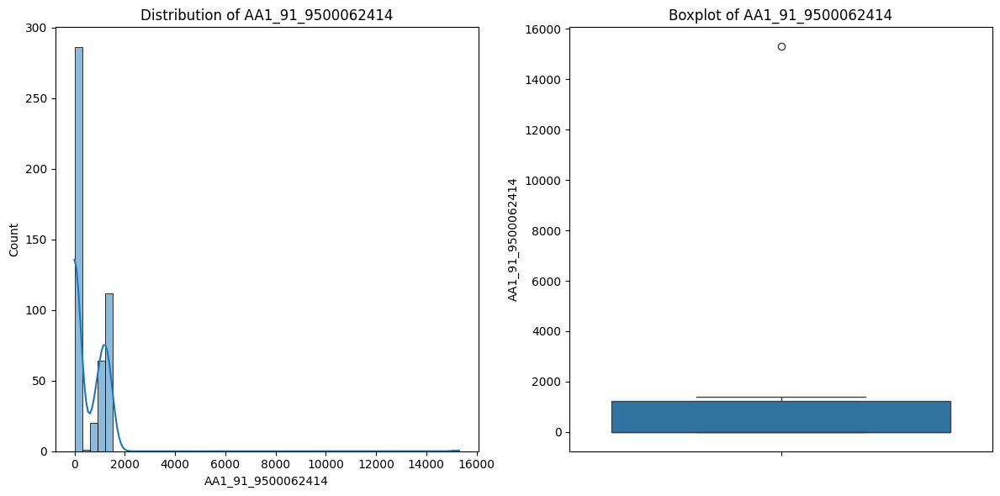


--- Summary Statistics for AA1_91_EP_NATURAL_GAS ---
count    579.000000
mean       0.733109
std        0.063850
min        0.110346
25%        0.717980
50%        0.733635
75%        0.756387
max        0.837520
Name: AA1_91_EP_NATURAL_GAS, dtype: float64


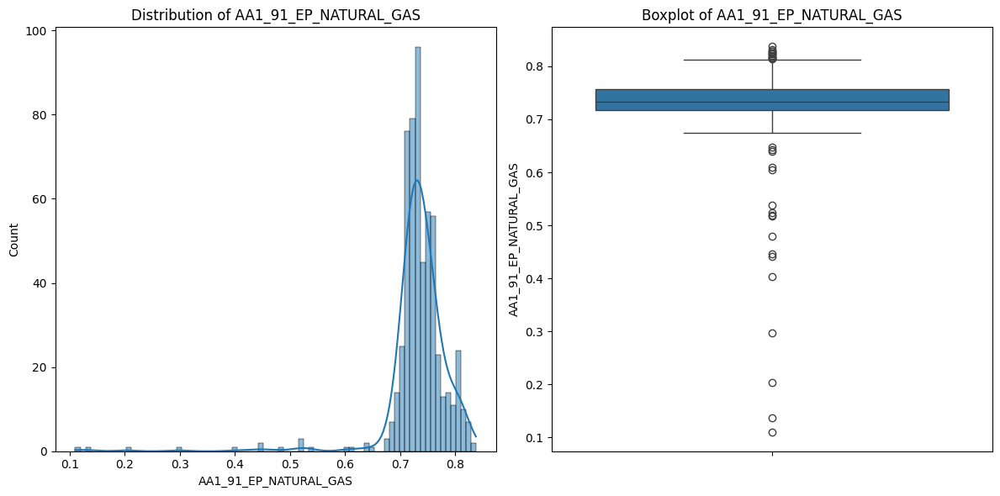


--- Summary Statistics for AA1_ANPR ---
count    614.000000
mean     237.102296
std       21.058634
min      113.360000
25%      235.300000
50%      238.830000
75%      243.192500
max      289.280000
Name: AA1_ANPR, dtype: float64


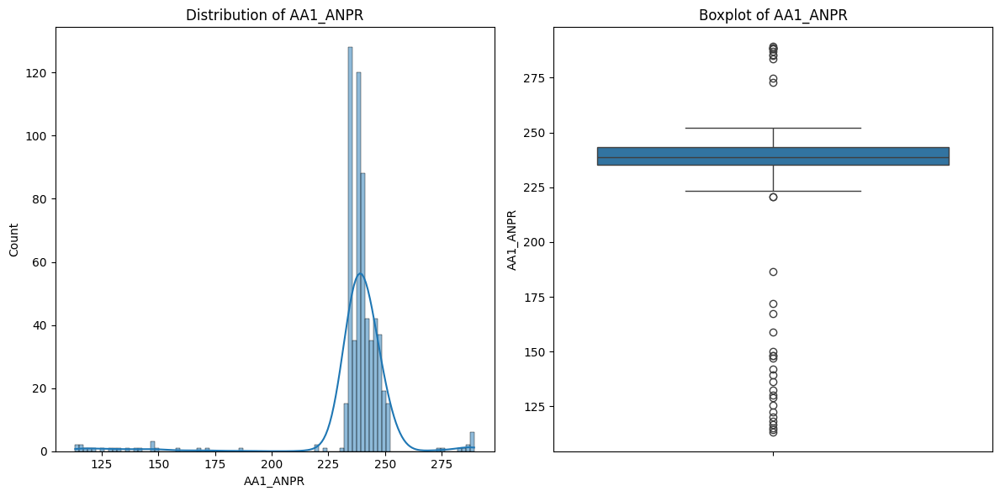


--- Summary Statistics for AA1_C_PR ---
count    614.000000
mean     152.818876
std        5.639994
min      141.510000
25%      150.180000
50%      151.460000
75%      152.547500
max      178.150000
Name: AA1_C_PR, dtype: float64


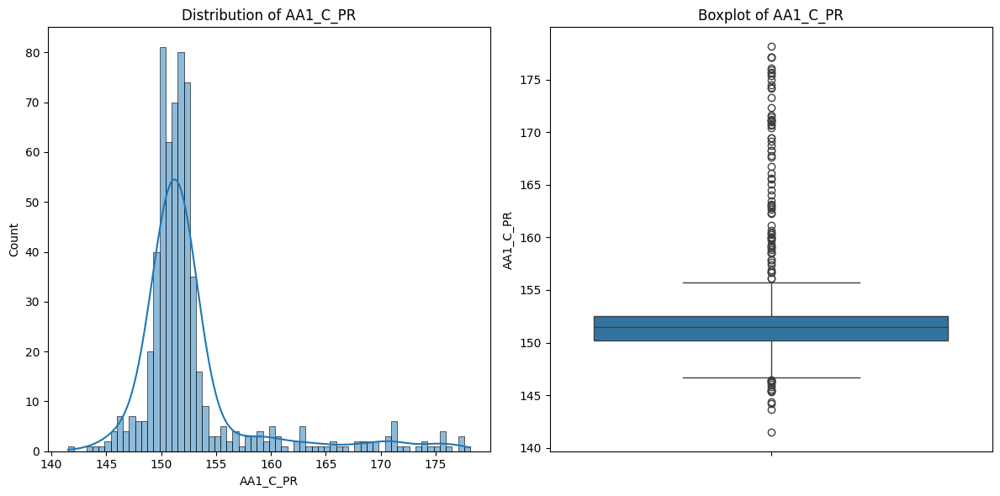


--- Summary Statistics for AA1_FBHP ---
count    614.000000
mean     242.973502
std        8.442948
min      231.520000
25%      235.685000
50%      241.700000
75%      249.102500
max      262.130000
Name: AA1_FBHP, dtype: float64


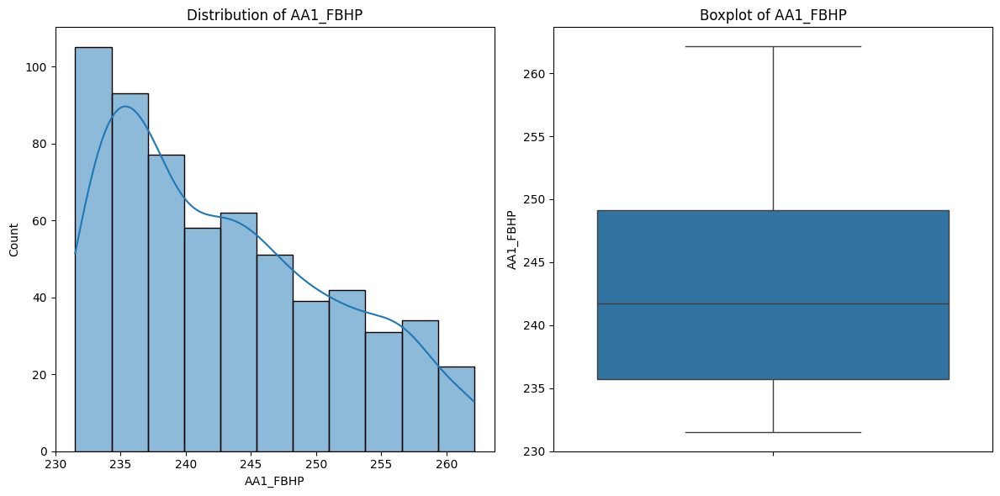


--- Summary Statistics for AA1_ANTP ---
count    614.000000
mean       7.216124
std        1.308643
min        2.800000
25%        6.900000
50%        7.500000
75%        8.000000
max       10.200000
Name: AA1_ANTP, dtype: float64


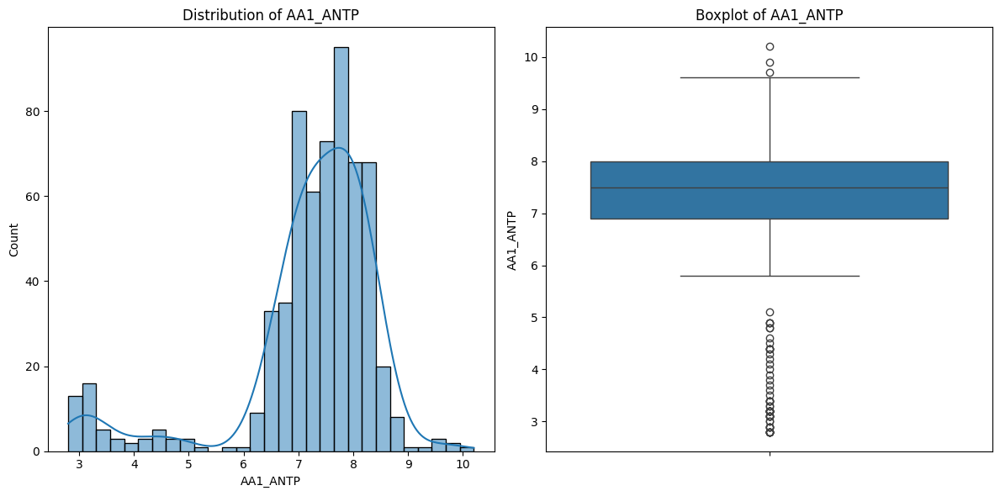


--- Summary Statistics for AA1_C_TE ---
count    613.000000
mean      18.139967
std        4.001644
min        2.600000
25%       18.600000
50%       19.200000
75%       19.500000
max       21.500000
Name: AA1_C_TE, dtype: float64


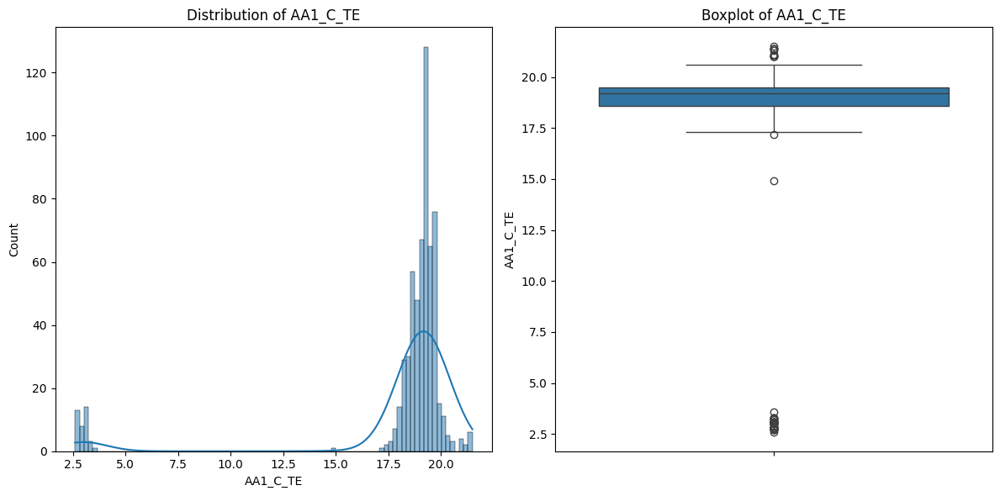


--- Summary Statistics for AA1_FBHT ---
count    614.000000
mean      37.965798
std        1.546781
min       28.800000
25%       38.300000
50%       38.300000
75%       38.400000
max       38.400000
Name: AA1_FBHT, dtype: float64


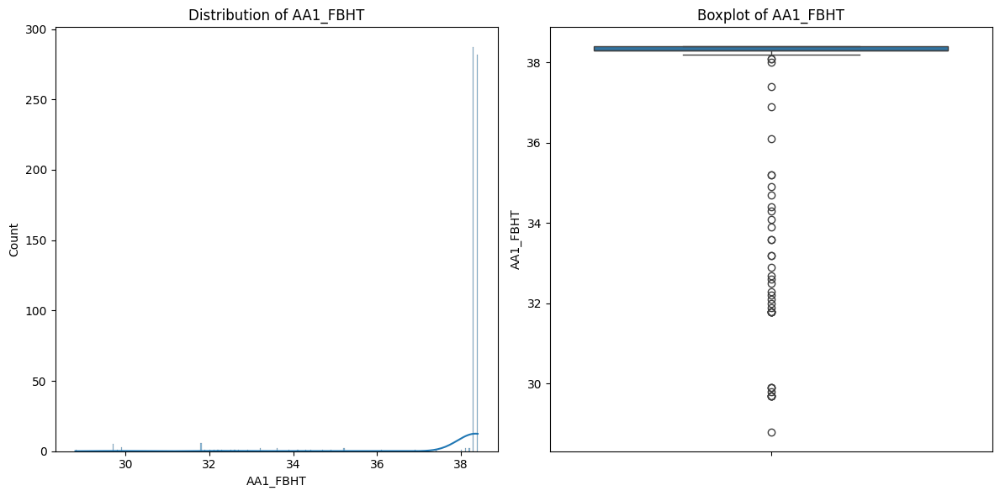


--- Summary Statistics for AA1_C_OP ---
count    574.000000
mean      21.276028
std        1.347542
min        9.620000
25%       20.190000
50%       21.150000
75%       22.120000
max       23.080000
Name: AA1_C_OP, dtype: float64


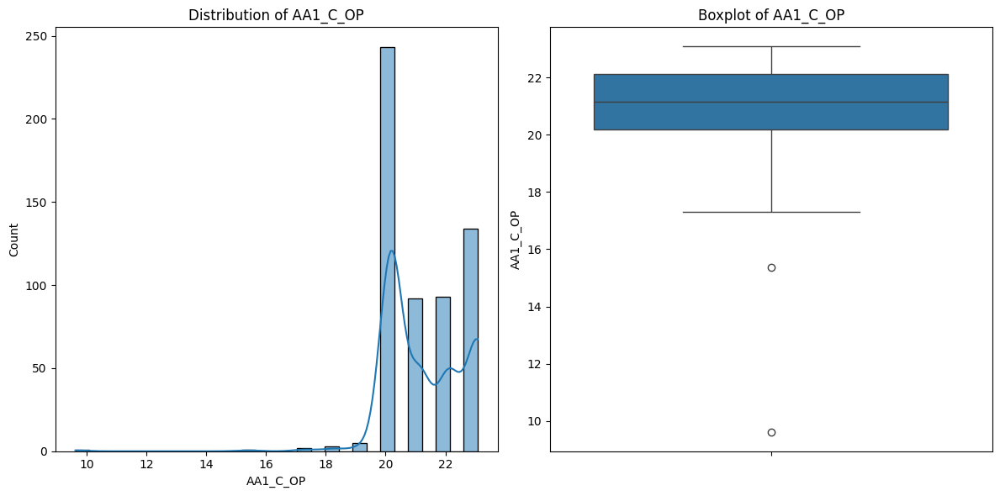


--- Summary Statistics for AA2 ---

--- Summary Statistics for AA2_91_9500062414 ---
count      482.000000
mean       753.358734
std       1324.887313
min          0.050000
25%          1.850000
50%          1.950000
75%       1808.000000
max      22703.000000
Name: AA2_91_9500062414, dtype: float64


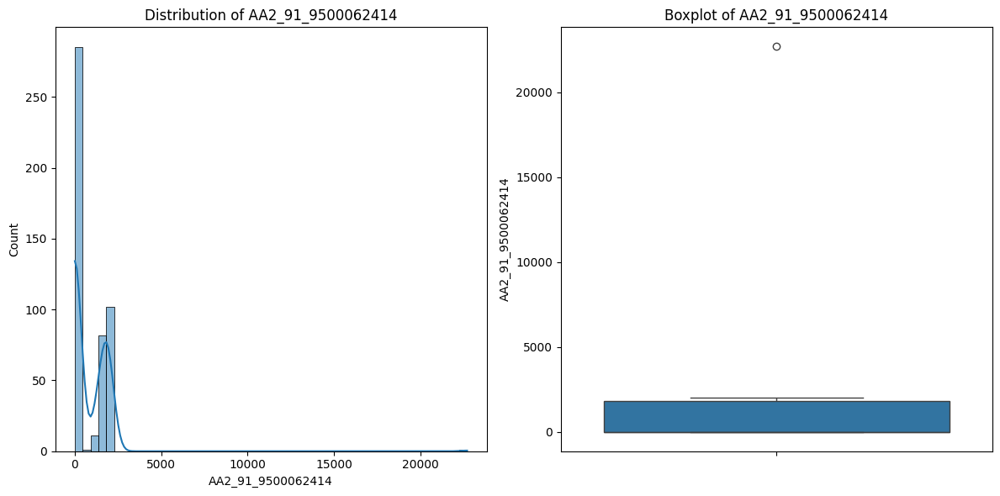


--- Summary Statistics for AA2_91_EP_NATURAL_GAS ---
count     597.000000
mean       14.284661
std       121.406809
min         0.026877
25%         1.062060
50%         1.101950
75%         1.125370
max      1226.000000
Name: AA2_91_EP_NATURAL_GAS, dtype: float64


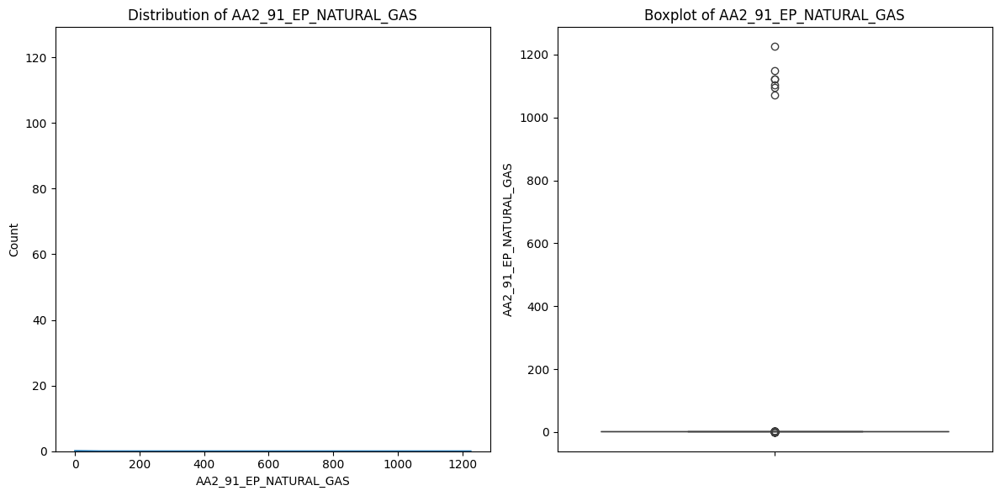


--- Summary Statistics for AA2_ANPR ---
count    615.000000
mean     249.492878
std       24.246203
min      136.110000
25%      237.095000
50%      247.080000
75%      272.200000
max      282.870000
Name: AA2_ANPR, dtype: float64


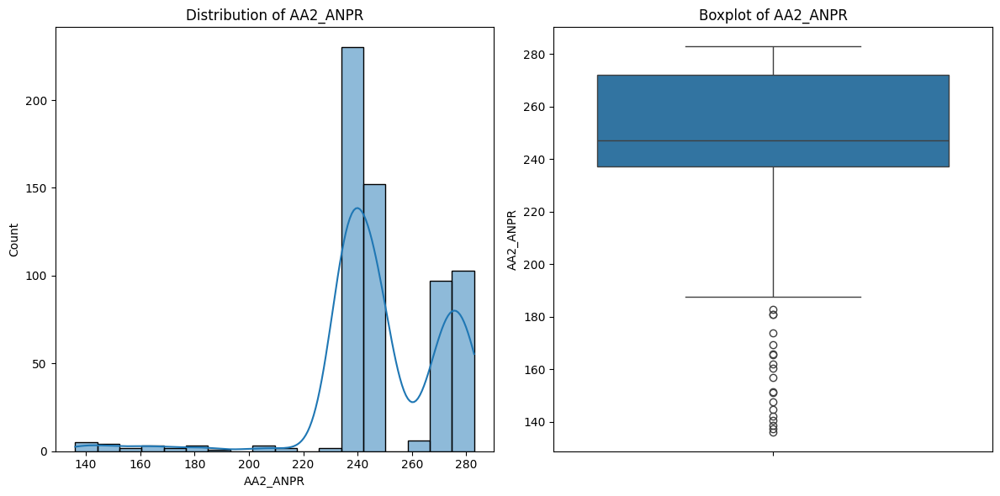


--- Summary Statistics for AA2_C_PR ---
count    615.000000
mean     154.287967
std        5.886504
min      140.740000
25%      151.575000
50%      152.820000
75%      153.965000
max      182.270000
Name: AA2_C_PR, dtype: float64


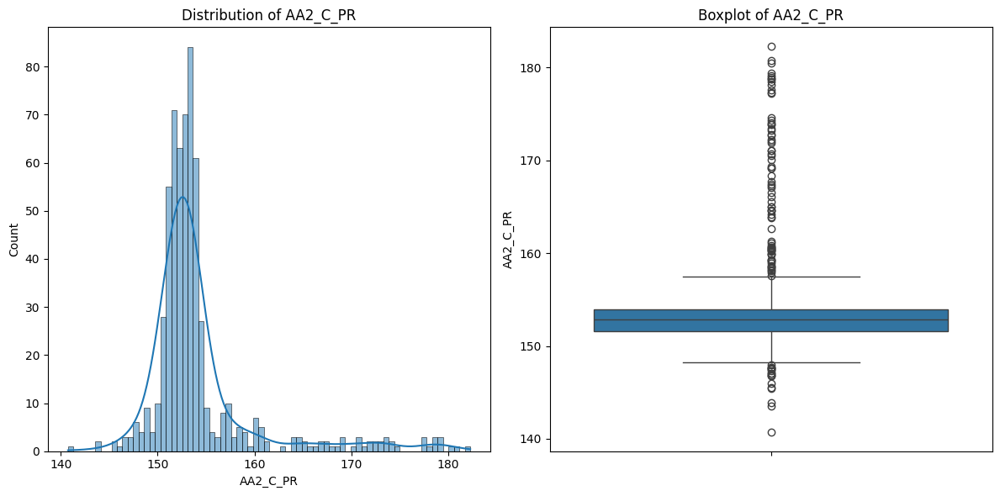


--- Summary Statistics for AA2_FBHP ---
count    615.000000
mean     243.644667
std        8.334423
min      231.010000
25%      236.795000
50%      242.270000
75%      250.390000
max      262.260000
Name: AA2_FBHP, dtype: float64


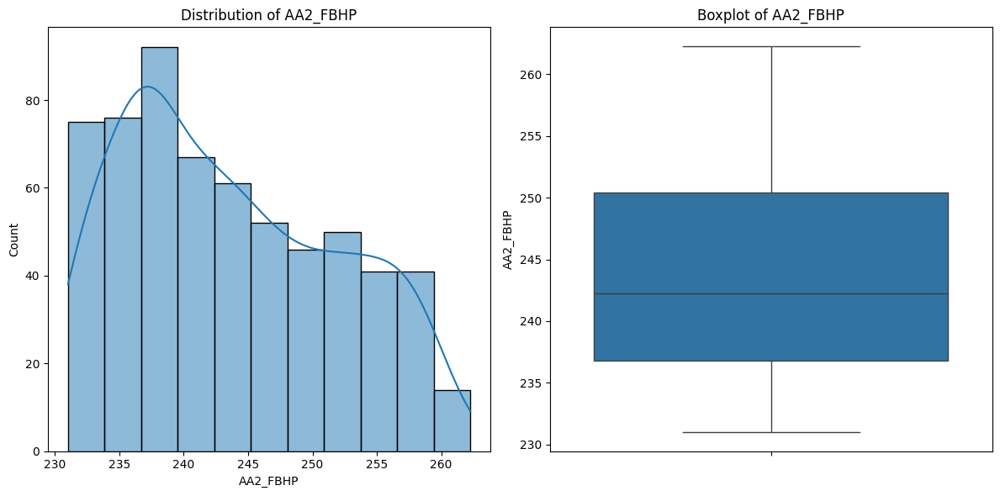


--- Summary Statistics for AA2_ANTP ---
count    615.000000
mean       6.452683
std        1.684221
min        3.500000
25%        4.700000
50%        7.000000
75%        7.700000
max       10.300000
Name: AA2_ANTP, dtype: float64


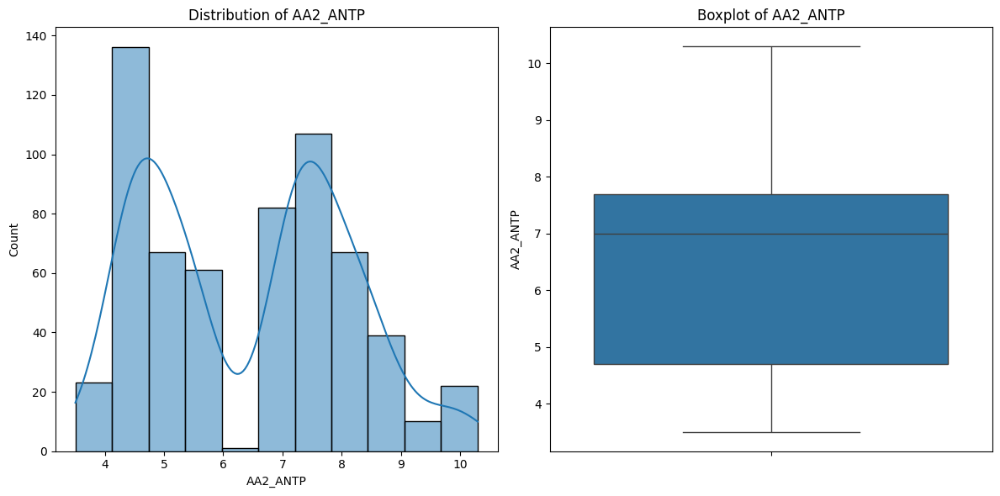


--- Summary Statistics for AA2_C_TE ---
count    615.000000
mean      18.860813
std        3.217406
min        3.000000
25%       19.000000
50%       19.400000
75%       20.000000
max       22.800000
Name: AA2_C_TE, dtype: float64


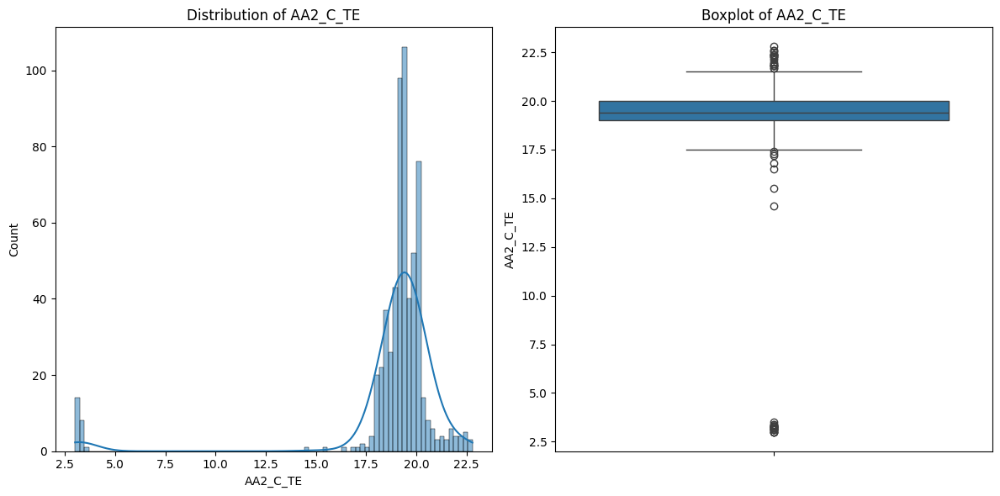


--- Summary Statistics for AA2_FBHT ---
count    615.000000
mean      36.517236
std        0.915677
min       30.000000
25%       36.600000
50%       36.700000
75%       36.700000
max       36.800000
Name: AA2_FBHT, dtype: float64


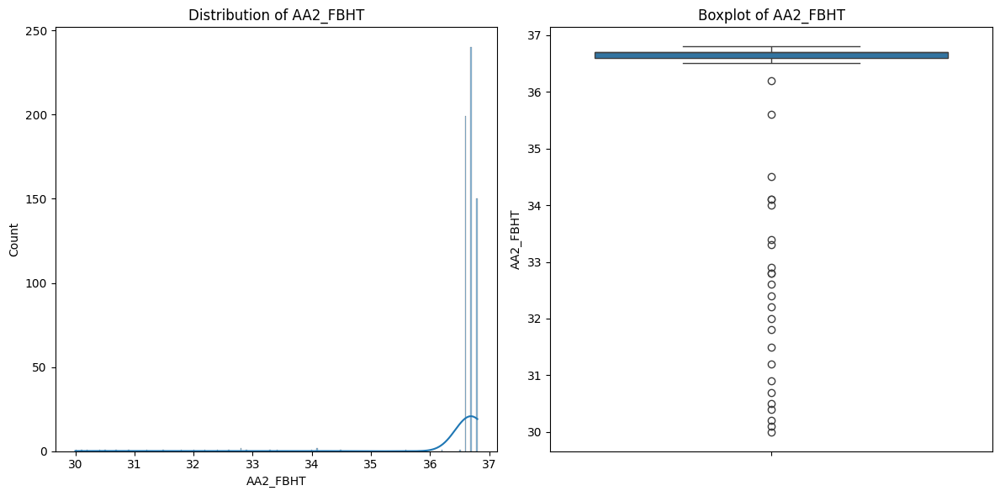


--- Summary Statistics for AA2_C_OP ---
count    595.000000
mean      30.367832
std        3.639773
min        0.970000
25%       29.130000
50%       30.100000
75%       33.010000
max       34.950000
Name: AA2_C_OP, dtype: float64


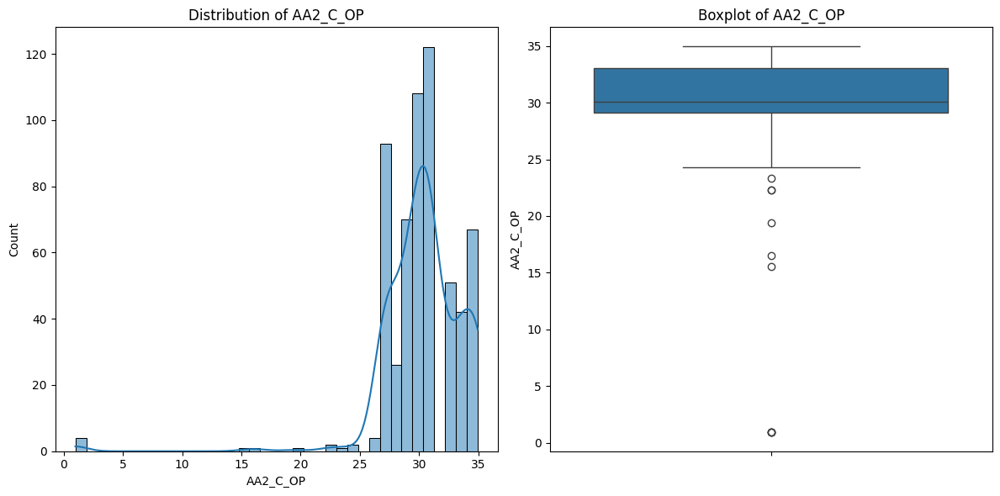


--- Summary Statistics for AA3 ---

--- Summary Statistics for AA3_91_9500062414 ---
count      487.000000
mean      1243.658871
std       2245.310932
min          0.880000
25%          3.100000
50%          3.180000
75%       3013.000000
max      39384.000000
Name: AA3_91_9500062414, dtype: float64


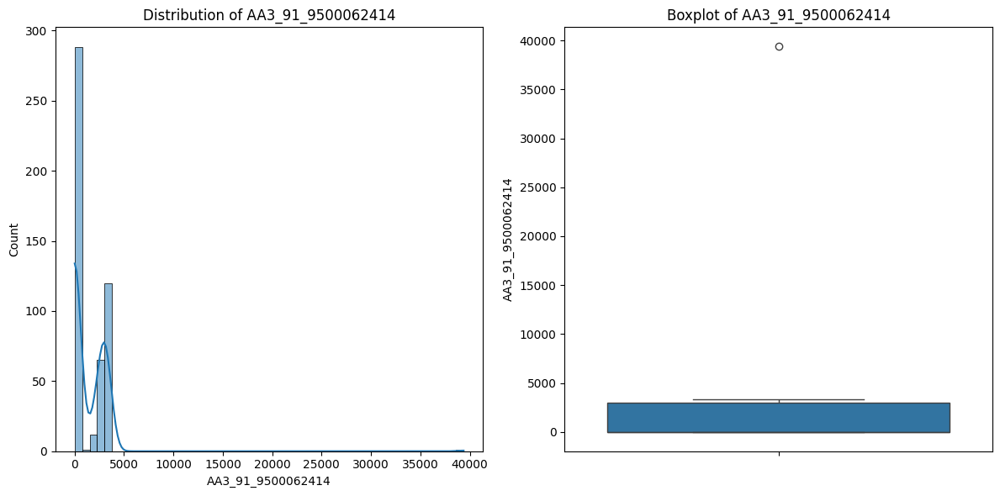


--- Summary Statistics for AA3_91_EP_NATURAL_GAS ---
count     602.000000
mean       16.986145
std       166.627409
min         0.000814
25%         1.741595
50%         1.839250
75%         1.856265
max      1883.000000
Name: AA3_91_EP_NATURAL_GAS, dtype: float64


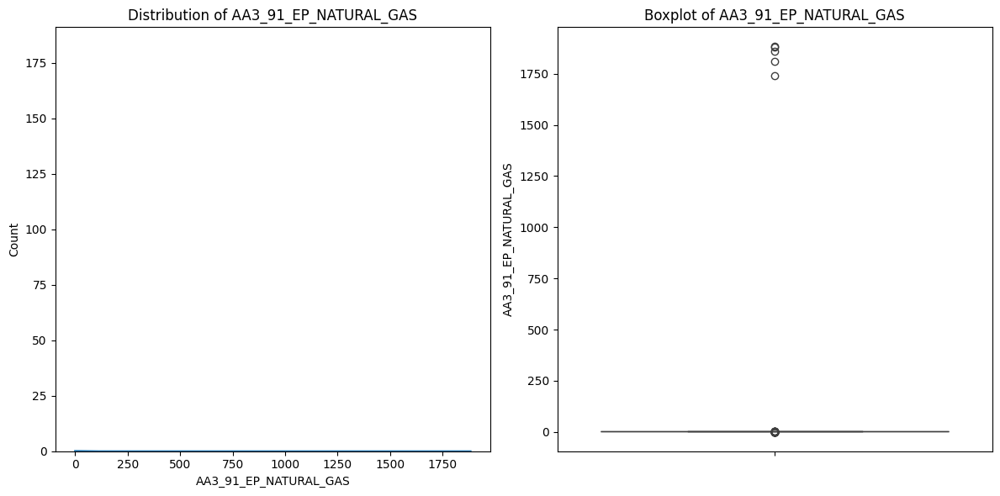


--- Summary Statistics for AA3_ANPR ---
count    613.000000
mean     292.484600
std       18.188159
min      222.890000
25%      282.440000
50%      288.080000
75%      311.760000
max      331.000000
Name: AA3_ANPR, dtype: float64


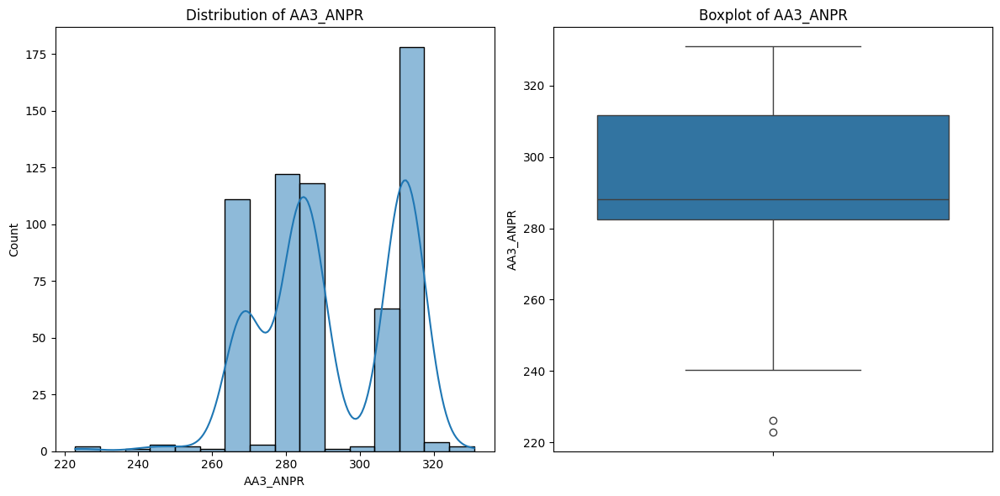


--- Summary Statistics for AA3_C_PR ---
count    613.000000
mean     130.136542
std        4.582961
min      123.180000
25%      128.030000
50%      129.170000
75%      129.940000
max      151.400000
Name: AA3_C_PR, dtype: float64


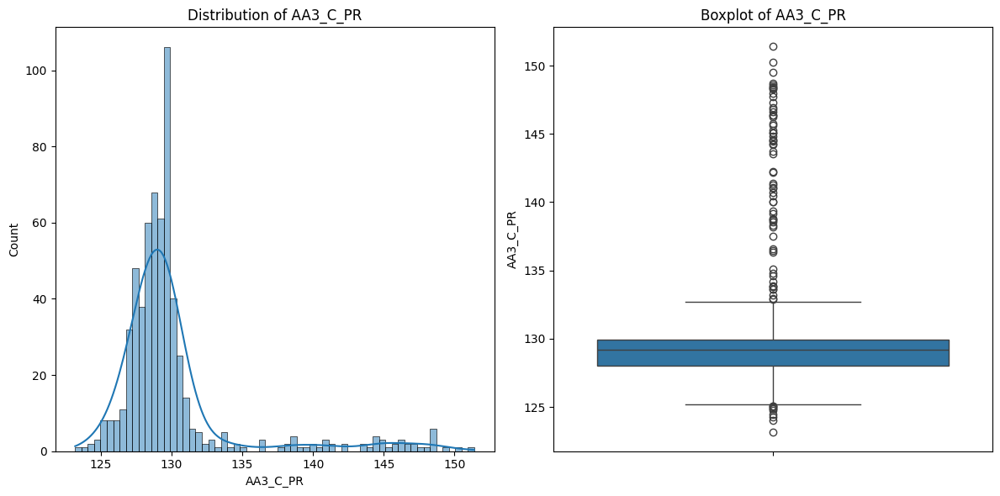


--- Summary Statistics for AA3_FBHP ---
count    613.000000
mean     304.130408
std        8.081634
min      291.270000
25%      297.280000
50%      303.360000
75%      310.310000
max      322.390000
Name: AA3_FBHP, dtype: float64


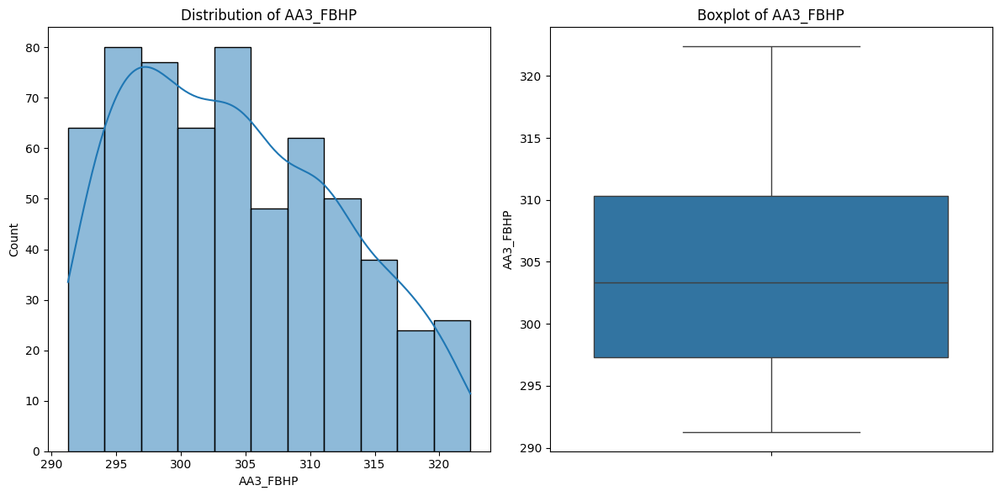


--- Summary Statistics for AA3_ANTP ---
count    613.000000
mean      14.976020
std        2.489369
min        6.100000
25%       13.800000
50%       15.500000
75%       16.700000
max       27.800000
Name: AA3_ANTP, dtype: float64


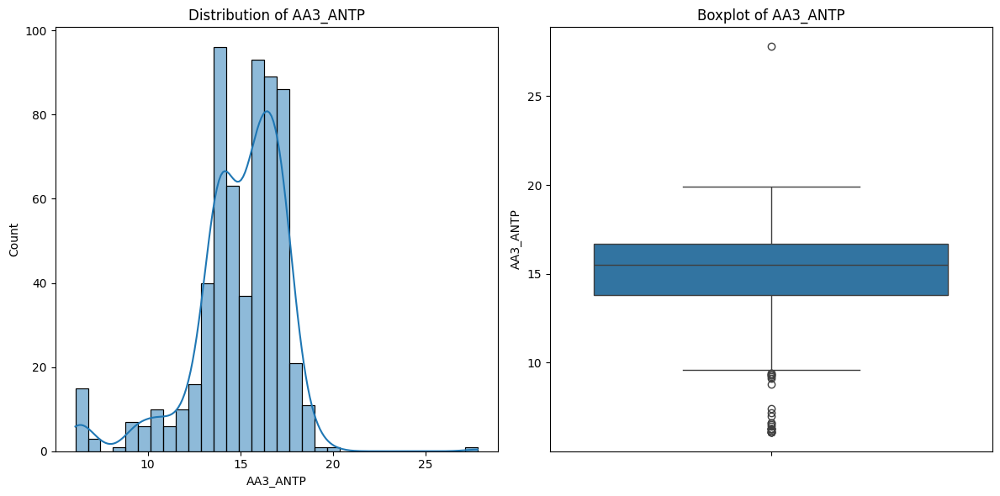


--- Summary Statistics for AA3_C_TE ---
count    613.000000
mean      57.967863
std        9.189542
min        5.100000
25%       59.000000
50%       59.900000
75%       60.400000
max       61.200000
Name: AA3_C_TE, dtype: float64


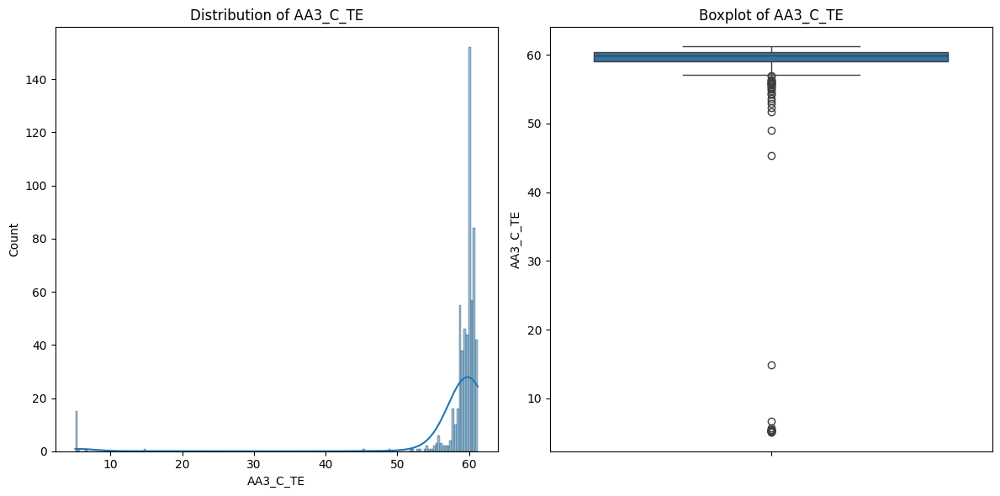


--- Summary Statistics for AA3_FBHT ---
count    613.000000
mean      92.708483
std        0.355893
min       89.900000
25%       92.700000
50%       92.700000
75%       92.800000
max       93.000000
Name: AA3_FBHT, dtype: float64


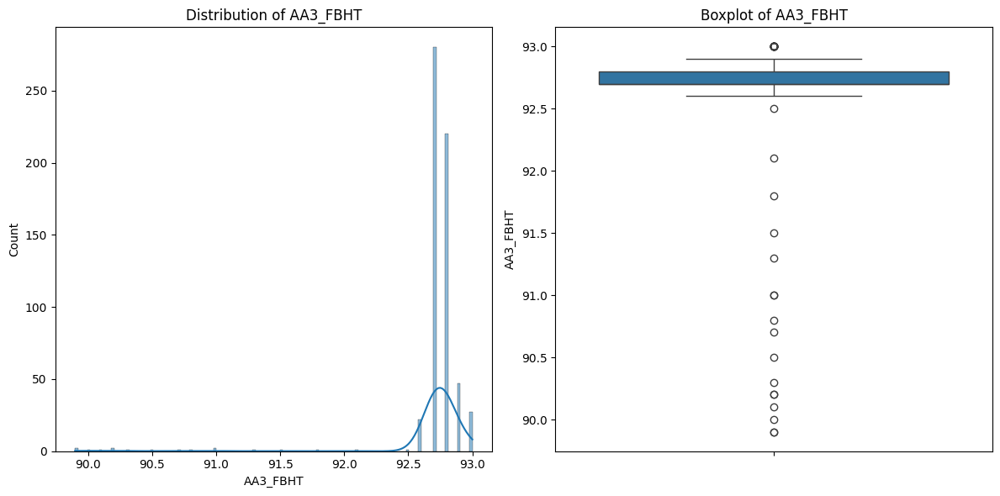


--- Summary Statistics for AA3_C_OP ---
count    597.000000
mean      38.632848
std        3.742710
min        4.810000
25%       39.420000
50%       39.420000
75%       40.380000
max       42.310000
Name: AA3_C_OP, dtype: float64


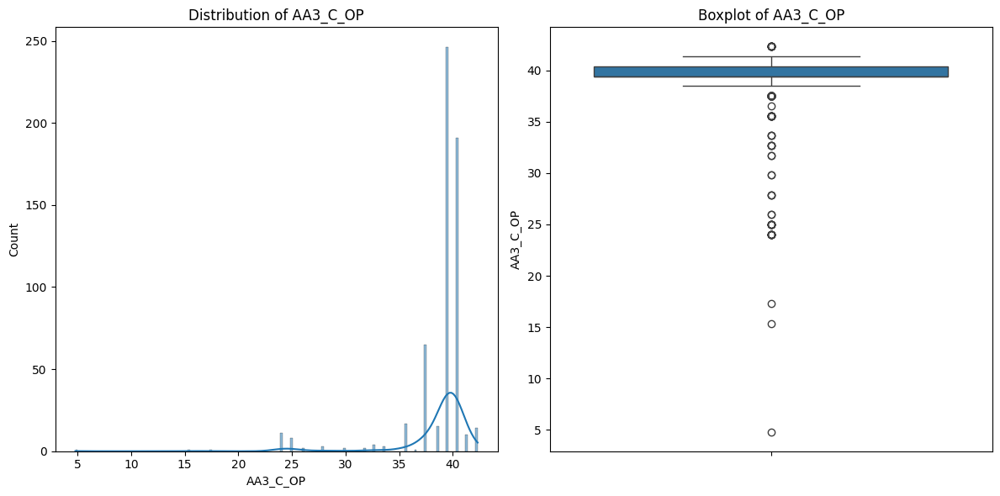


--- Summary Statistics for AA4 ---

--- Summary Statistics for AA4_91_9500062414 ---
count     487.000000
mean      760.954476
std       932.914167
min         0.850000
25%         1.910000
50%         2.150000
75%      1882.000000
max      2222.000000
Name: AA4_91_9500062414, dtype: float64


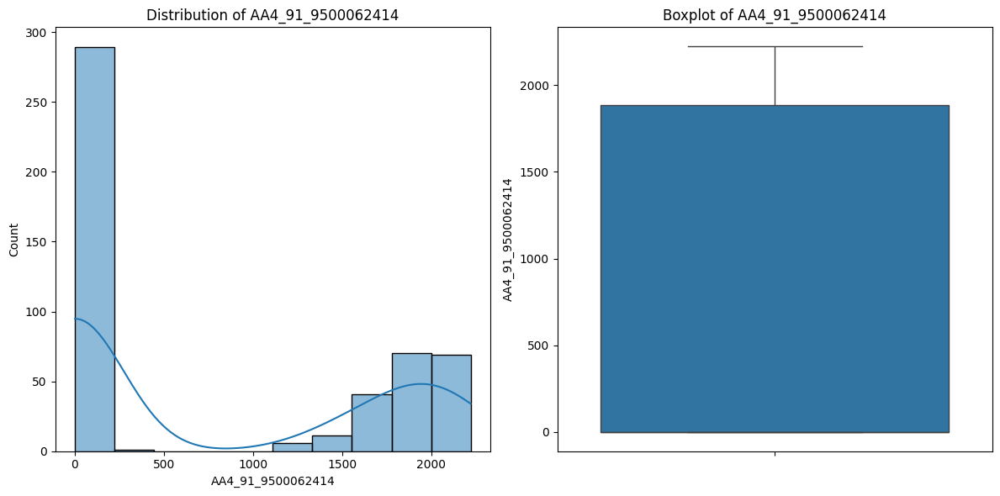


--- Summary Statistics for AA4_91_EP_NATURAL_GAS ---
count     604.000000
mean       15.268511
std       130.303543
min         0.127751
25%         1.146187
50%         1.221075
75%         1.245005
max      1286.000000
Name: AA4_91_EP_NATURAL_GAS, dtype: float64


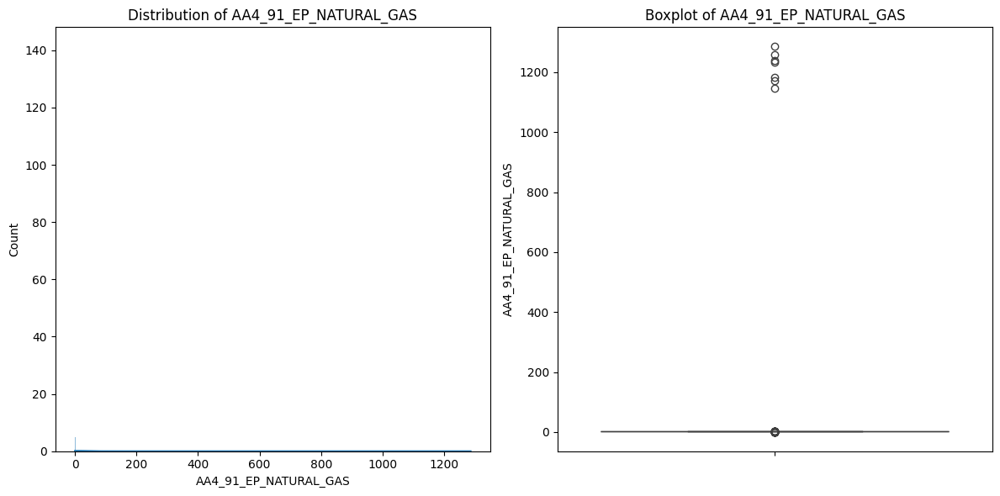


--- Summary Statistics for AA4_ANPR ---
count    613.000000
mean     213.764062
std       34.491738
min      175.600000
25%      179.210000
50%      222.080000
75%      244.900000
max      271.920000
Name: AA4_ANPR, dtype: float64


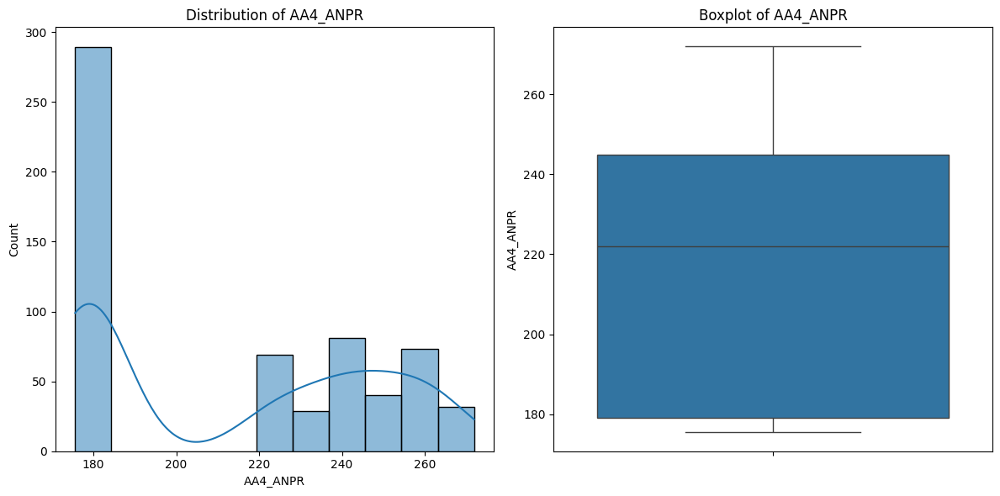


--- Summary Statistics for AA4_C_PR ---
count    613.000000
mean     142.065188
std        4.907773
min      133.120000
25%      139.950000
50%      141.010000
75%      141.900000
max      164.650000
Name: AA4_C_PR, dtype: float64


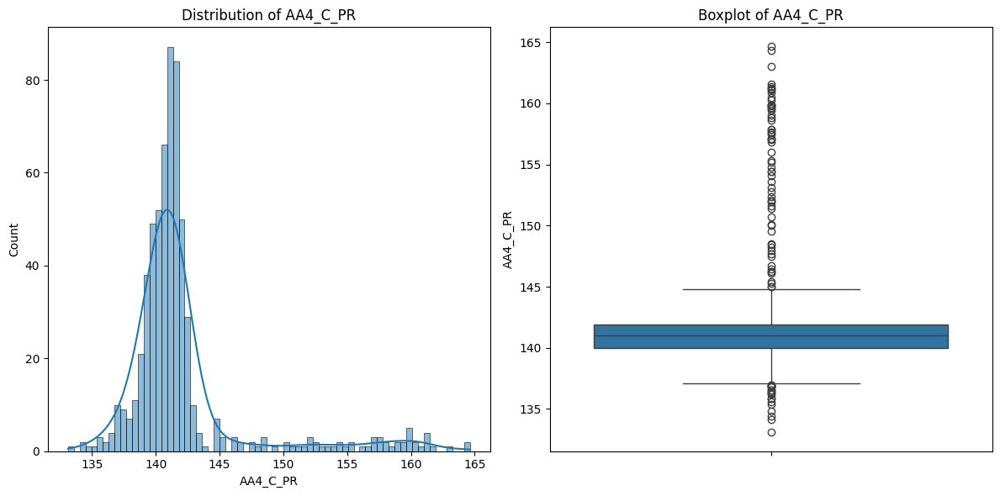


--- Summary Statistics for AA4_FBHP ---
count    613.000000
mean     235.704323
std        8.425208
min      220.730000
25%      228.520000
50%      236.730000
75%      242.060000
max      254.810000
Name: AA4_FBHP, dtype: float64


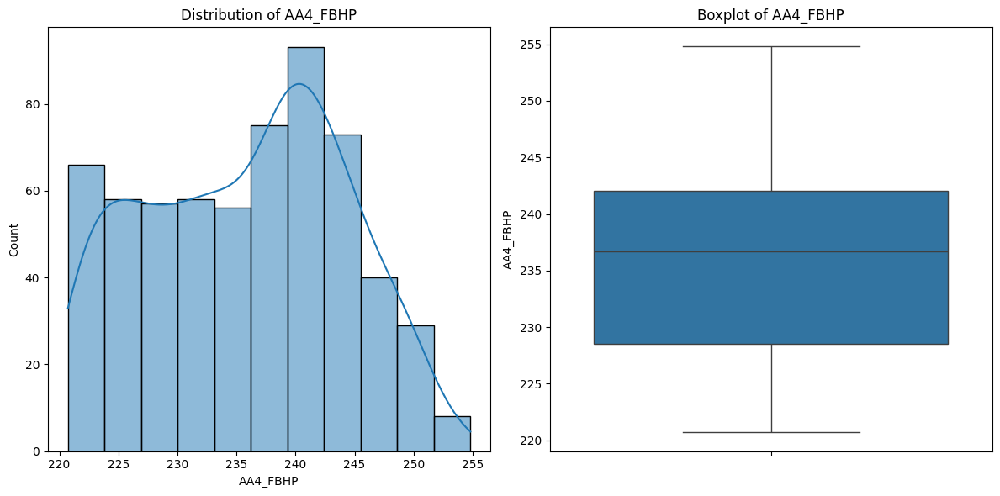


--- Summary Statistics for AA4_ANTP ---
count    613.000000
mean      11.232300
std        2.662086
min        4.100000
25%       10.900000
50%       11.400000
75%       13.100000
max       18.100000
Name: AA4_ANTP, dtype: float64


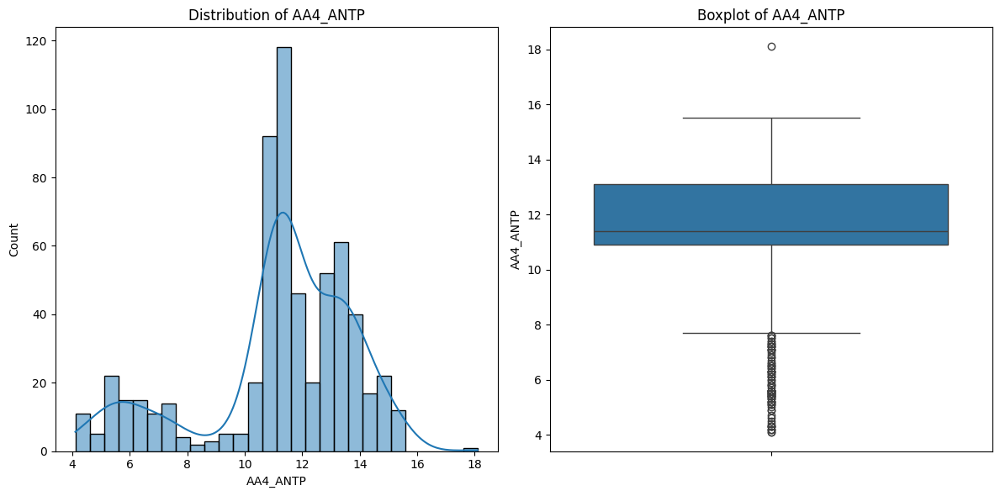


--- Summary Statistics for AA4_C_TE ---
count    613.000000
mean      27.817945
std        3.648265
min        1.300000
25%       27.800000
50%       28.400000
75%       29.000000
max       30.500000
Name: AA4_C_TE, dtype: float64


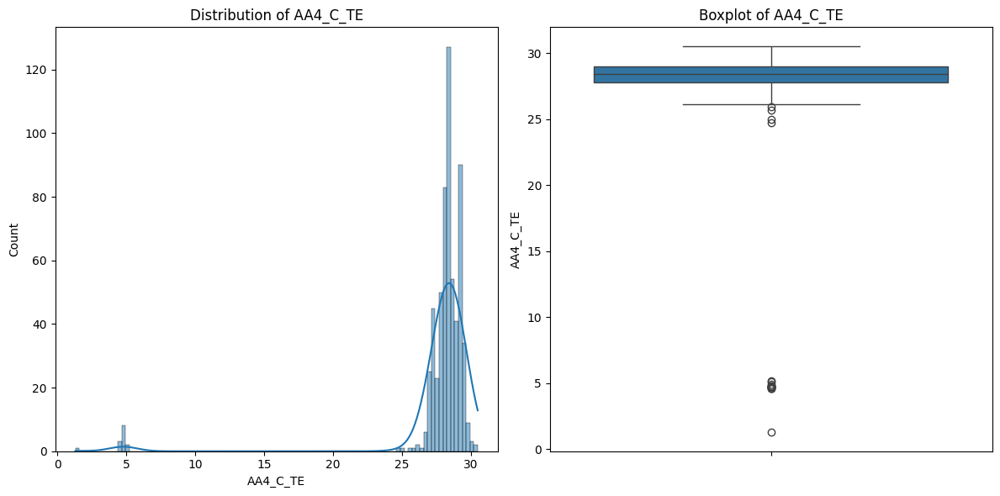


--- Summary Statistics for AA4_FBHT ---
count    613.000000
mean      48.014029
std        0.942392
min       37.200000
25%       48.000000
50%       48.200000
75%       48.300000
max       48.400000
Name: AA4_FBHT, dtype: float64


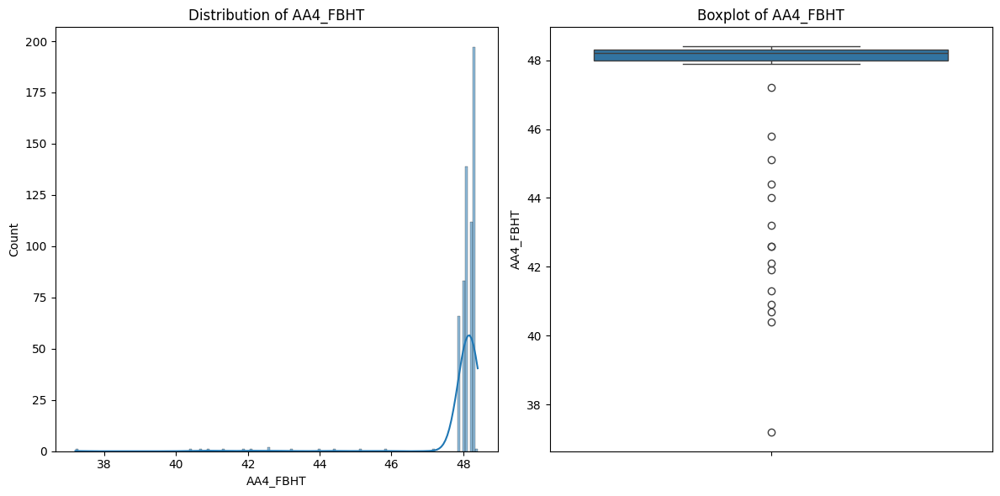


--- Summary Statistics for AA4_C_OP ---
count    599.000000
mean      33.910985
std        1.464982
min       20.950000
25%       34.290000
50%       34.290000
75%       34.290000
max       35.240000
Name: AA4_C_OP, dtype: float64


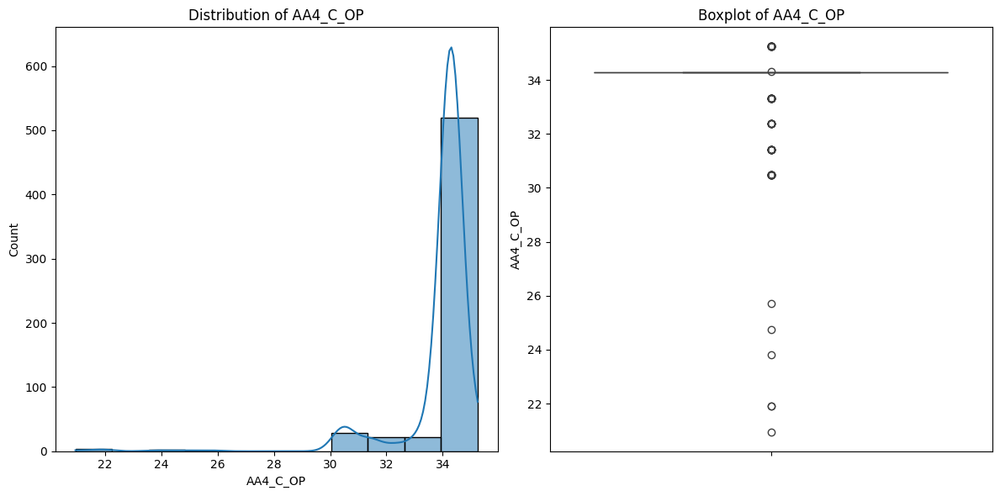


--- Summary Statistics for AA5 ---

--- Summary Statistics for AA5_91_9500062414 ---
count      483.000000
mean       909.707557
std       1705.297012
min          0.130000
25%          2.120000
50%          2.410000
75%       2107.000000
max      30604.000000
Name: AA5_91_9500062414, dtype: float64


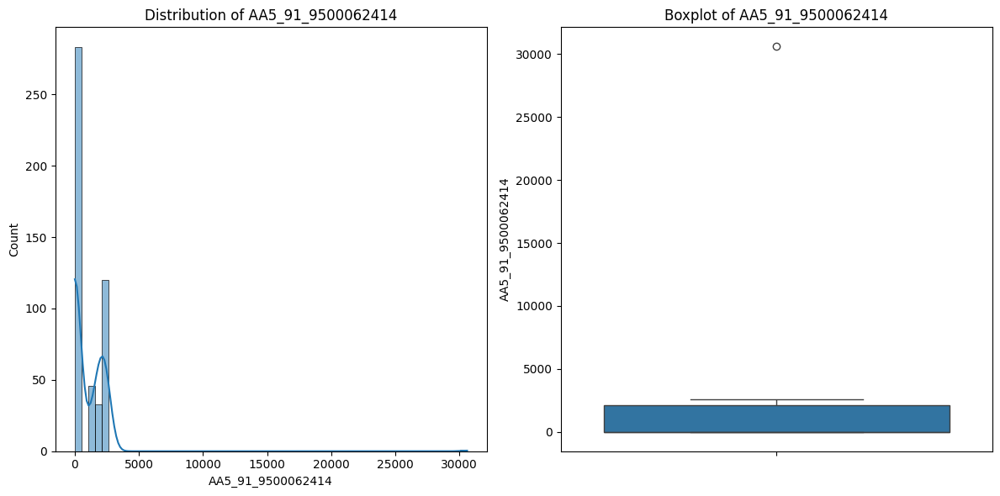


--- Summary Statistics for AA5_91_EP_NATURAL_GAS ---
count     596.000000
mean        9.564351
std       101.624050
min         0.076988
25%         1.221585
50%         1.248270
75%         1.419900
max      1443.000000
Name: AA5_91_EP_NATURAL_GAS, dtype: float64


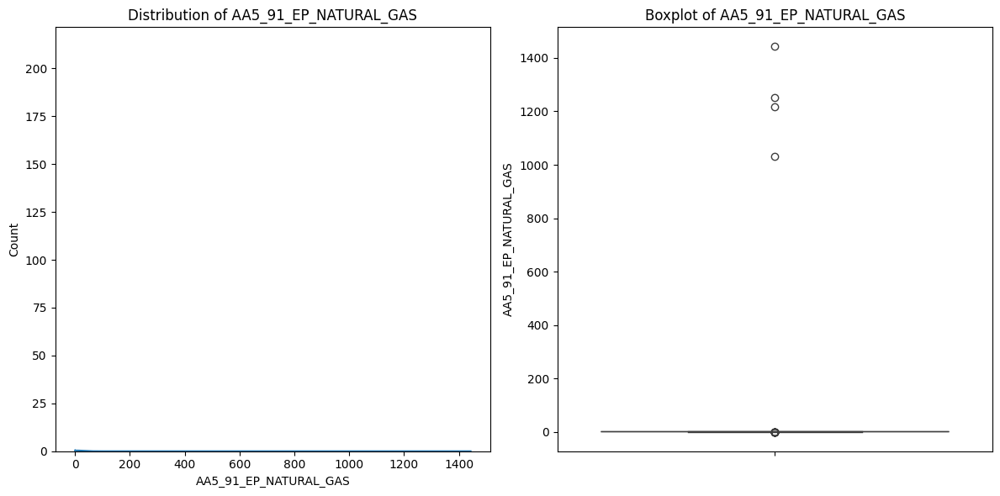


--- Summary Statistics for AA5_ANPR ---
count    614.000000
mean     236.131124
std        9.689072
min      171.140000
25%      231.332500
50%      235.700000
75%      240.055000
max      271.050000
Name: AA5_ANPR, dtype: float64


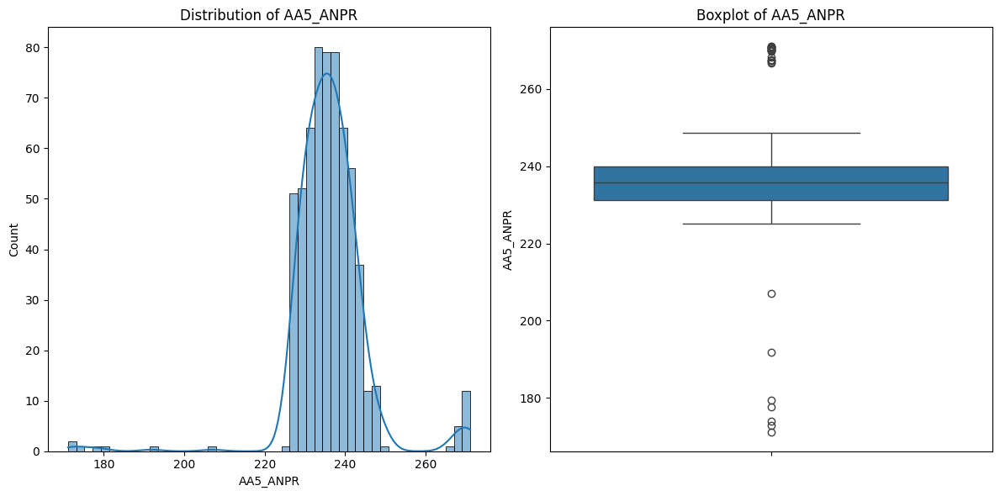


--- Summary Statistics for AA5_C_PR ---
count    614.000000
mean     149.329772
std        6.389268
min      136.810000
25%      146.380000
50%      147.575000
75%      149.477500
max      176.090000
Name: AA5_C_PR, dtype: float64


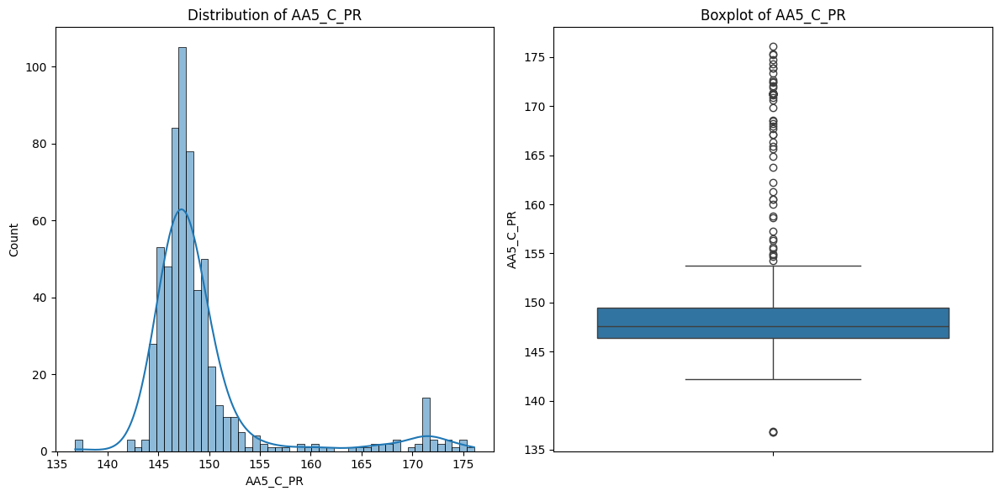


--- Summary Statistics for AA5_FBHP ---
count    614.000000
mean     243.825651
std        5.608304
min      234.630000
25%      238.997500
50%      243.585000
75%      248.005000
max      255.620000
Name: AA5_FBHP, dtype: float64


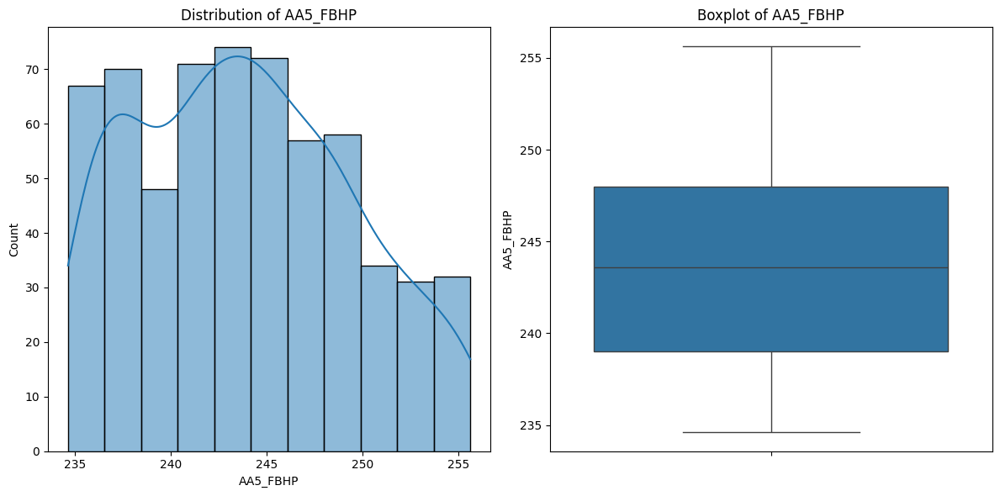


--- Summary Statistics for AA5_ANTP ---
count    614.000000
mean       5.804560
std        0.637244
min        3.000000
25%        5.700000
50%        5.900000
75%        6.100000
max        7.700000
Name: AA5_ANTP, dtype: float64


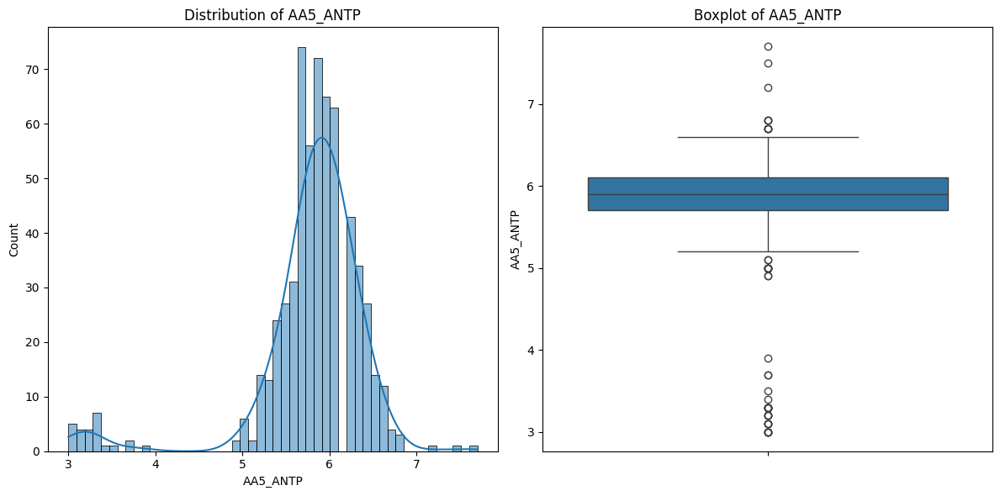


--- Summary Statistics for AA5_C_TE ---
count    614.000000
mean      11.300489
std        1.885823
min        2.700000
25%       11.000000
50%       11.200000
75%       12.100000
max       15.800000
Name: AA5_C_TE, dtype: float64


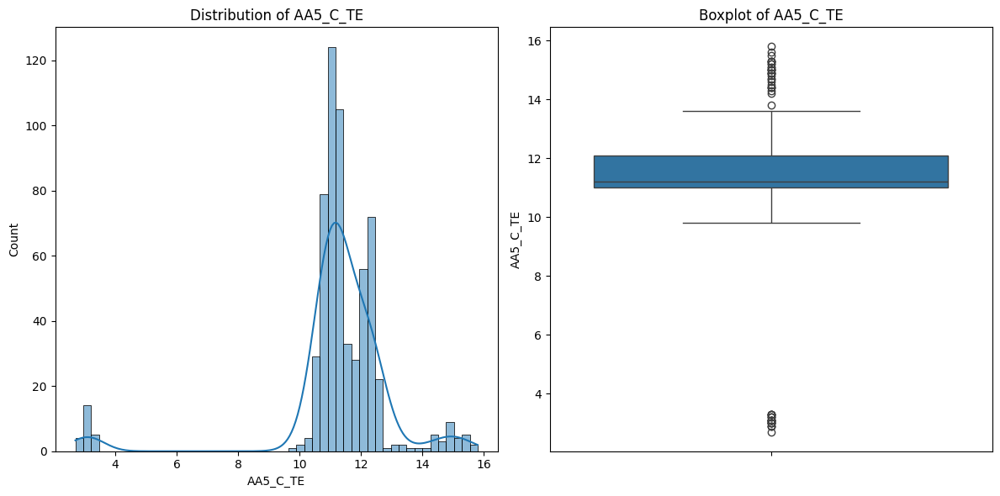


--- Summary Statistics for AA5_FBHT ---
count    614.000000
mean      28.879479
std        1.035316
min       21.600000
25%       29.000000
50%       29.100000
75%       29.100000
max       29.200000
Name: AA5_FBHT, dtype: float64


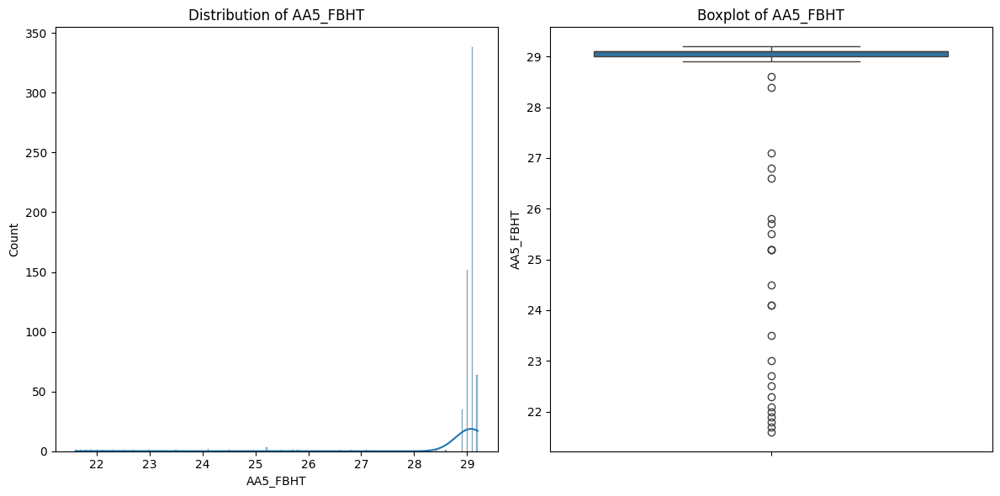


--- Summary Statistics for AA5_C_OP ---
count    591.000000
mean      30.967259
std        2.649282
min       17.310000
25%       28.850000
50%       29.810000
75%       33.650000
max       34.620000
Name: AA5_C_OP, dtype: float64


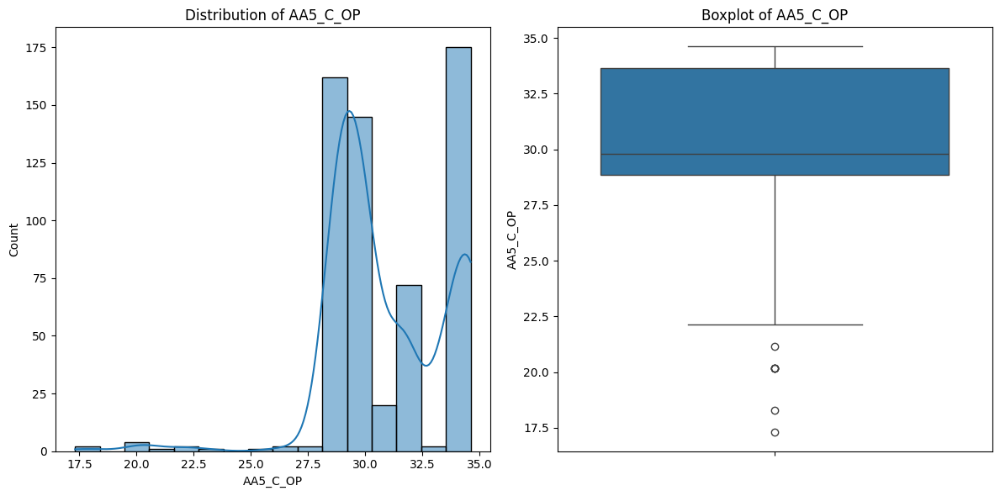

In [15]:
# Key variables for each well
key_variables = ['91_9500062414', '91_EP_NATURAL_GAS', 'ANPR', 'C_PR', 'FBHP', 'ANTP', 'C_TE', 'FBHT', 'C_OP']

# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\n--- Summary Statistics for {well} ---")
    for var in key_variables:
        column_name = f'{well}_{var}'
        print(f"\n--- Summary Statistics for {column_name} ---")
        print(df[column_name].describe())
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sns.histplot(df[column_name], kde=True)
        plt.title(f'Distribution of {column_name}')
        plt.subplot(1, 2, 2)
        sns.boxplot(y=df[column_name])
        plt.title(f'Boxplot of {column_name}')
        plt.tight_layout()
        plt.show()

# DATA CLEANING

In [8]:
def remove_outliers_iqr(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return np.clip(data, lower_bound, upper_bound)

for col in df.columns:
    if col != 'DATE_TIME':
        df[col] = remove_outliers_iqr(df[col])
        df[col] = df[col].replace(0, np.nan)
        df[col] = df[col].interpolate(method='linear')

display(df.head())

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,2021-04-01,NaN,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
1,2021-04-02,NaN,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
2,2021-04-03,NaN,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
3,2021-04-04,NaN,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
4,2021-04-05,NaN,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1


In [9]:
for col in df.columns:
    if col != 'DATE_TIME':
        df[col] = remove_outliers_iqr(df[col])
        df[col] = df[col].replace(0, np.nan)
        # Try linear interpolation first
        df[col] = df[col].interpolate(method='linear')
        # If there are still NaNs after linear interpolation (likely due to large gaps), use forward and backward fill
        df[col] = df[col].fillna(method='ffill').fillna(method='bfill')

display(df.head())

<ipython-input-9-08b48b500371>:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col] = df[col].fillna(method='ffill').fillna(method='bfill')
<ipython-input-9-08b48b500371>:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col] = df[col].fillna(method='ffill').fillna(method='bfill')
<ipython-input-9-08b48b500371>:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col] = df[col].fillna(method='ffill').fillna(method='bfill')
<ipython-input-9-08b48b500371>:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[col] = df[col].fillna(method='ffill').fillna(method='bfill')
<ipython-input-9-08b48b500371>:8: FutureWarning: Series.fillna with 

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,2021-04-01,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
1,2021-04-02,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
2,2021-04-03,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
3,2021-04-04,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
4,2021-04-05,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1


In [10]:
df.shape

(640, 56)

In [11]:
df.head()

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,2021-04-01,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
1,2021-04-02,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
2,2021-04-03,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
3,2021-04-04,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1
4,2021-04-05,1.34,0.651623,223.535,5.25,17.295,146.49875,17.25,214.78875,38.15,...,0.899936,217.82,4.85,21.65,141.5675,9.1,224.25375,28.85,215.95375,24.1


In [ ]:
df.shape

(640, 56)


--- Summary Statistics for AA1 ---

--- Summary Statistics for AA1_91_9500062414 ---
count     640.000000
mean      360.654537
std       546.589256
min         0.200000
25%         1.260000
50%         1.340000
75%       931.000000
max      2326.363750
Name: AA1_91_9500062414, dtype: float64


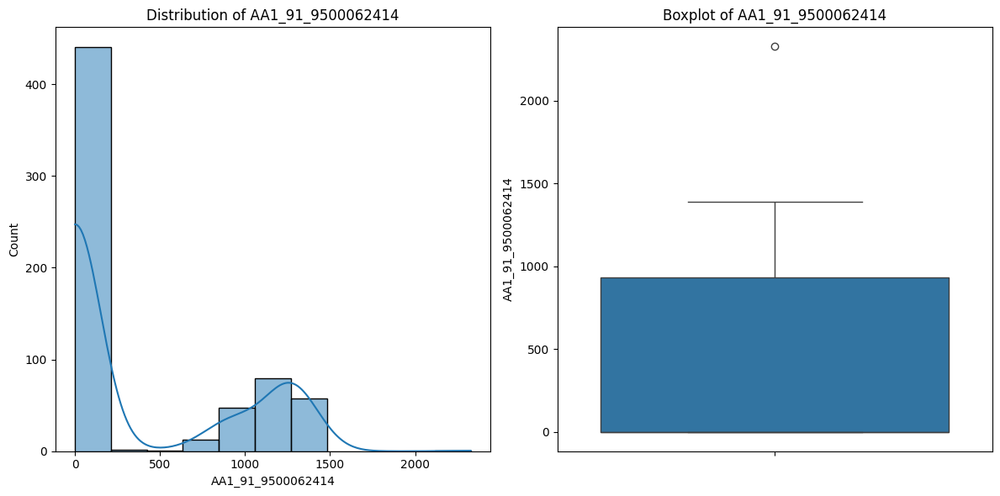


--- Summary Statistics for AA1_91_EP_NATURAL_GAS ---
count    640.000000
mean       0.730386
std        0.040914
min        0.651623
25%        0.713450
50%        0.731820
75%        0.754668
max        0.816495
Name: AA1_91_EP_NATURAL_GAS, dtype: float64


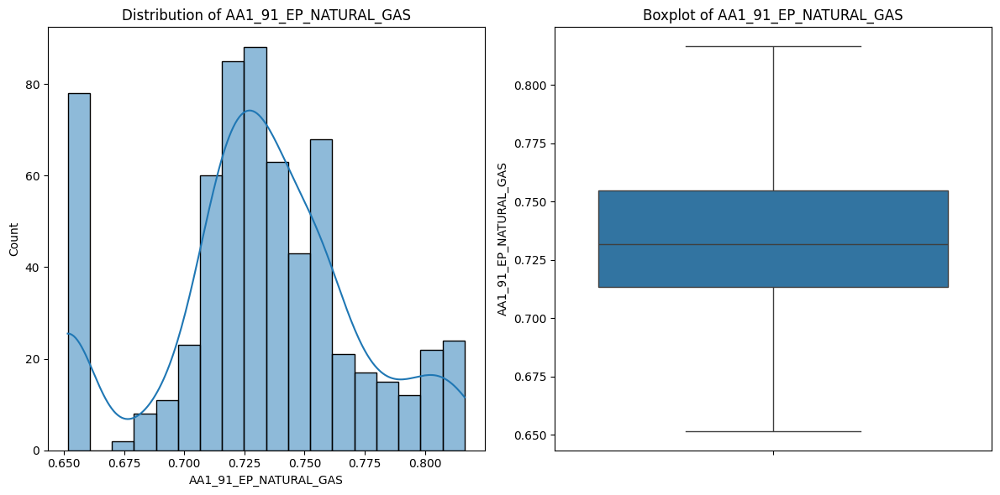


--- Summary Statistics for AA1_ANPR ---
count    640.000000
mean     238.931484
std        6.709745
min      223.535000
25%      235.137500
50%      238.715000
75%      242.872500
max      254.475000
Name: AA1_ANPR, dtype: float64


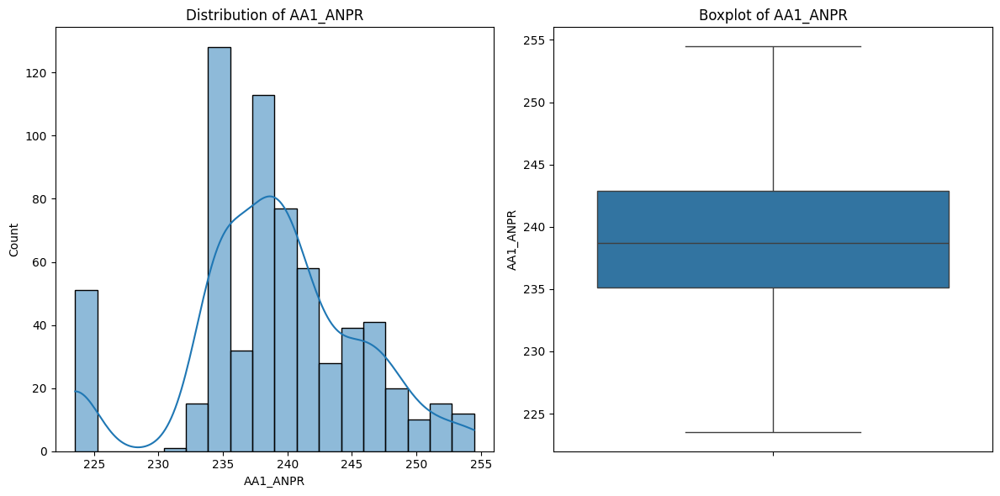


--- Summary Statistics for AA1_C_PR ---
count    640.000000
mean     151.443564
std        2.451128
min      146.498750
25%      150.080000
50%      151.370000
75%      152.467500
max      156.048750
Name: AA1_C_PR, dtype: float64


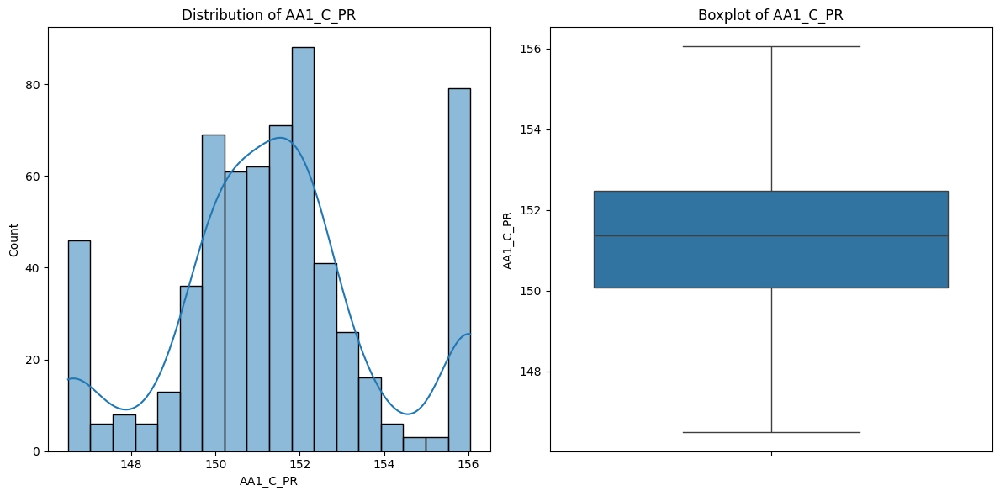


--- Summary Statistics for AA1_FBHP ---
count    640.000000
mean     241.828496
std        9.969557
min      214.788750
25%      235.132500
50%      241.115000
75%      248.695000
max      262.130000
Name: AA1_FBHP, dtype: float64


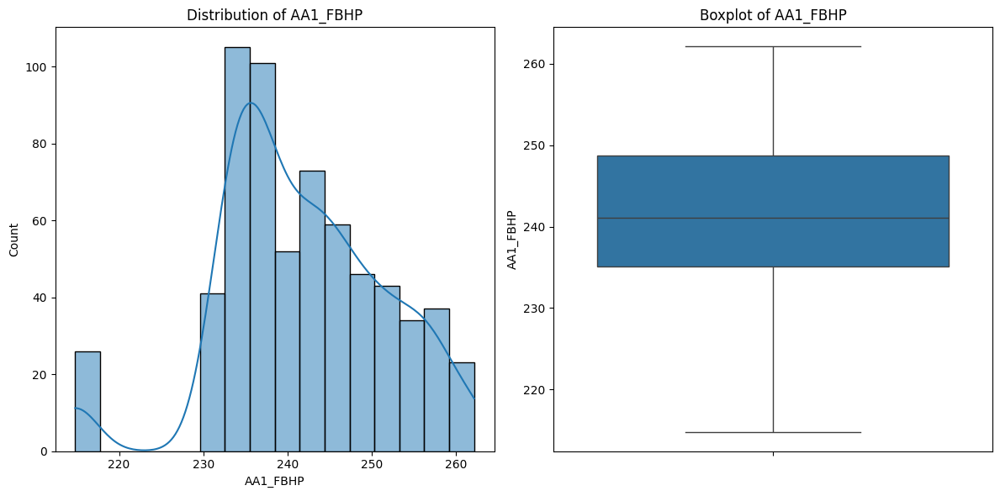


--- Summary Statistics for AA1_ANTP ---
count    640.000000
mean       7.276484
std        0.976295
min        5.250000
25%        6.900000
50%        7.400000
75%        8.000000
max        9.650000
Name: AA1_ANTP, dtype: float64


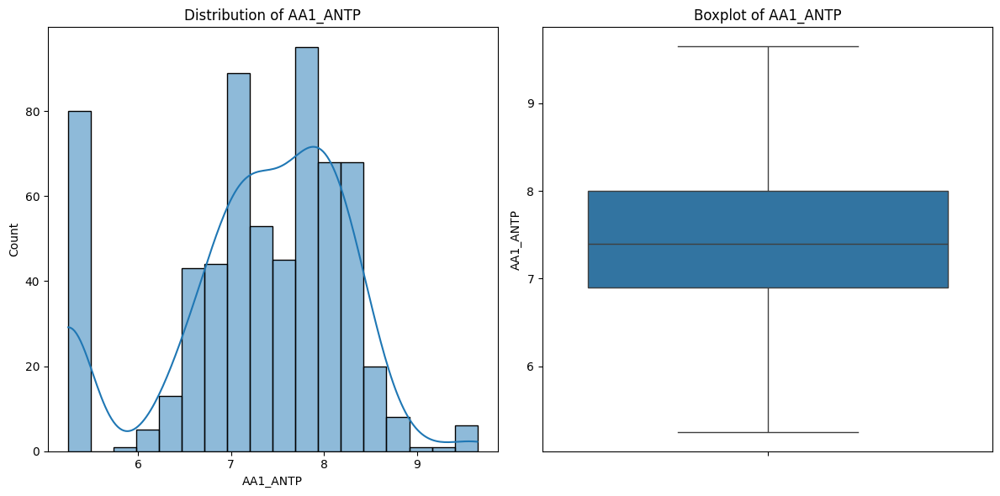


--- Summary Statistics for AA1_C_TE ---
count    640.000000
mean      18.967969
std        0.820772
min       17.250000
25%       18.600000
50%       19.100000
75%       19.500000
max       20.850000
Name: AA1_C_TE, dtype: float64


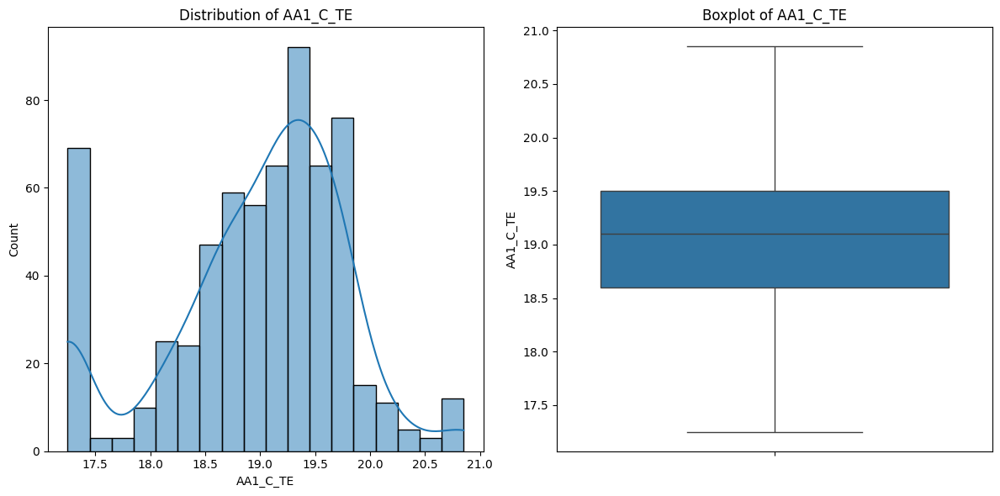


--- Summary Statistics for AA1_FBHT ---
count    640.000000
mean      38.327578
std        0.078181
min       38.150000
25%       38.300000
50%       38.300000
75%       38.400000
max       38.400000
Name: AA1_FBHT, dtype: float64


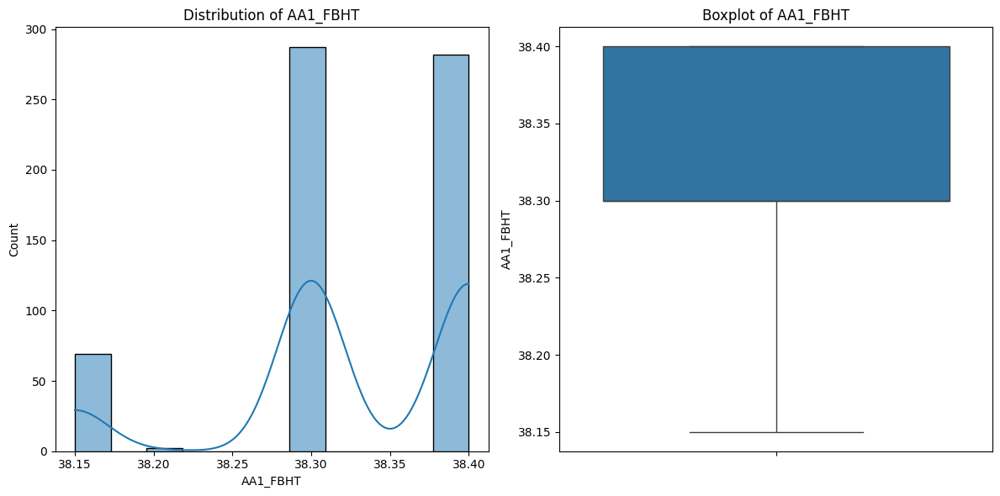


--- Summary Statistics for AA1_C_OP ---
count    640.000000
mean      20.880469
std        1.700332
min       17.295000
25%       20.190000
50%       20.195000
75%       22.120000
max       23.080000
Name: AA1_C_OP, dtype: float64


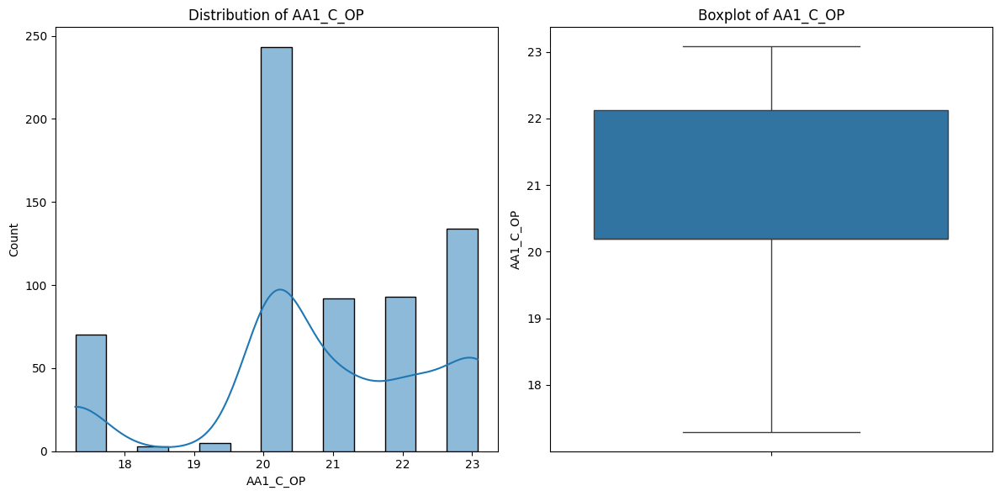


--- Summary Statistics for AA2 ---

--- Summary Statistics for AA2_91_9500062414 ---
count     640.000000
mean      539.934408
std       820.040730
min         0.050000
25%         1.850000
50%         1.910000
75%      1457.000000
max      3642.016250
Name: AA2_91_9500062414, dtype: float64


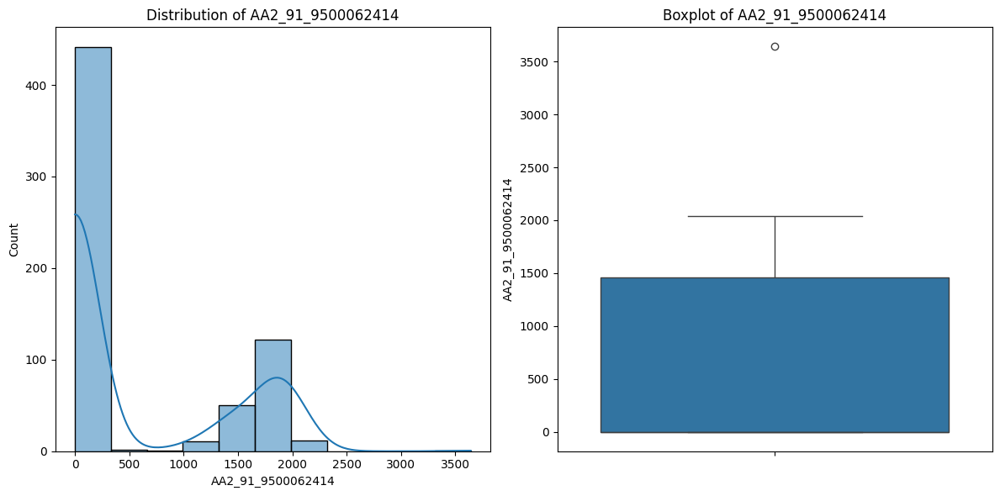


--- Summary Statistics for AA2_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.088873
std        0.067482
min        0.955183
25%        1.056553
50%        1.096910
75%        1.124132
max        1.225502
Name: AA2_91_EP_NATURAL_GAS, dtype: float64


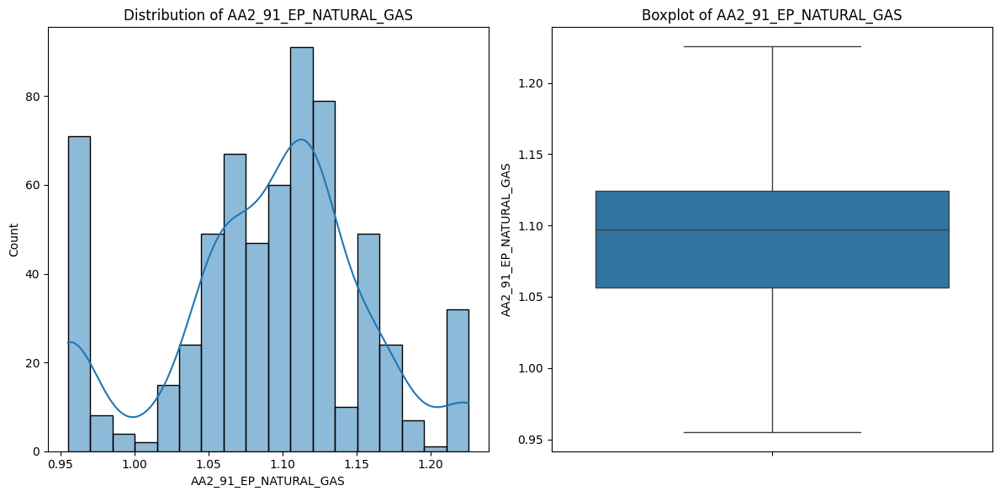


--- Summary Statistics for AA2_ANPR ---
count    640.000000
mean     247.699172
std       24.514850
min      183.552500
25%      236.352500
50%      246.225000
75%      271.552500
max      282.870000
Name: AA2_ANPR, dtype: float64


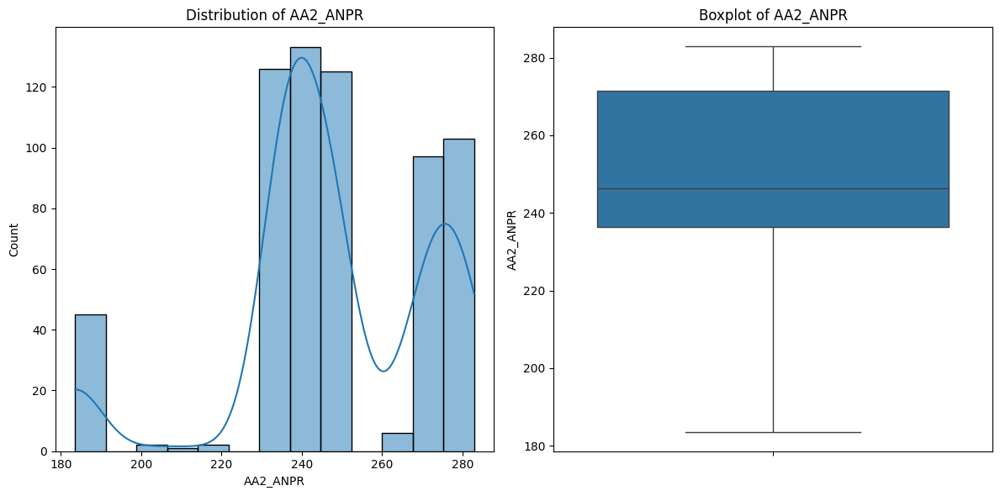


--- Summary Statistics for AA2_C_PR ---
count    640.000000
mean     152.898434
std        2.574581
min      147.741250
25%      151.450000
50%      152.755000
75%      153.922500
max      157.631250
Name: AA2_C_PR, dtype: float64


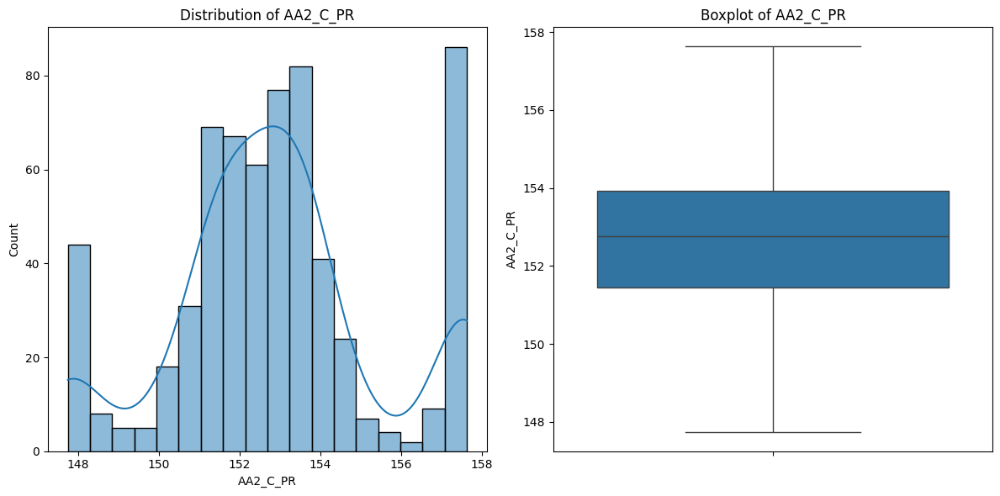


--- Summary Statistics for AA2_FBHP ---
count    640.000000
mean     242.548098
std        9.816918
min      215.572500
25%      236.242500
50%      241.765000
75%      250.022500
max      262.260000
Name: AA2_FBHP, dtype: float64


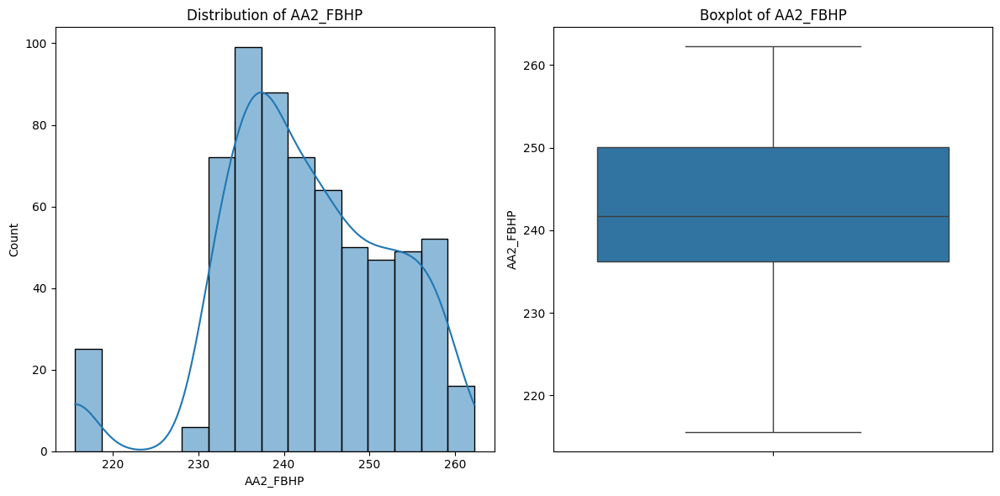


--- Summary Statistics for AA2_ANTP ---
count    640.000000
mean       6.214297
std        2.031201
min        0.350000
25%        4.700000
50%        6.800000
75%        7.600000
max       10.300000
Name: AA2_ANTP, dtype: float64


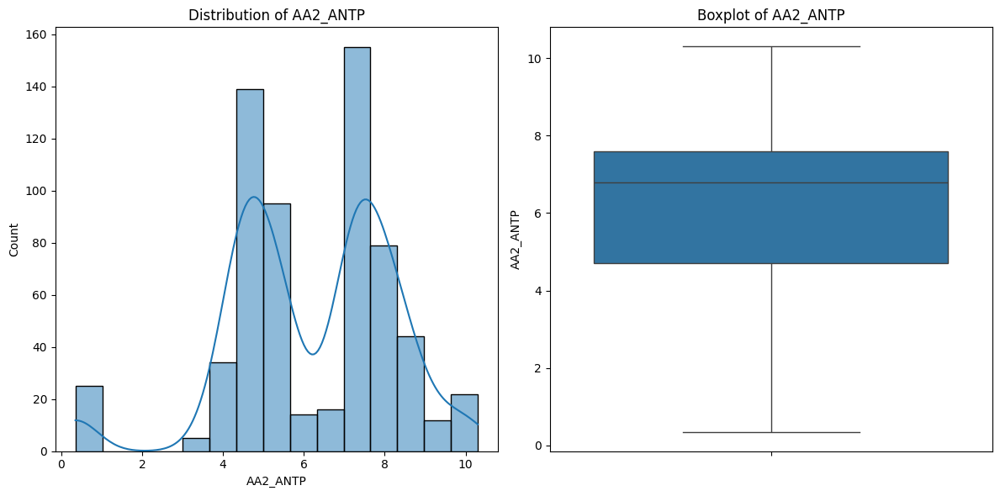


--- Summary Statistics for AA2_C_TE ---
count    640.000000
mean      19.282188
std        0.992879
min       17.150000
25%       18.800000
50%       19.400000
75%       19.900000
max       21.550000
Name: AA2_C_TE, dtype: float64


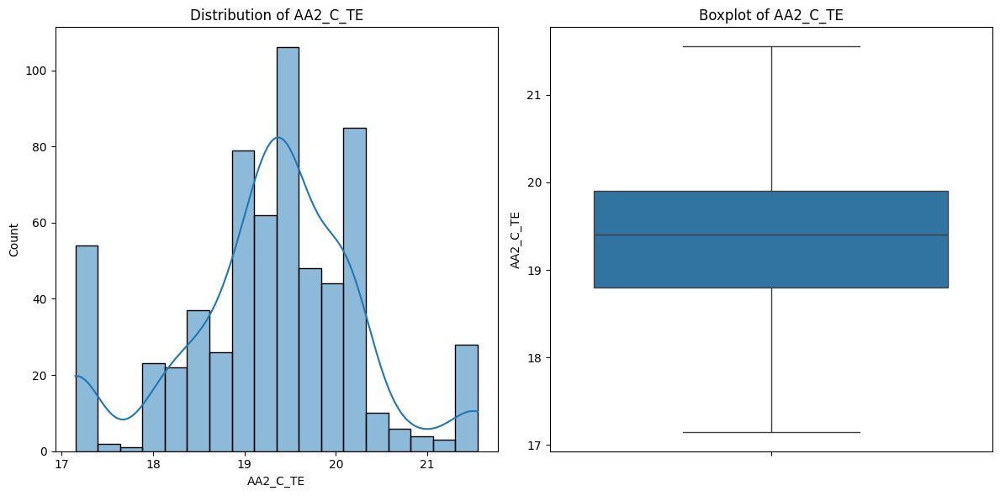


--- Summary Statistics for AA2_FBHT ---
count    640.000000
mean      36.672500
std        0.098271
min       36.450000
25%       36.600000
50%       36.700000
75%       36.700000
max       36.800000
Name: AA2_FBHT, dtype: float64


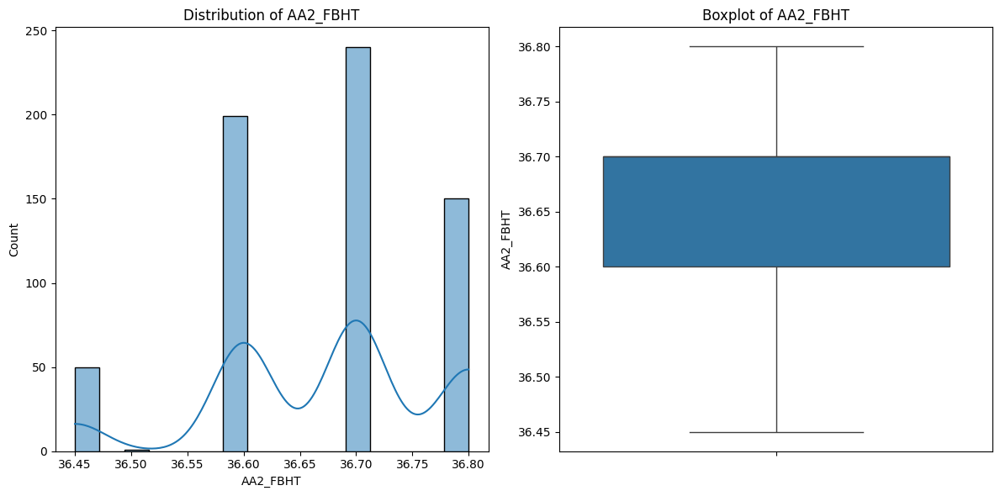


--- Summary Statistics for AA2_C_OP ---
count    640.00000
mean      30.02268
std        3.20223
min       23.06750
25%       28.16000
50%       30.10000
75%       31.55500
max       34.95000
Name: AA2_C_OP, dtype: float64


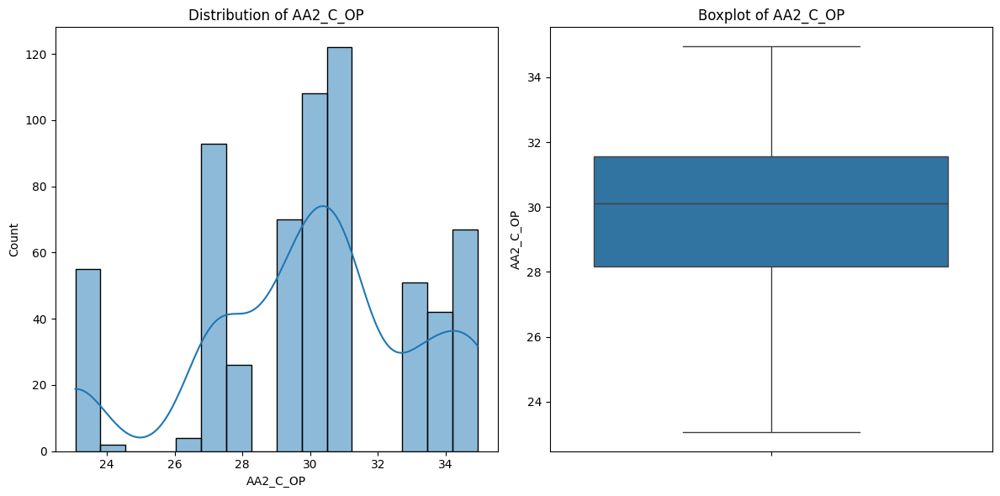


--- Summary Statistics for AA3 ---

--- Summary Statistics for AA3_91_9500062414 ---
count     640.000000
mean      894.802586
std      1356.097483
min         0.880000
25%         2.980000
50%         3.140000
75%      2377.000000
max      5939.845000
Name: AA3_91_9500062414, dtype: float64


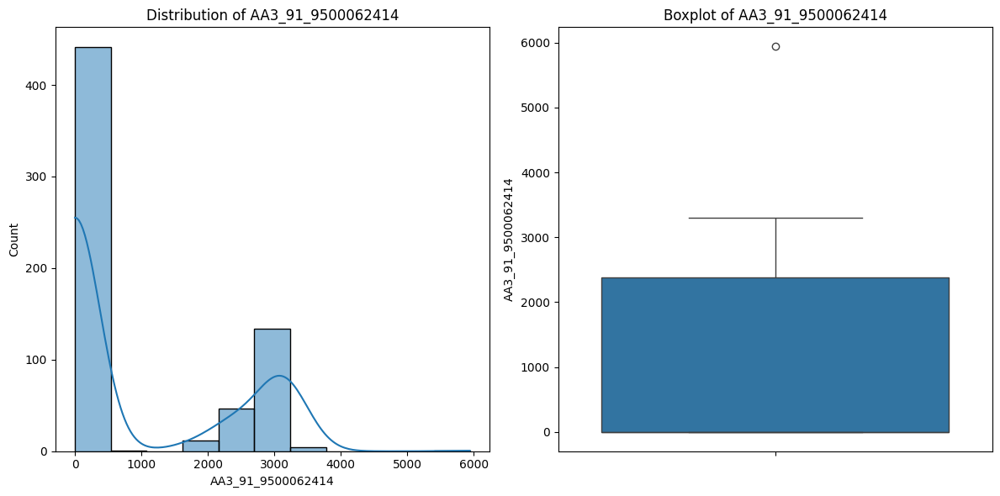


--- Summary Statistics for AA3_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.784072
std        0.107070
min        1.551117
25%        1.733825
50%        1.828840
75%        1.855630
max        2.038338
Name: AA3_91_EP_NATURAL_GAS, dtype: float64


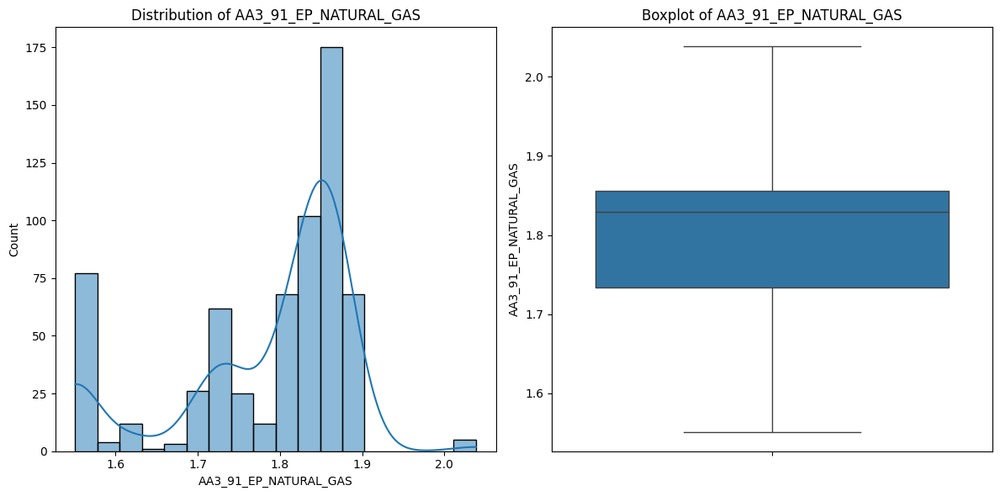


--- Summary Statistics for AA3_ANPR ---
count    640.000000
mean     290.249789
std       20.730021
min      238.475000
25%      282.320000
50%      287.885000
75%      311.550000
max      331.000000
Name: AA3_ANPR, dtype: float64


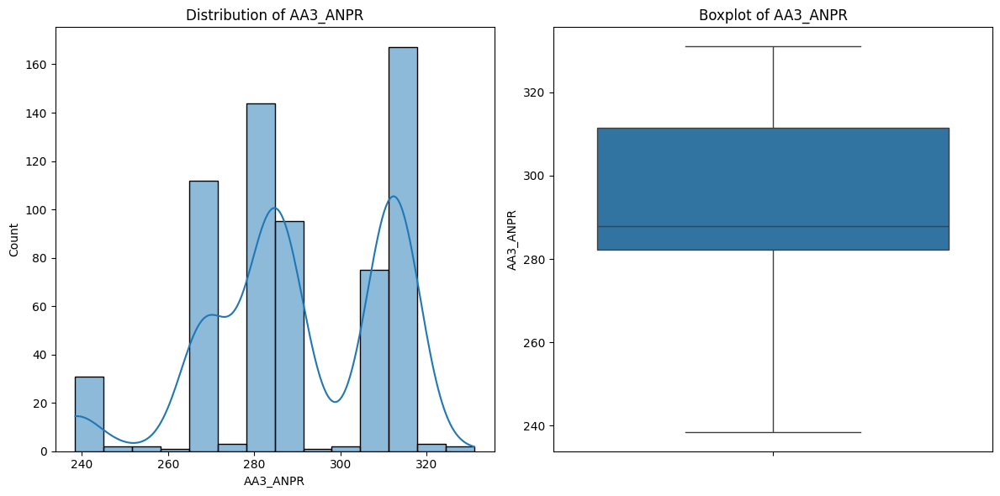


--- Summary Statistics for AA3_C_PR ---
count    640.000000
mean     129.015320
std        2.046691
min      124.677500
25%      127.805000
50%      129.040000
75%      129.890000
max      133.017500
Name: AA3_C_PR, dtype: float64


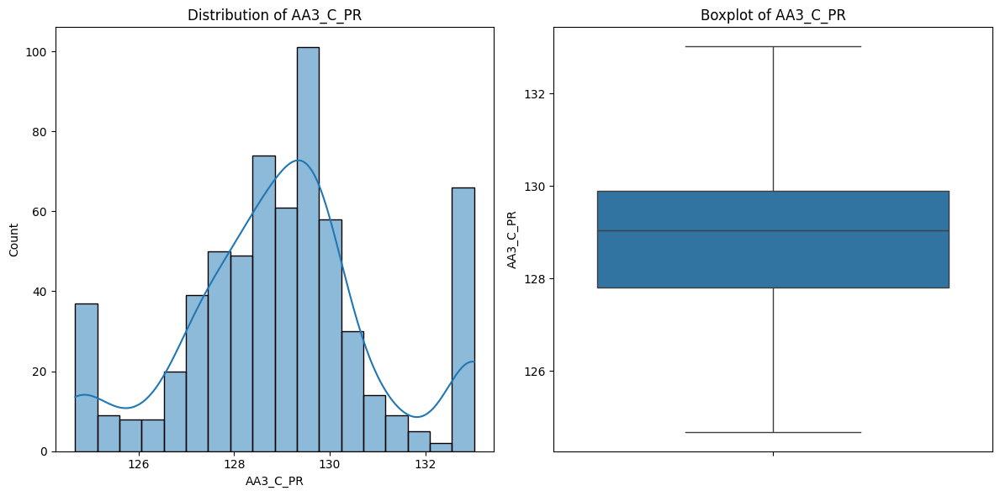


--- Summary Statistics for AA3_FBHP ---
count    640.000000
mean     302.958105
std        9.685219
min      276.342500
25%      296.532500
50%      302.890000
75%      309.992500
max      322.390000
Name: AA3_FBHP, dtype: float64


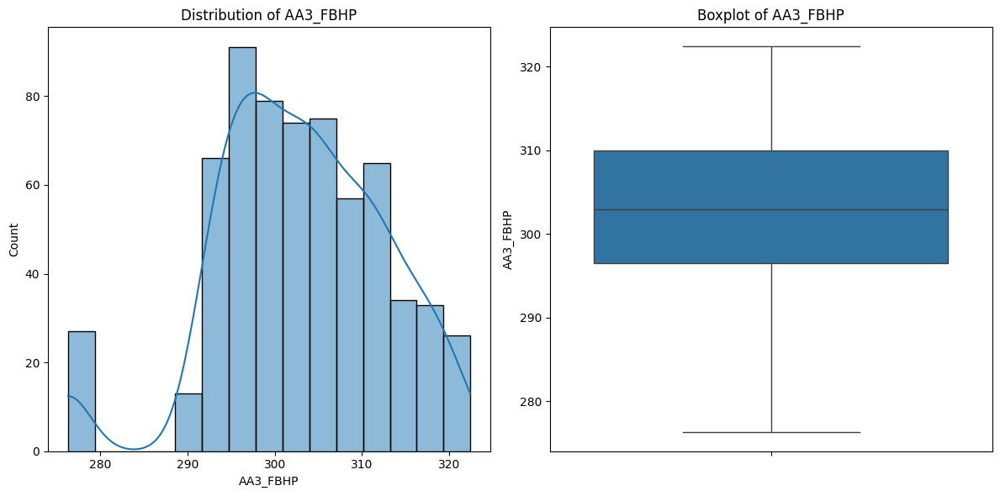


--- Summary Statistics for AA3_ANTP ---
count    640.000000
mean      14.808672
std        2.427436
min        9.312500
25%       13.700000
50%       15.400000
75%       16.625000
max       21.012500
Name: AA3_ANTP, dtype: float64


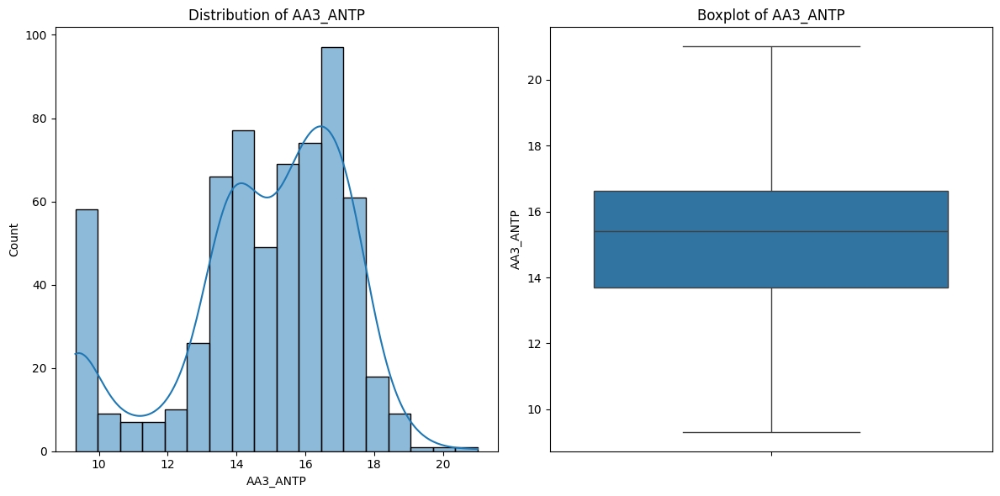


--- Summary Statistics for AA3_C_TE ---
count    640.000000
mean      59.424219
std        1.308510
min       56.550000
25%       58.800000
50%       59.900000
75%       60.300000
max       61.200000
Name: AA3_C_TE, dtype: float64


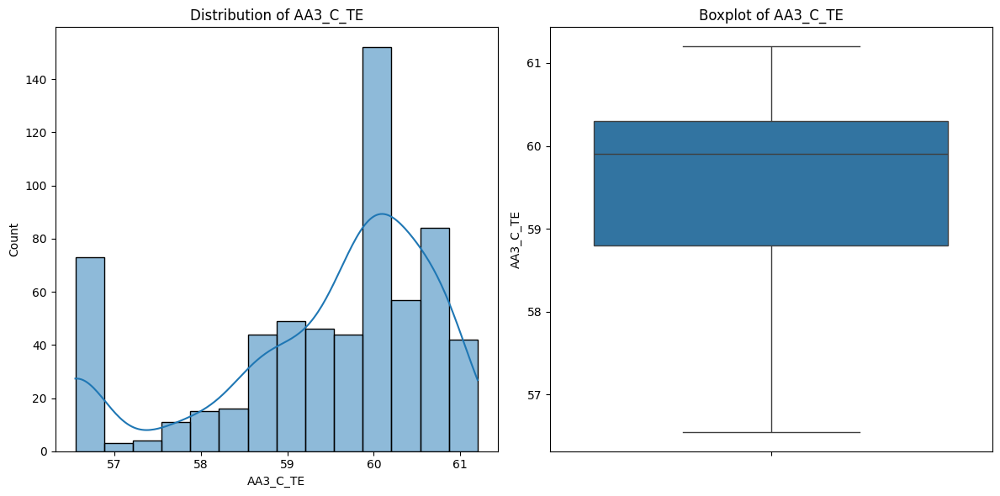


--- Summary Statistics for AA3_FBHT ---
count    640.000000
mean      92.745859
std        0.093878
min       92.550000
25%       92.700000
50%       92.700000
75%       92.800000
max       92.950000
Name: AA3_FBHT, dtype: float64


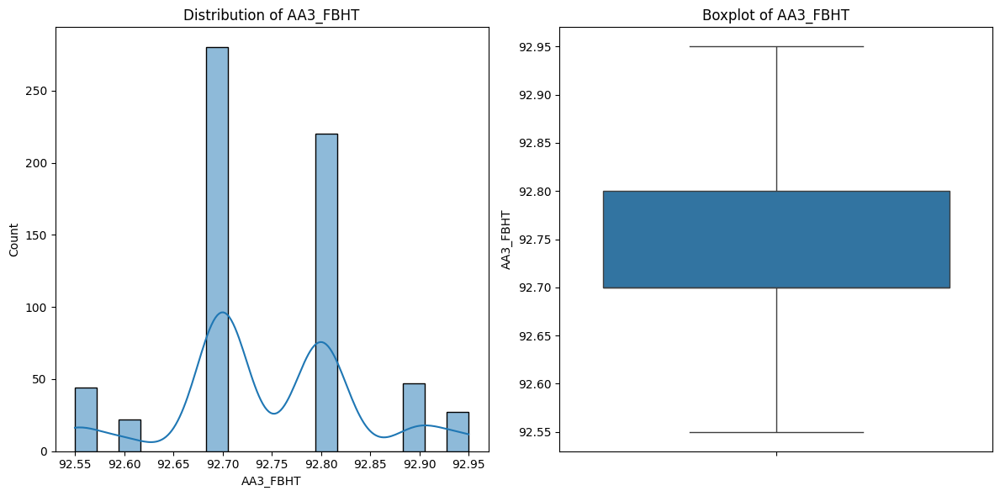


--- Summary Statistics for AA3_C_OP ---
count    640.000000
mean      38.688297
std        2.385722
min       33.180000
25%       37.500000
50%       39.420000
75%       40.380000
max       42.310000
Name: AA3_C_OP, dtype: float64


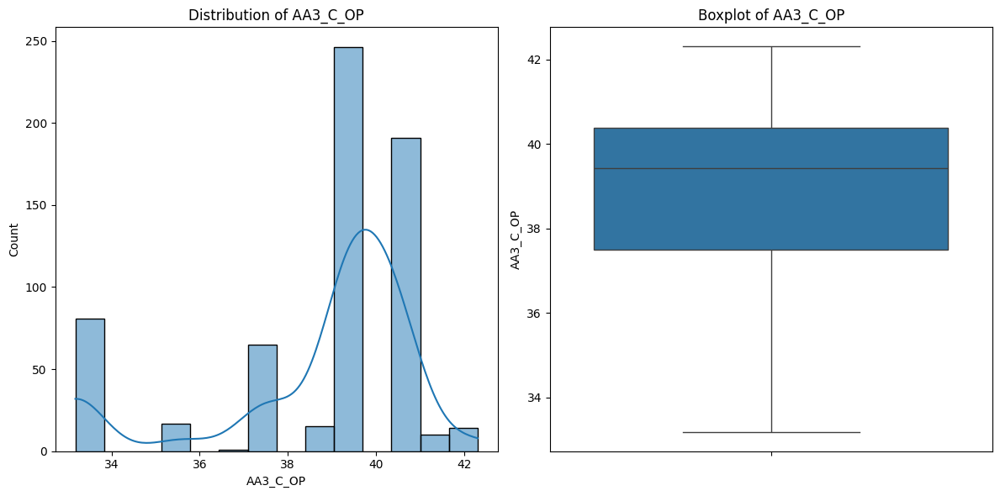


--- Summary Statistics for AA4 ---

--- Summary Statistics for AA4_91_9500062414 ---
count     640.000000
mean      579.550391
std       875.699018
min         0.850000
25%         2.070000
50%         2.140000
75%      1618.000000
max      2222.000000
Name: AA4_91_9500062414, dtype: float64


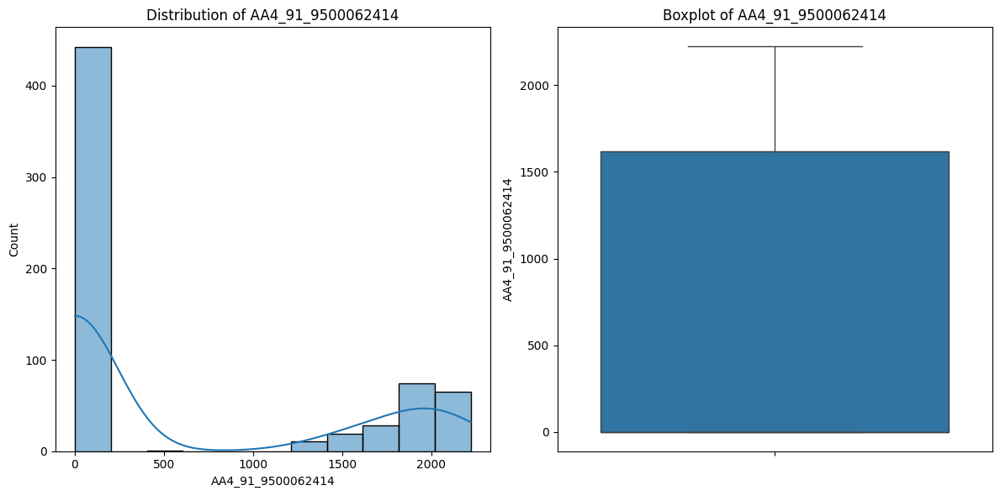


--- Summary Statistics for AA4_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.182659
std        0.089345
min        0.976083
25%        1.136005
50%        1.217240
75%        1.242620
max        1.402543
Name: AA4_91_EP_NATURAL_GAS, dtype: float64


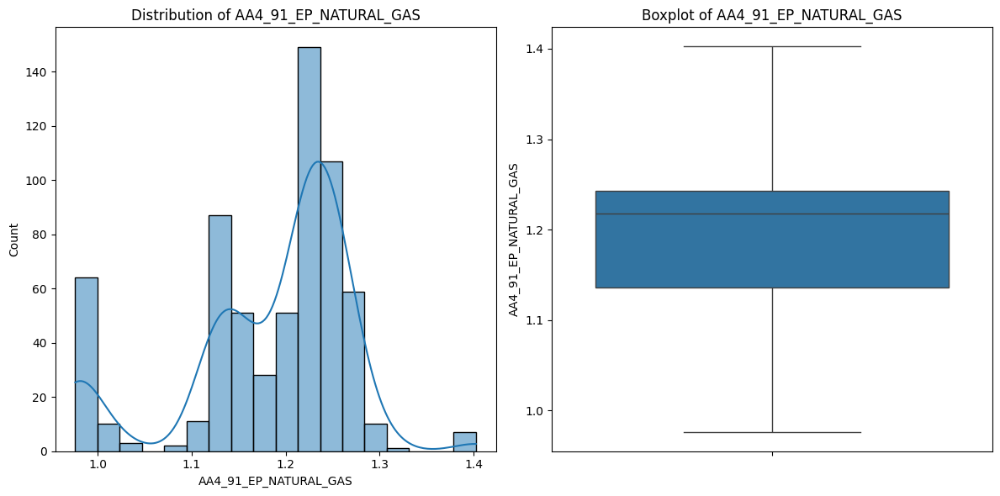


--- Summary Statistics for AA4_ANPR ---
count    640.000000
mean     208.174416
std       43.010227
min       81.268750
25%      179.177500
50%      221.230000
75%      244.450000
max      271.920000
Name: AA4_ANPR, dtype: float64


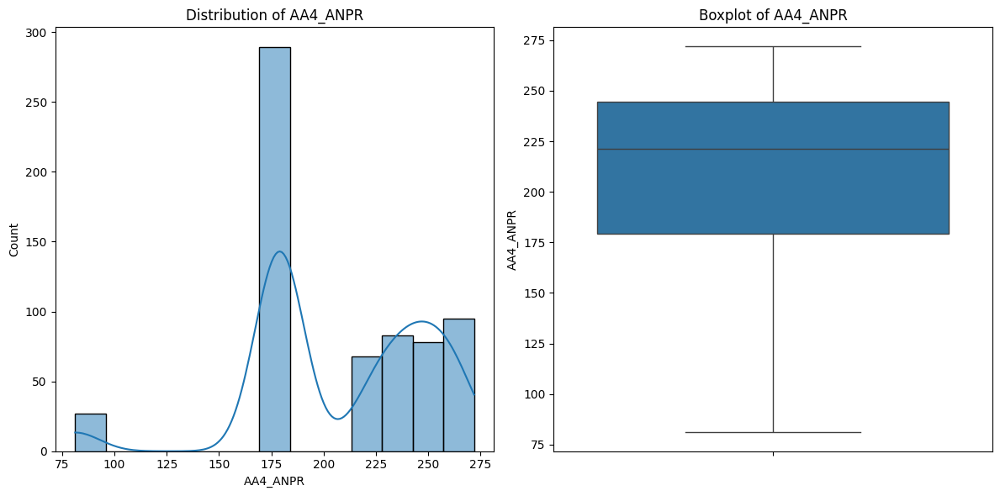


--- Summary Statistics for AA4_C_PR ---
count    640.00000
mean     140.88625
std        2.10611
min      136.64000
25%      139.76750
50%      140.95000
75%      141.85250
max      144.98000
Name: AA4_C_PR, dtype: float64


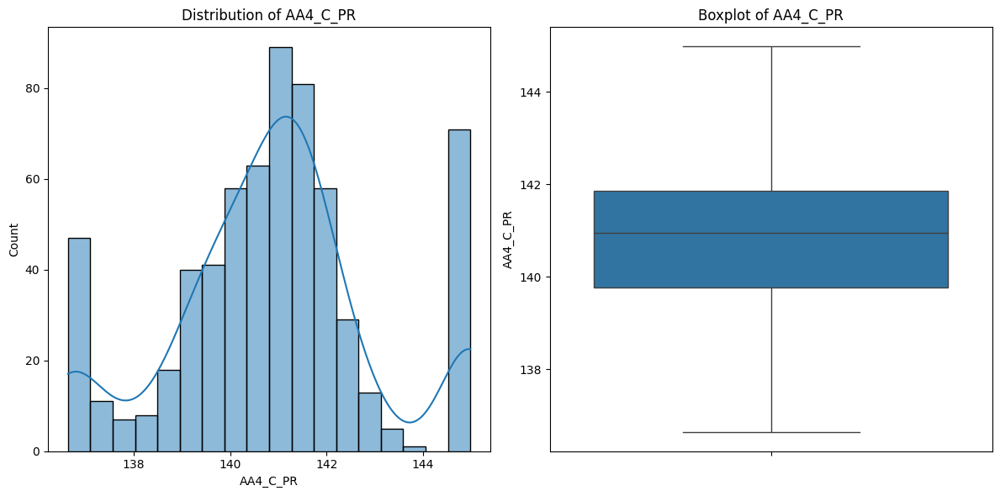


--- Summary Statistics for AA4_FBHP ---
count    640.000000
mean     234.443736
std       10.203883
min      205.823750
25%      227.427500
50%      236.150000
75%      241.830000
max      254.810000
Name: AA4_FBHP, dtype: float64


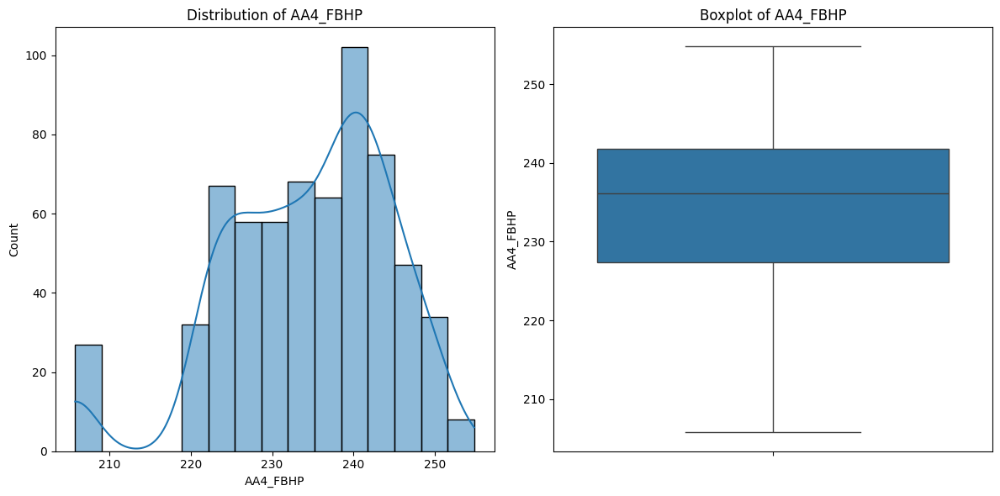


--- Summary Statistics for AA4_ANTP ---
count    640.000000
mean      11.237656
std        2.372100
min        7.100000
25%       10.700000
50%       11.400000
75%       13.100000
max       16.700000
Name: AA4_ANTP, dtype: float64


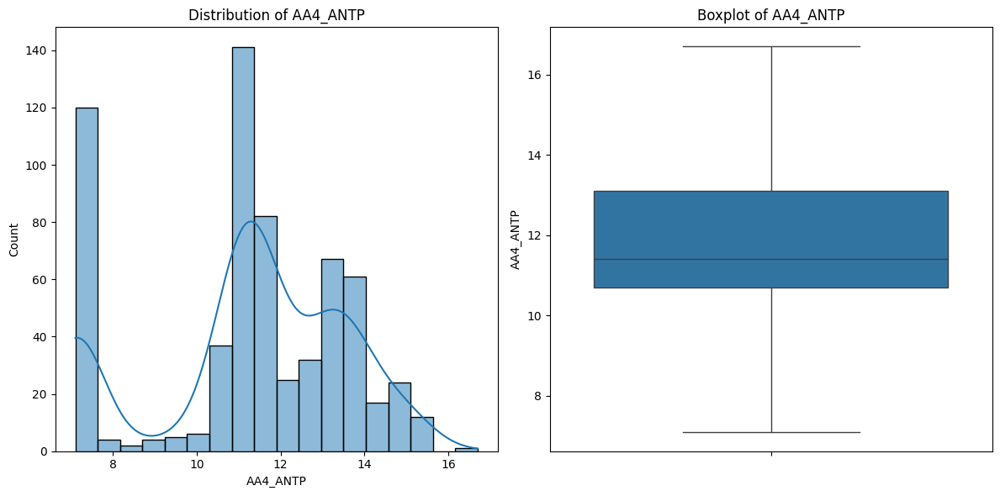


--- Summary Statistics for AA4_C_TE ---
count    640.000000
mean      28.208125
std        0.954946
min       25.900000
25%       27.700000
50%       28.400000
75%       28.900000
max       30.500000
Name: AA4_C_TE, dtype: float64


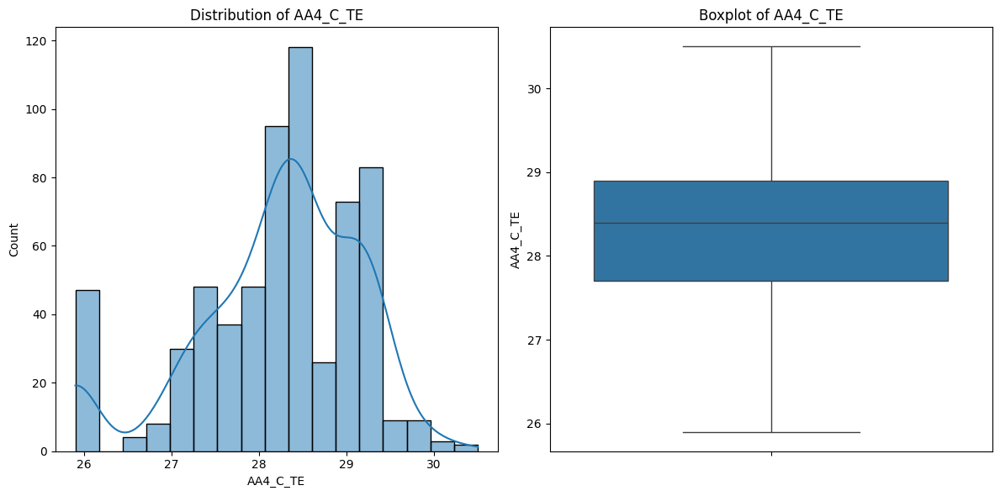


--- Summary Statistics for AA4_FBHT ---
count    640.000000
mean      48.109844
std        0.198598
min       47.550000
25%       48.000000
50%       48.100000
75%       48.300000
max       48.400000
Name: AA4_FBHT, dtype: float64


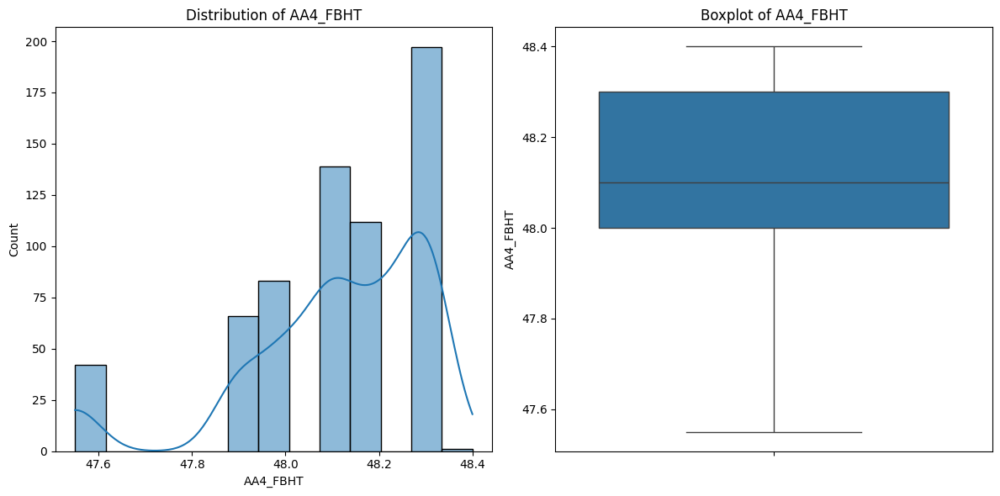


--- Summary Statistics for AA4_C_OP ---
count    6.400000e+02
mean     3.429000e+01
std      5.333239e-13
min      3.429000e+01
25%      3.429000e+01
50%      3.429000e+01
75%      3.429000e+01
max      3.429000e+01
Name: AA4_C_OP, dtype: float64


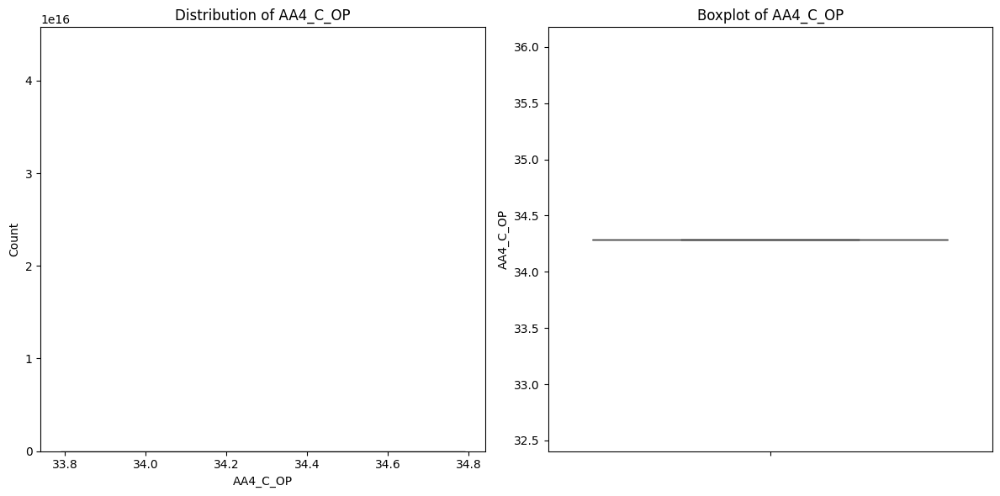


--- Summary Statistics for AA5 ---

--- Summary Statistics for AA5_91_9500062414 ---
count     640.000000
mean      645.415508
std       980.035242
min         0.130000
25%         2.140000
50%         2.190000
75%      1578.000000
max      3943.785000
Name: AA5_91_9500062414, dtype: float64


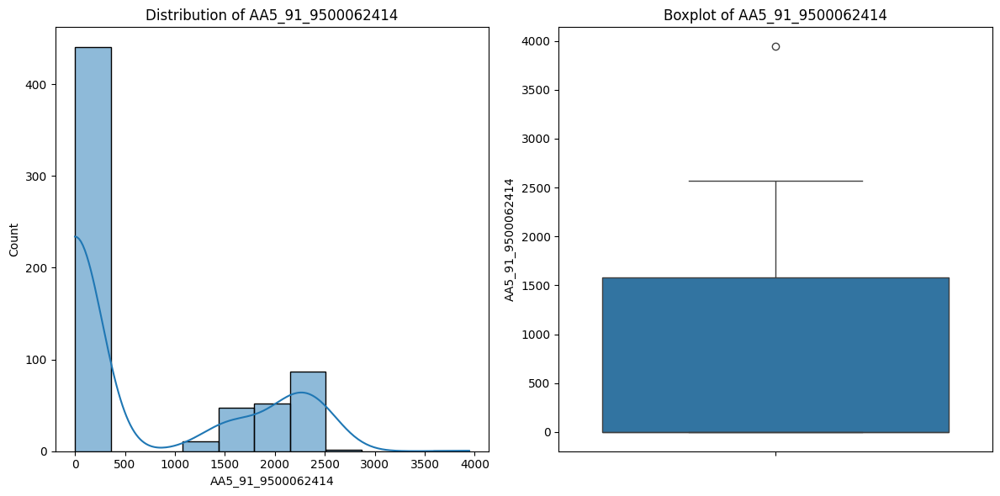


--- Summary Statistics for AA5_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.262312
std        0.157254
min        0.899936
25%        1.206420
50%        1.245645
75%        1.410743
max        1.717226
Name: AA5_91_EP_NATURAL_GAS, dtype: float64


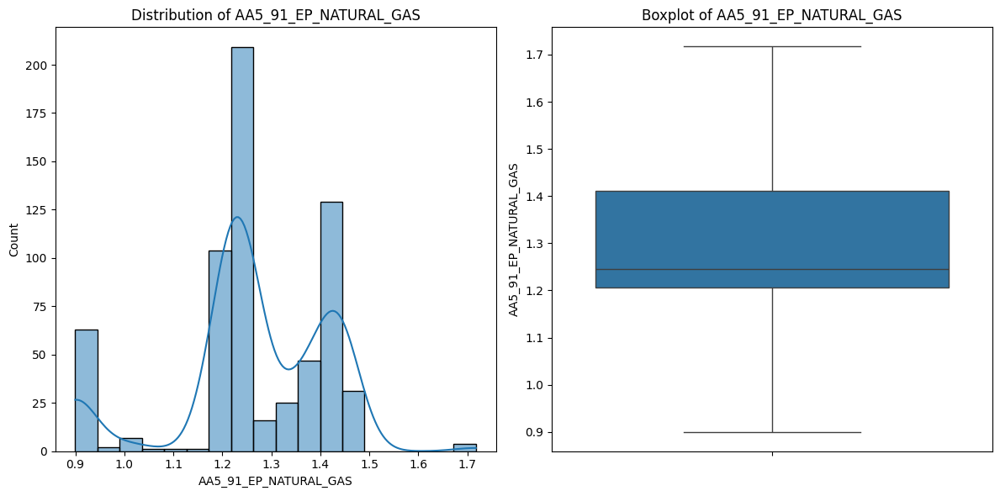


--- Summary Statistics for AA5_ANPR ---
count    640.000000
mean     235.319969
std        7.054710
min      217.820000
25%      231.057500
50%      235.440000
75%      239.882500
max      253.120000
Name: AA5_ANPR, dtype: float64


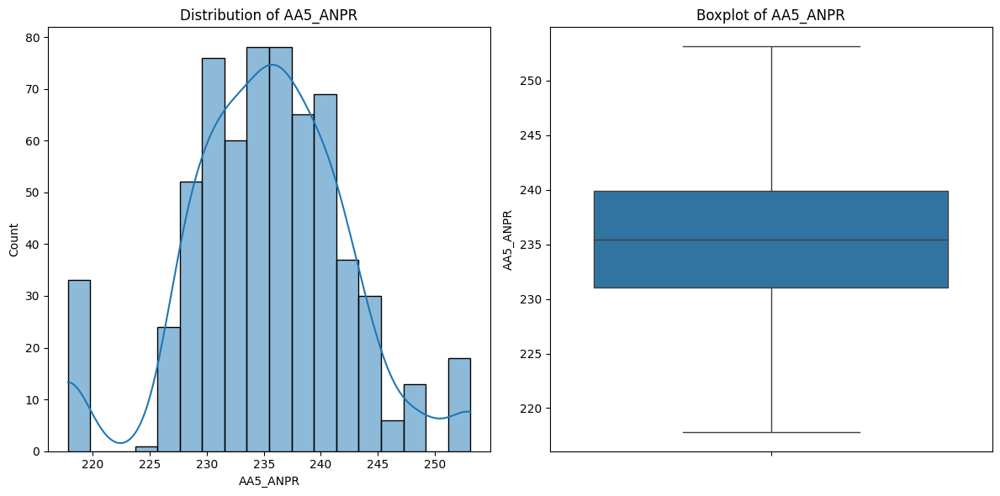


--- Summary Statistics for AA5_C_PR ---
count    640.000000
mean     147.852957
std        2.922030
min      141.567500
25%      146.240000
50%      147.490000
75%      149.355000
max      154.027500
Name: AA5_C_PR, dtype: float64


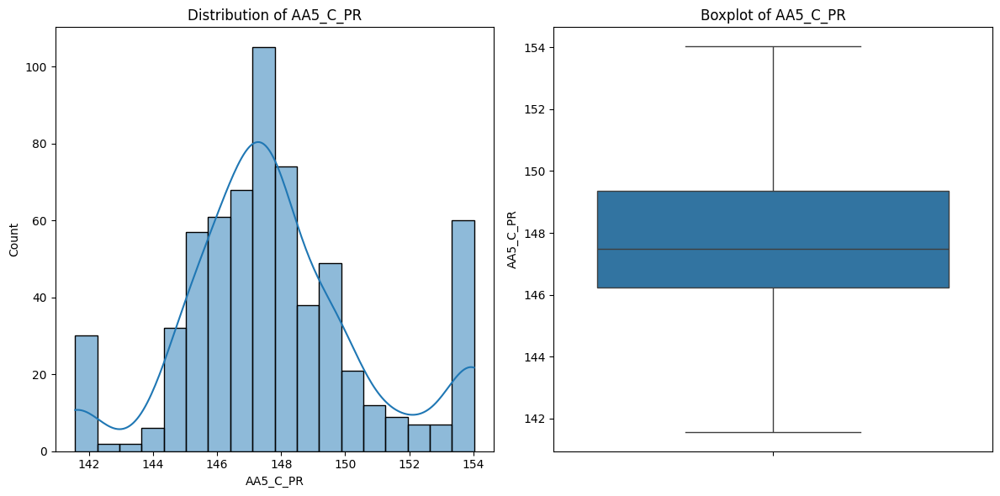


--- Summary Statistics for AA5_FBHP ---
count    640.000000
mean     243.030543
std        6.717607
min      224.253750
25%      238.372500
50%      243.245000
75%      247.785000
max      255.620000
Name: AA5_FBHP, dtype: float64


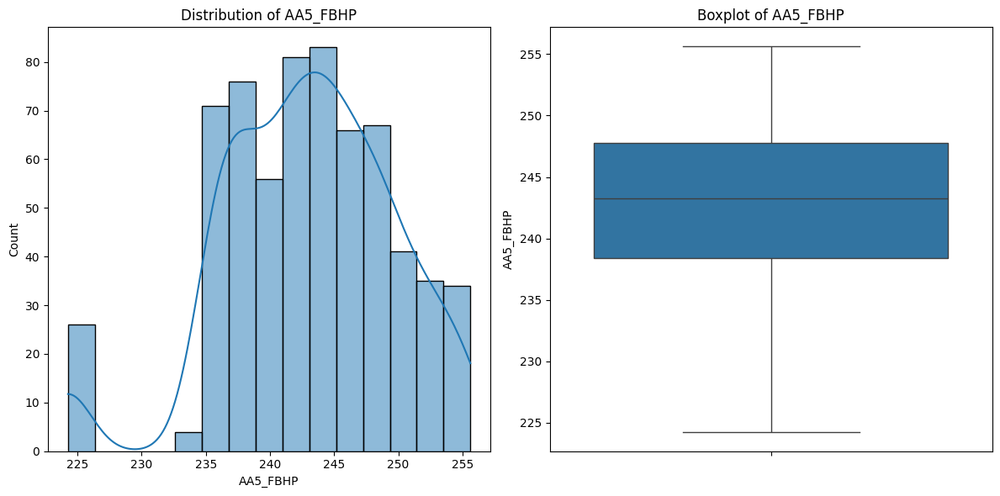


--- Summary Statistics for AA5_ANTP ---
count    640.000000
mean       5.825000
std        0.445434
min        4.850000
25%        5.600000
50%        5.900000
75%        6.100000
max        6.850000
Name: AA5_ANTP, dtype: float64


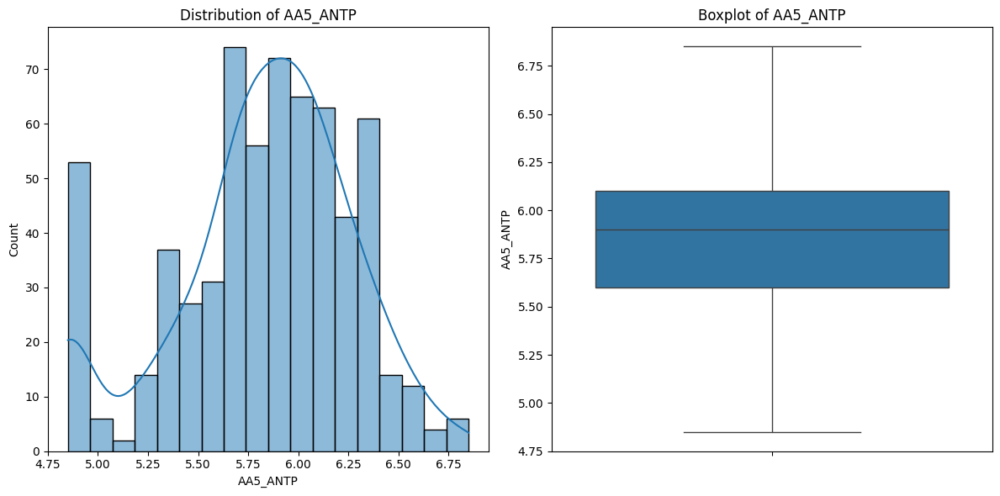


--- Summary Statistics for AA5_C_TE ---
count    640.000000
mean      11.379844
std        1.023794
min        9.100000
25%       10.900000
50%       11.200000
75%       12.100000
max       13.900000
Name: AA5_C_TE, dtype: float64


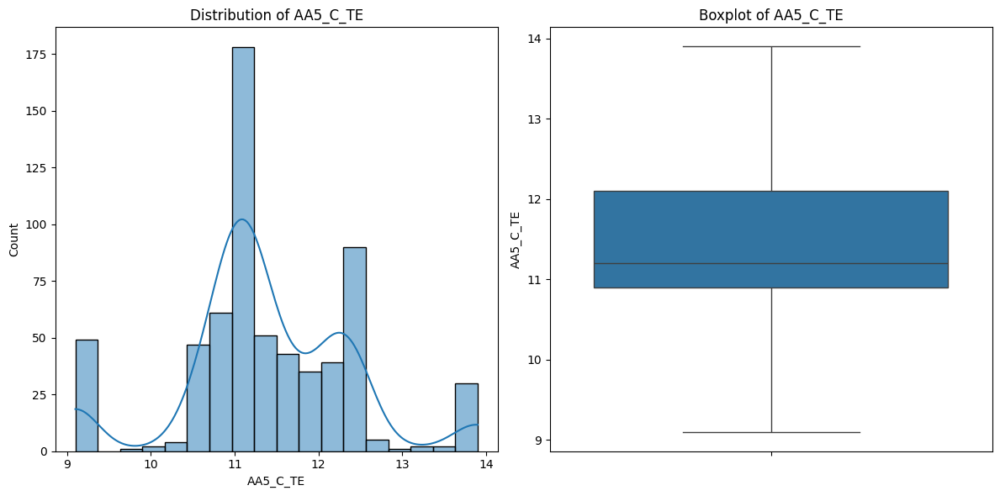


--- Summary Statistics for AA5_FBHT ---
count    640.000000
mean      29.055391
std        0.092555
min       28.850000
25%       29.000000
50%       29.100000
75%       29.100000
max       29.200000
Name: AA5_FBHT, dtype: float64


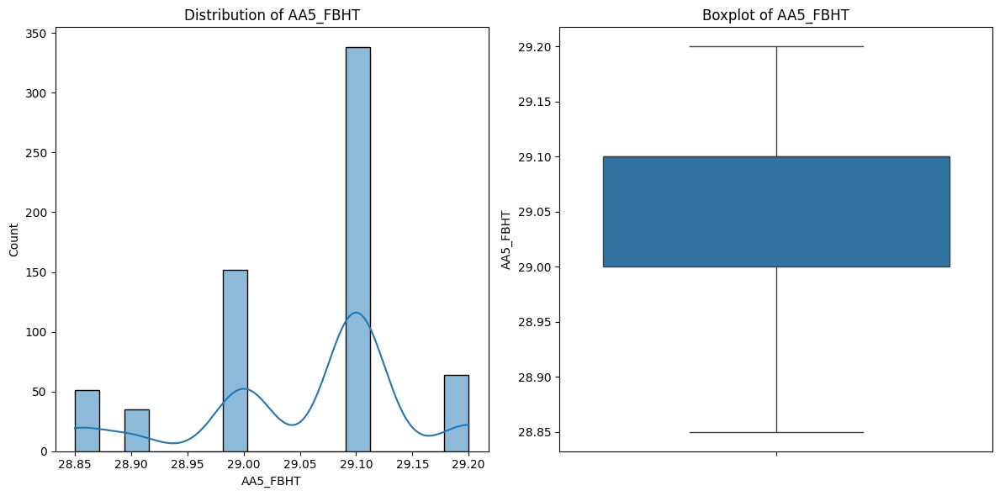


--- Summary Statistics for AA5_C_OP ---
count    640.000000
mean      30.275875
std        3.491061
min       21.650000
25%       28.850000
50%       29.810000
75%       33.650000
max       34.620000
Name: AA5_C_OP, dtype: float64


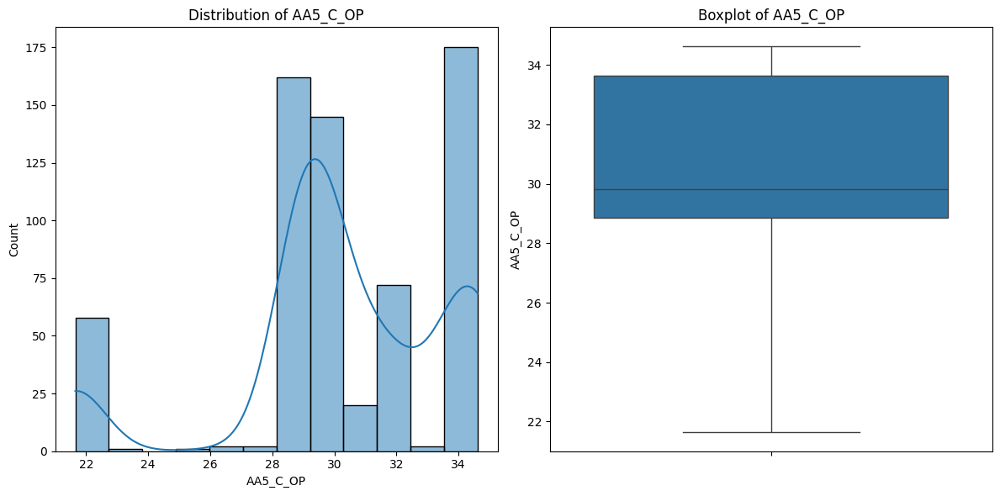

In [12]:
# Key variables for each well
key_variables = ['91_9500062414', '91_EP_NATURAL_GAS', 'ANPR', 'C_PR', 'FBHP', 'ANTP', 'C_TE', 'FBHT', 'C_OP']

# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\n--- Summary Statistics for {well} ---")
    for var in key_variables:
        column_name = f'{well}_{var}'
        print(f"\n--- Summary Statistics for {column_name} ---")
        print(df[column_name].describe())
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sns.histplot(df[column_name], kde=True)
        plt.title(f'Distribution of {column_name}')
        plt.subplot(1, 2, 2)
        sns.boxplot(y=df[column_name])
        plt.title(f'Boxplot of {column_name}')
        plt.tight_layout()
        plt.show()

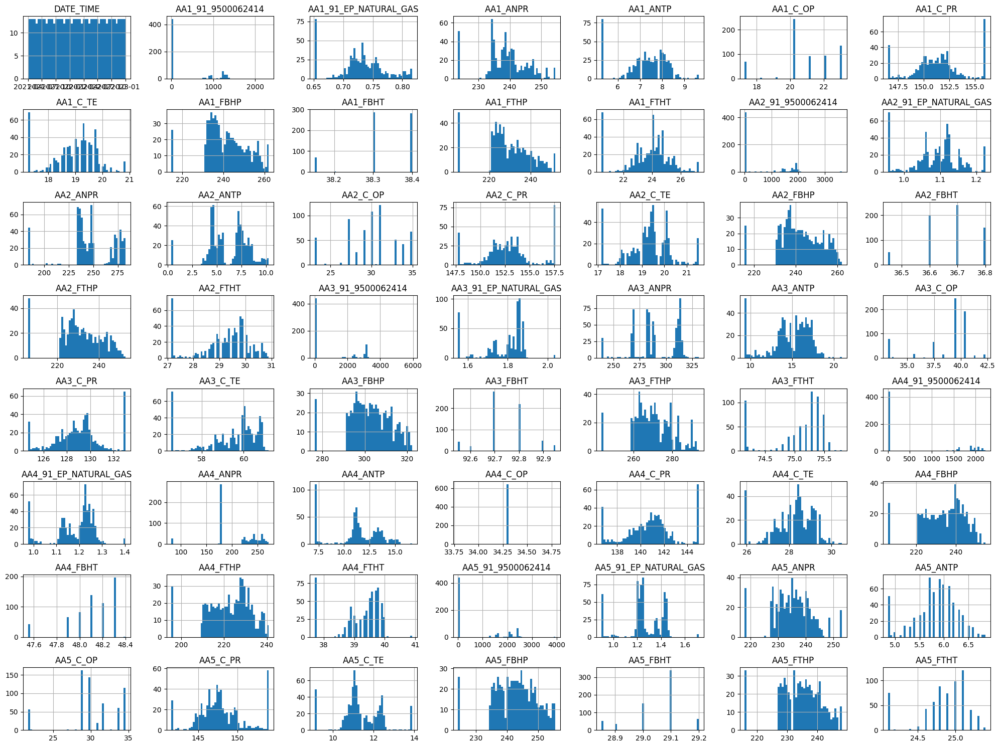

In [13]:
# prompt: buatkan aku grafik histogram untuk semua kolom

df.hist(bins=50, figsize=(20, 15))
plt.tight_layout()
plt.show()


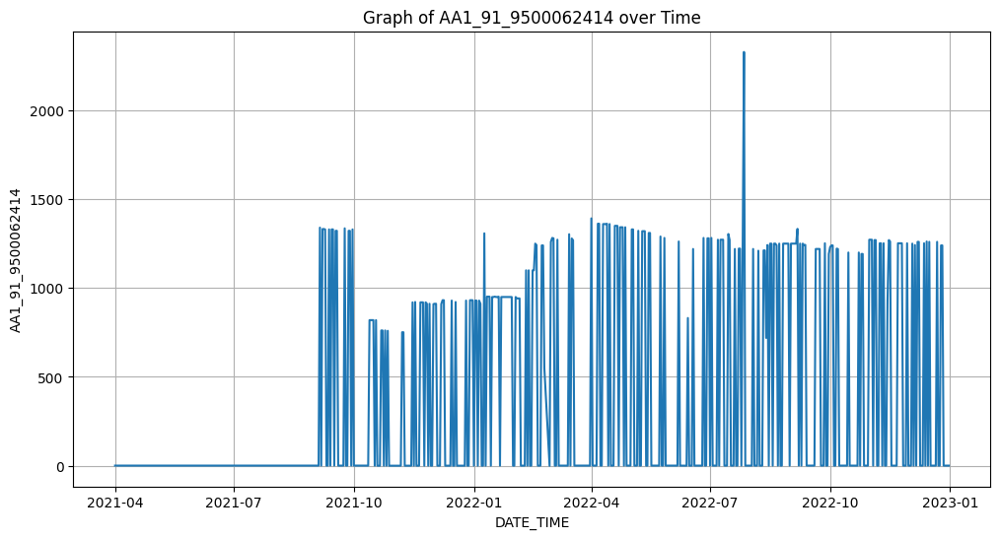

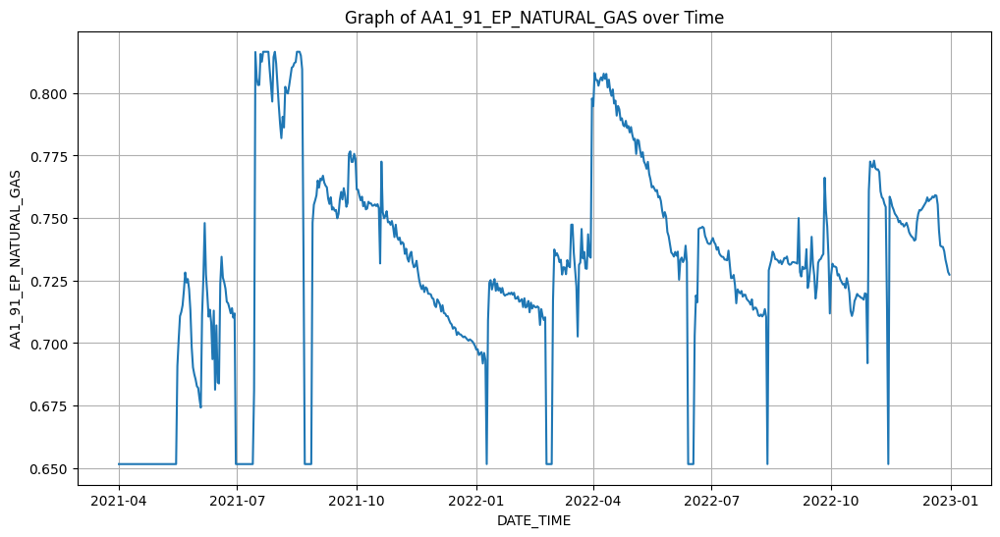

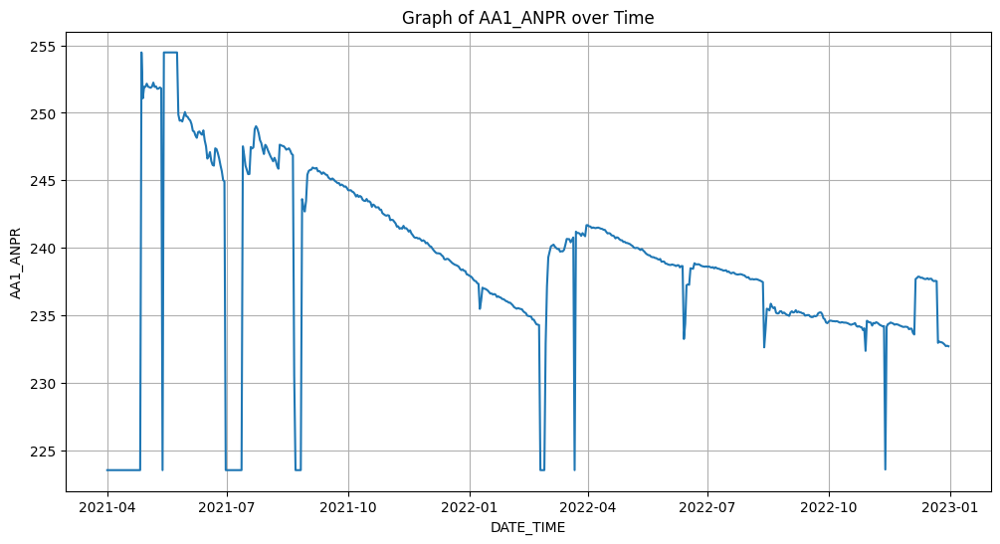

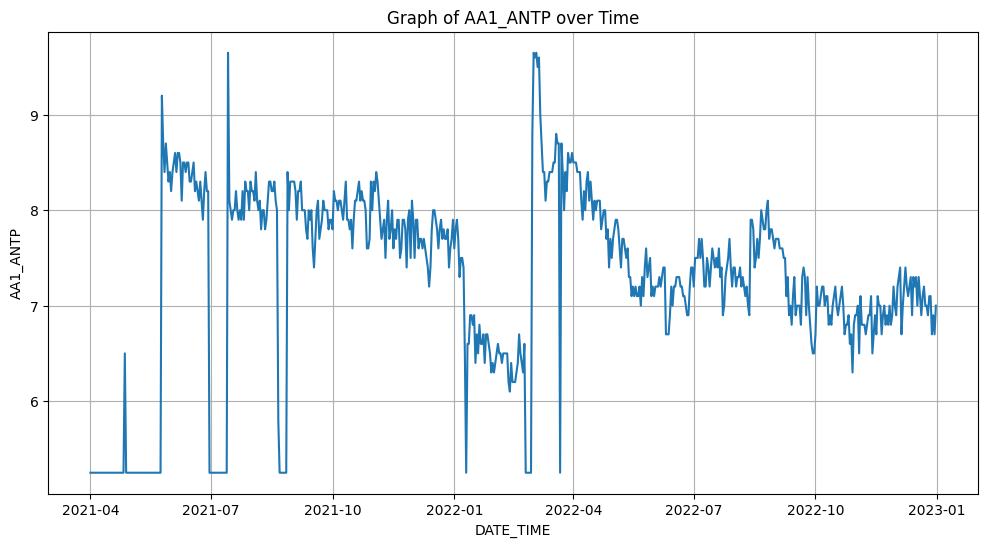

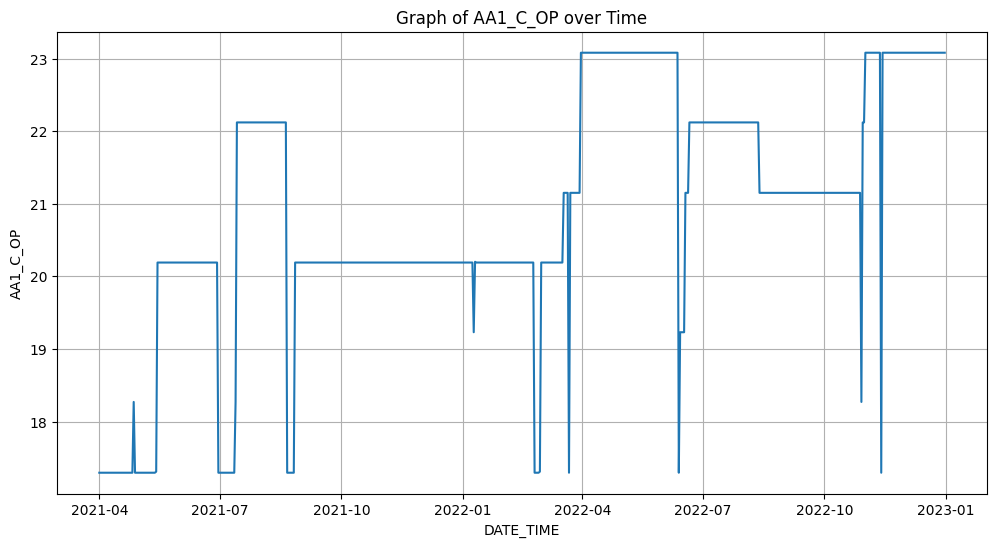

...

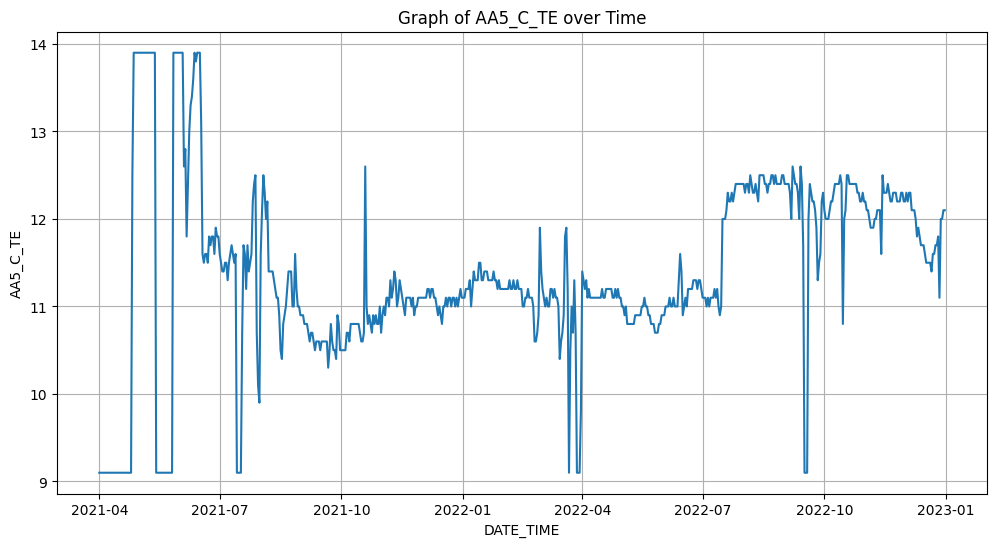

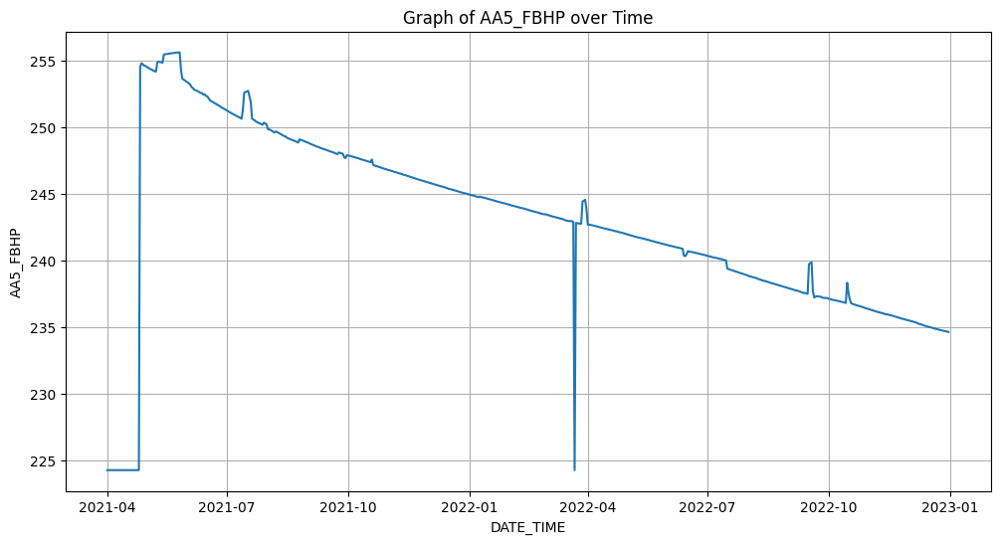

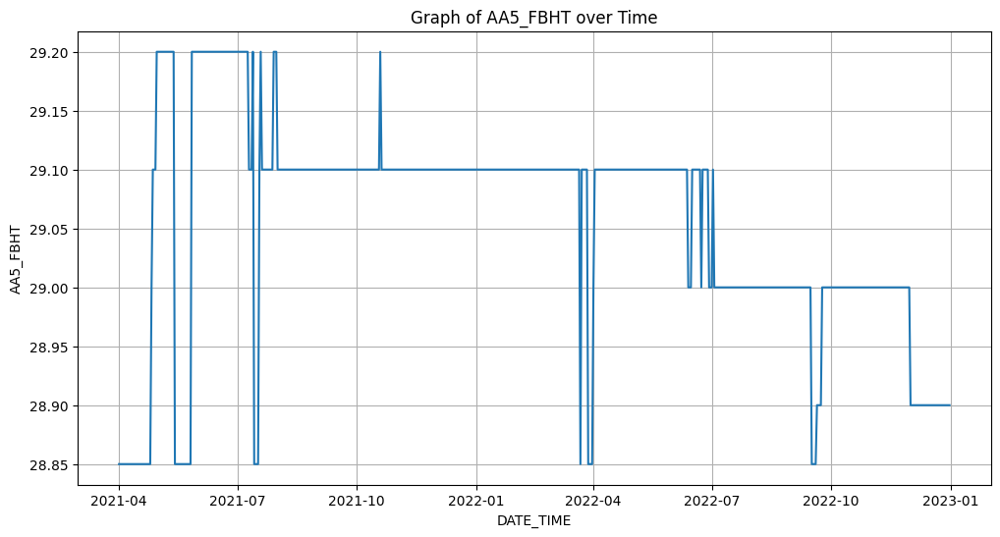

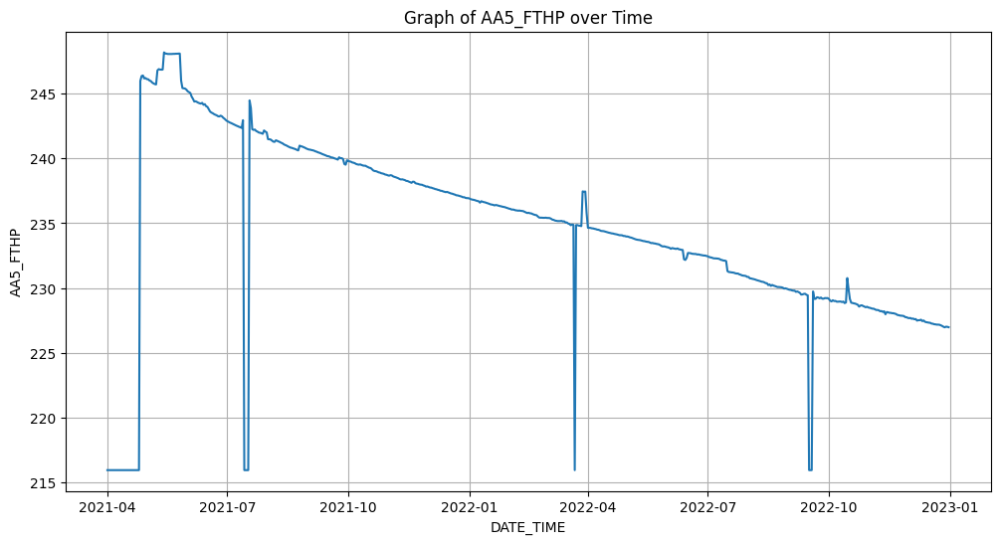

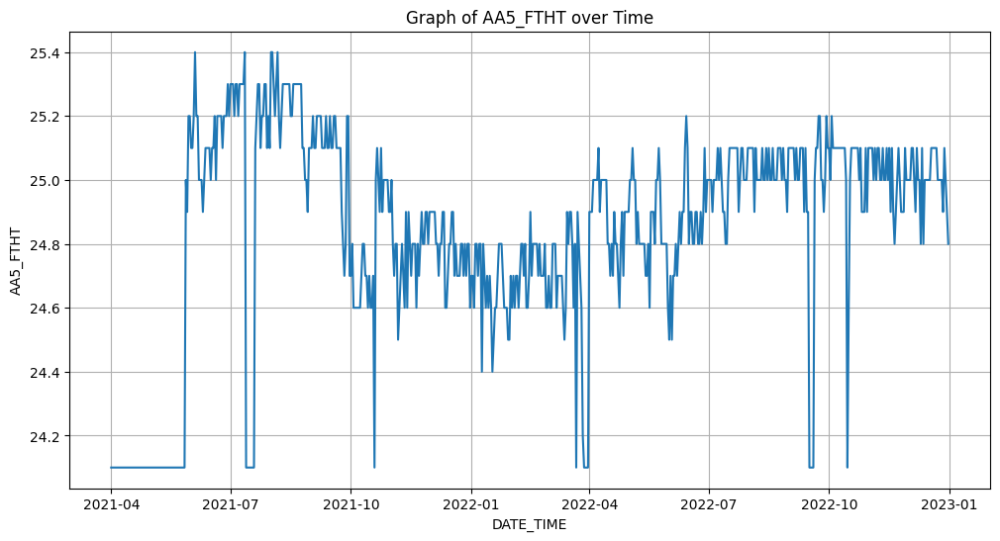

In [14]:
# prompt: buat grafik berdasarkan waktunya ("DATE_TIME") untuk semua kolom

# Buat grafik berdasarkan waktu untuk semua kolom numerik
numerical_cols = df.select_dtypes(include=np.number).columns

for col in numerical_cols:
    plt.figure(figsize=(12, 6))
    plt.plot(df['DATE_TIME'], df[col])
    plt.title(f'Graph of {col} over Time')
    plt.xlabel('DATE_TIME')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()


In [ ]:
df.shape

(171, 56)


--- Summary Statistics for AA1 ---

--- Summary Statistics for AA1_91_9500062414 ---
count     640.000000
mean      360.654537
std       546.589256
min         0.200000
25%         1.260000
50%         1.340000
75%       931.000000
max      2326.363750
Name: AA1_91_9500062414, dtype: float64


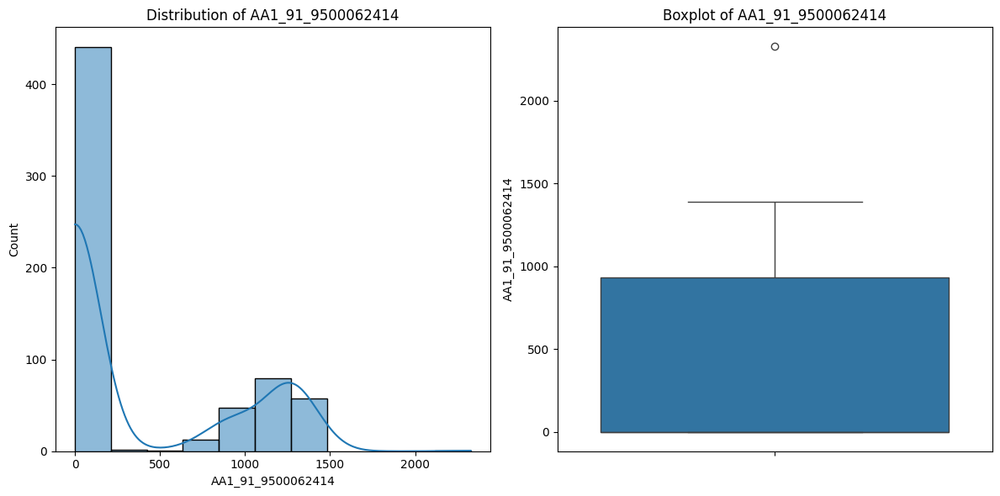


--- Summary Statistics for AA1_91_EP_NATURAL_GAS ---
count    640.000000
mean       0.730386
std        0.040914
min        0.651623
25%        0.713450
50%        0.731820
75%        0.754668
max        0.816495
Name: AA1_91_EP_NATURAL_GAS, dtype: float64


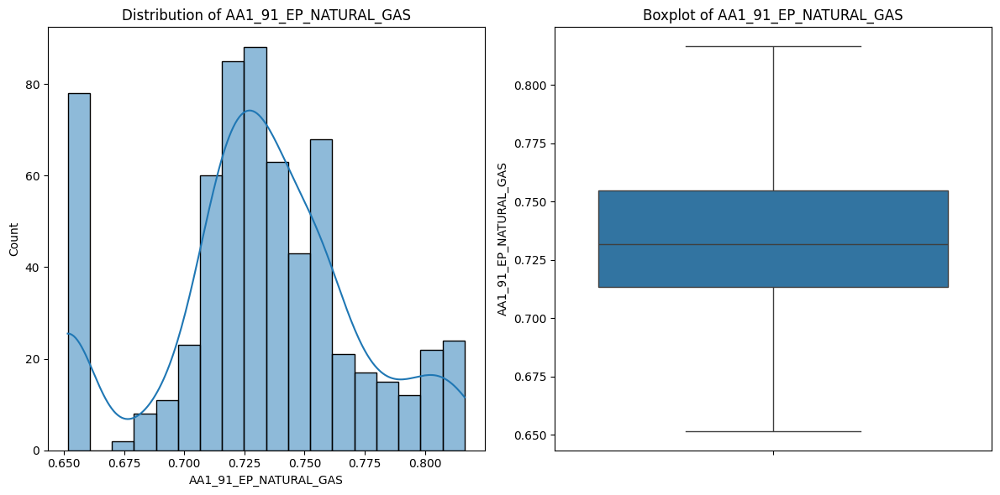


--- Summary Statistics for AA1_ANPR ---
count    640.000000
mean     238.931484
std        6.709745
min      223.535000
25%      235.137500
50%      238.715000
75%      242.872500
max      254.475000
Name: AA1_ANPR, dtype: float64


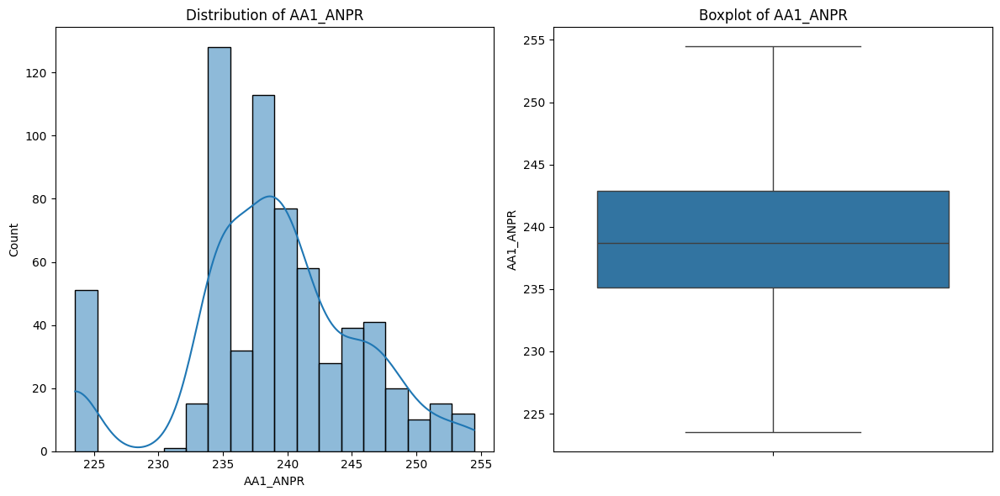


--- Summary Statistics for AA1_C_PR ---
count    640.000000
mean     151.443564
std        2.451128
min      146.498750
25%      150.080000
50%      151.370000
75%      152.467500
max      156.048750
Name: AA1_C_PR, dtype: float64


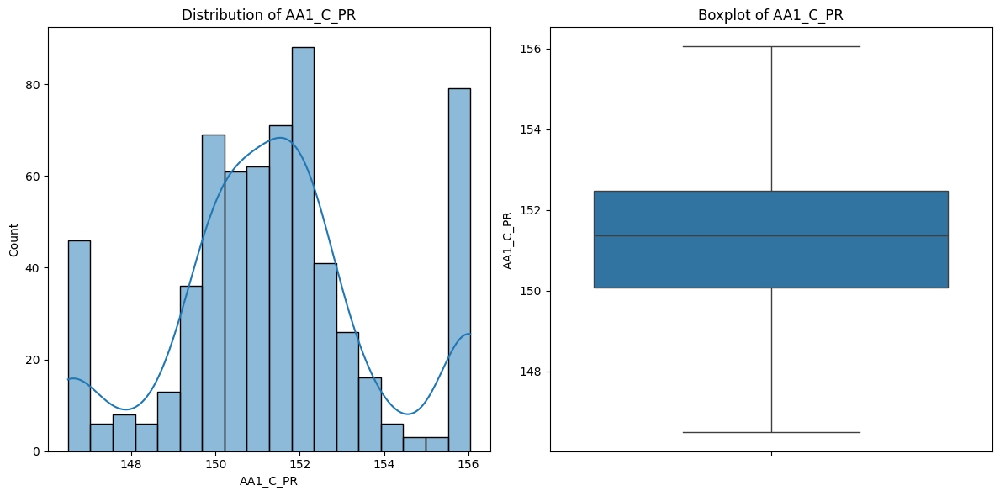


--- Summary Statistics for AA1_FBHP ---
count    640.000000
mean     241.828496
std        9.969557
min      214.788750
25%      235.132500
50%      241.115000
75%      248.695000
max      262.130000
Name: AA1_FBHP, dtype: float64


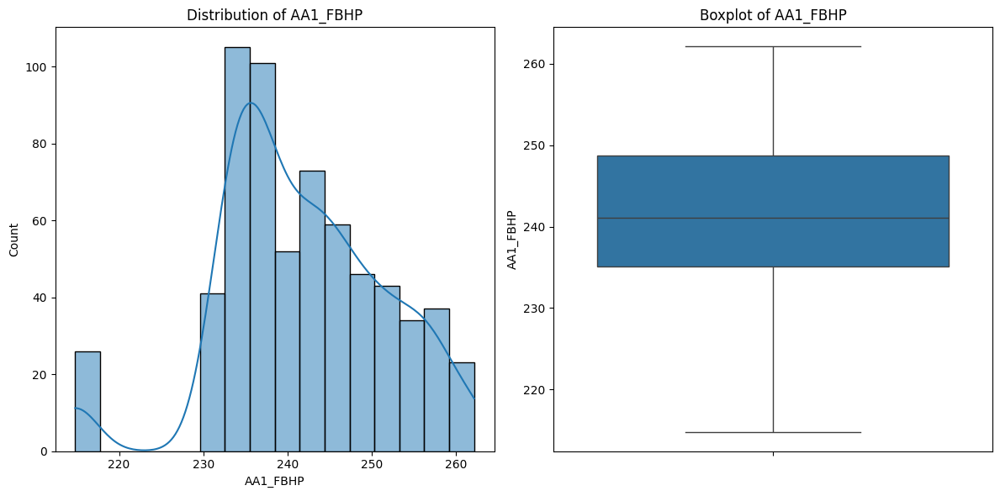


--- Summary Statistics for AA1_ANTP ---
count    640.000000
mean       7.276484
std        0.976295
min        5.250000
25%        6.900000
50%        7.400000
75%        8.000000
max        9.650000
Name: AA1_ANTP, dtype: float64


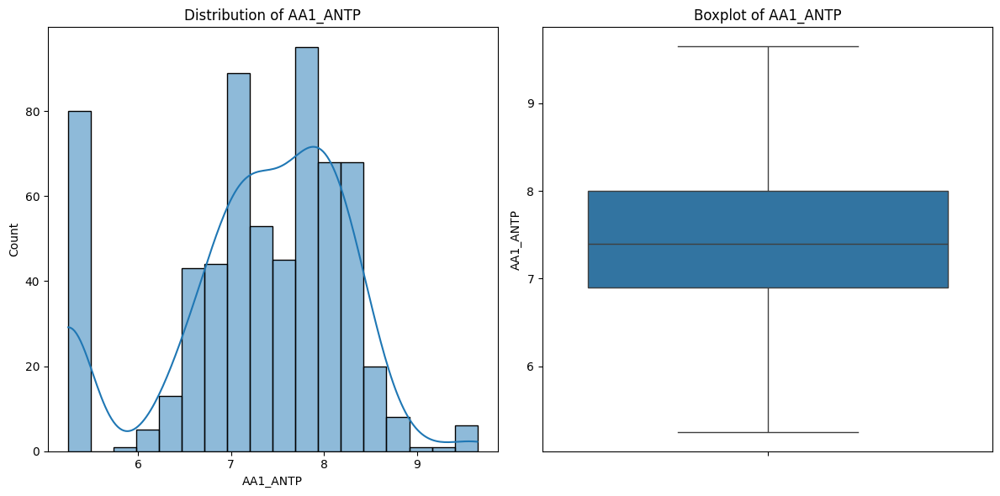


--- Summary Statistics for AA1_C_TE ---
count    640.000000
mean      18.967969
std        0.820772
min       17.250000
25%       18.600000
50%       19.100000
75%       19.500000
max       20.850000
Name: AA1_C_TE, dtype: float64


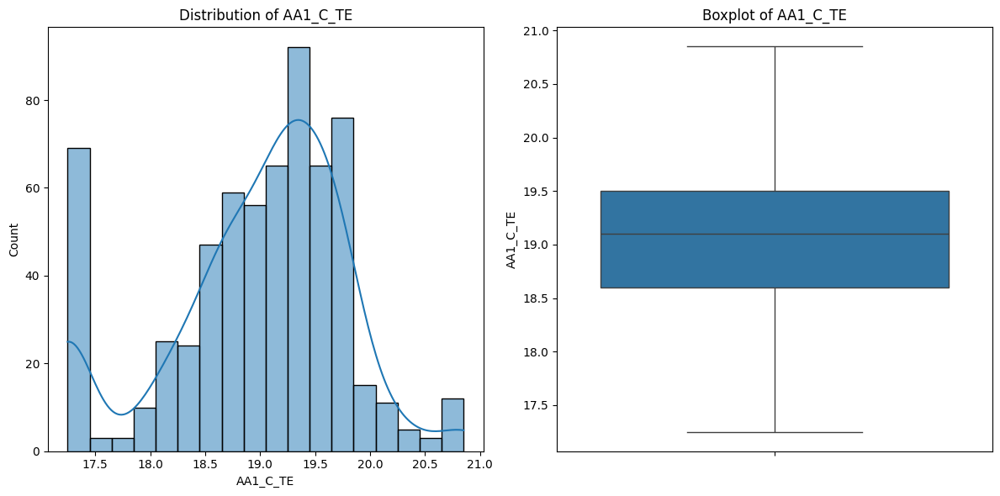


--- Summary Statistics for AA1_FBHT ---
count    640.000000
mean      38.327578
std        0.078181
min       38.150000
25%       38.300000
50%       38.300000
75%       38.400000
max       38.400000
Name: AA1_FBHT, dtype: float64


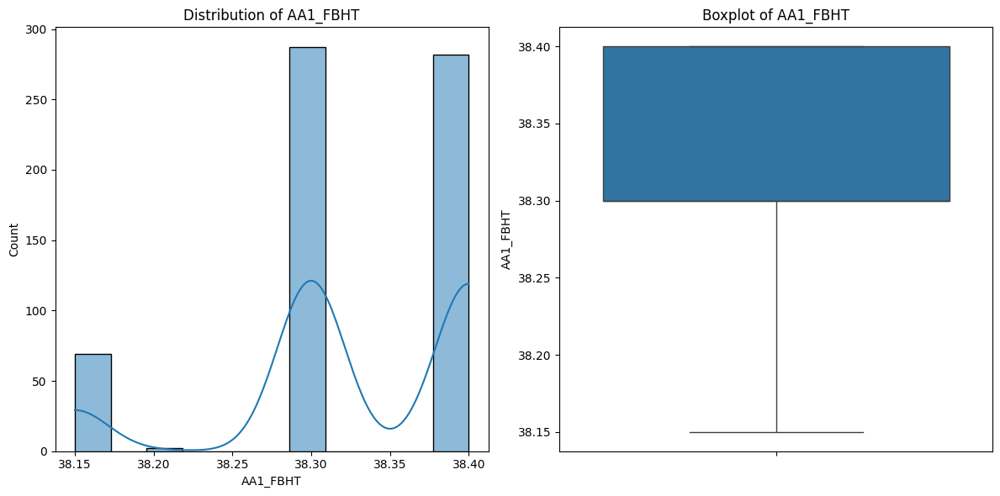


--- Summary Statistics for AA1_C_OP ---
count    640.000000
mean      20.880469
std        1.700332
min       17.295000
25%       20.190000
50%       20.195000
75%       22.120000
max       23.080000
Name: AA1_C_OP, dtype: float64


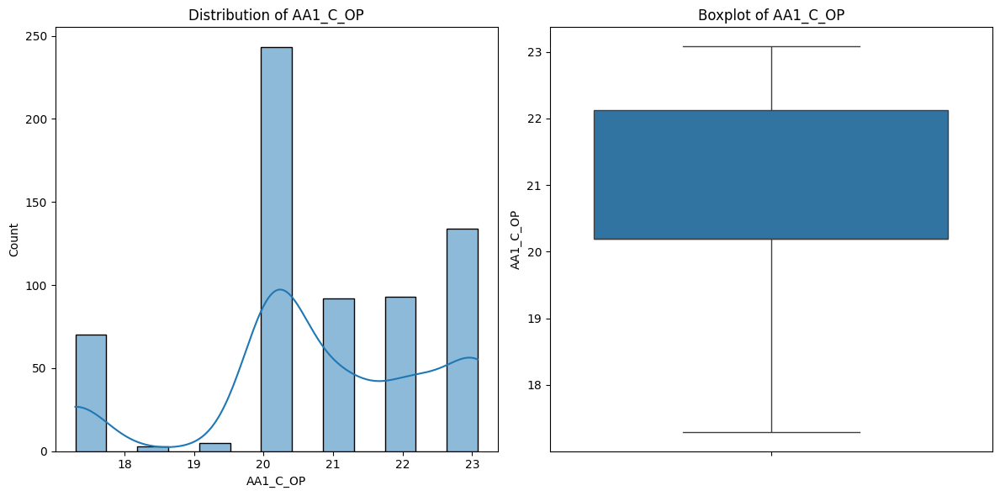


--- Summary Statistics for AA2 ---

--- Summary Statistics for AA2_91_9500062414 ---
count     640.000000
mean      539.934408
std       820.040730
min         0.050000
25%         1.850000
50%         1.910000
75%      1457.000000
max      3642.016250
Name: AA2_91_9500062414, dtype: float64


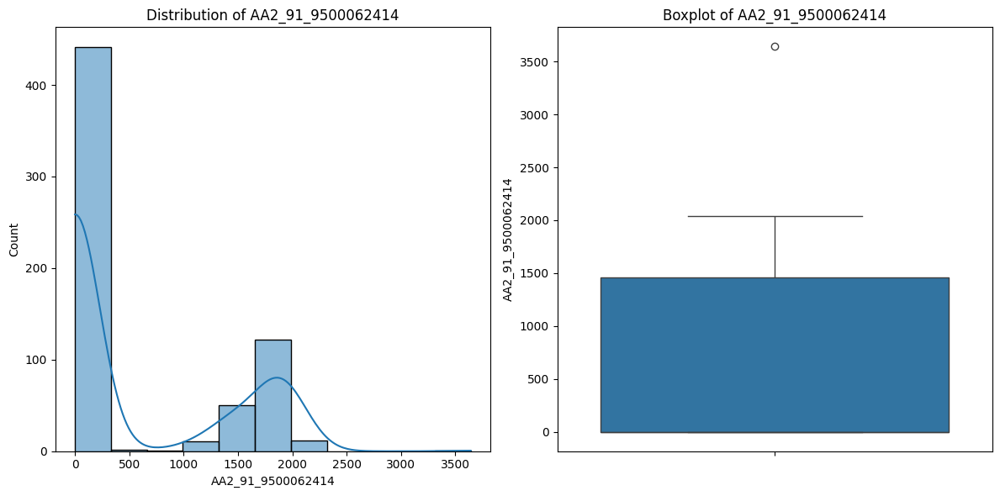


--- Summary Statistics for AA2_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.088873
std        0.067482
min        0.955183
25%        1.056553
50%        1.096910
75%        1.124132
max        1.225502
Name: AA2_91_EP_NATURAL_GAS, dtype: float64


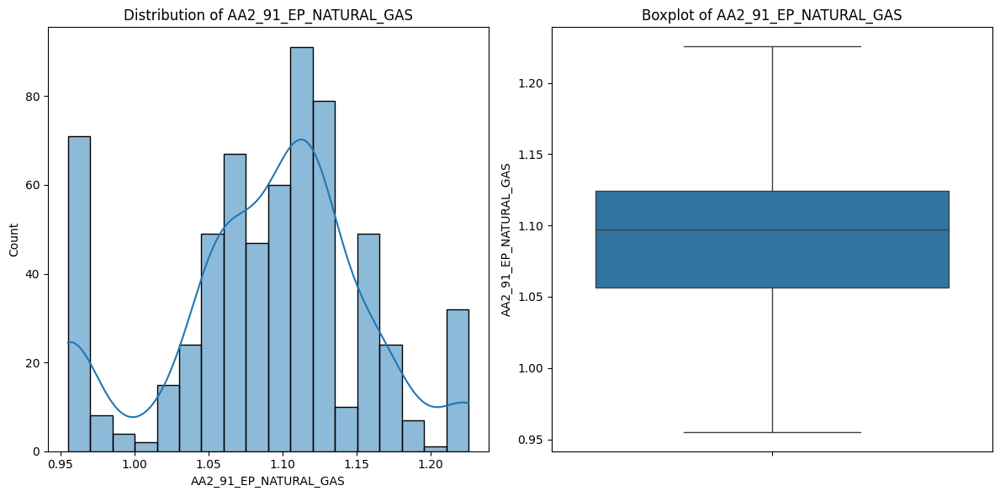


--- Summary Statistics for AA2_ANPR ---
count    640.000000
mean     247.699172
std       24.514850
min      183.552500
25%      236.352500
50%      246.225000
75%      271.552500
max      282.870000
Name: AA2_ANPR, dtype: float64


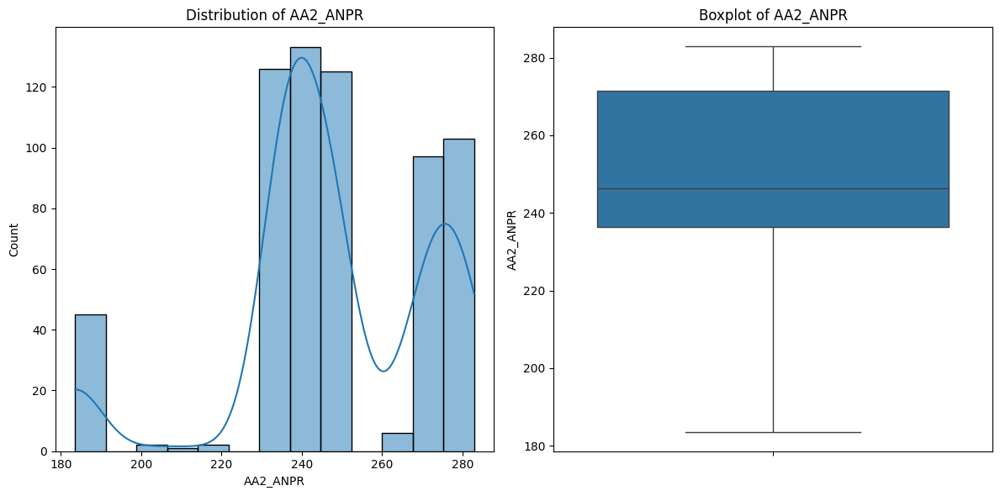


--- Summary Statistics for AA2_C_PR ---
count    640.000000
mean     152.898434
std        2.574581
min      147.741250
25%      151.450000
50%      152.755000
75%      153.922500
max      157.631250
Name: AA2_C_PR, dtype: float64


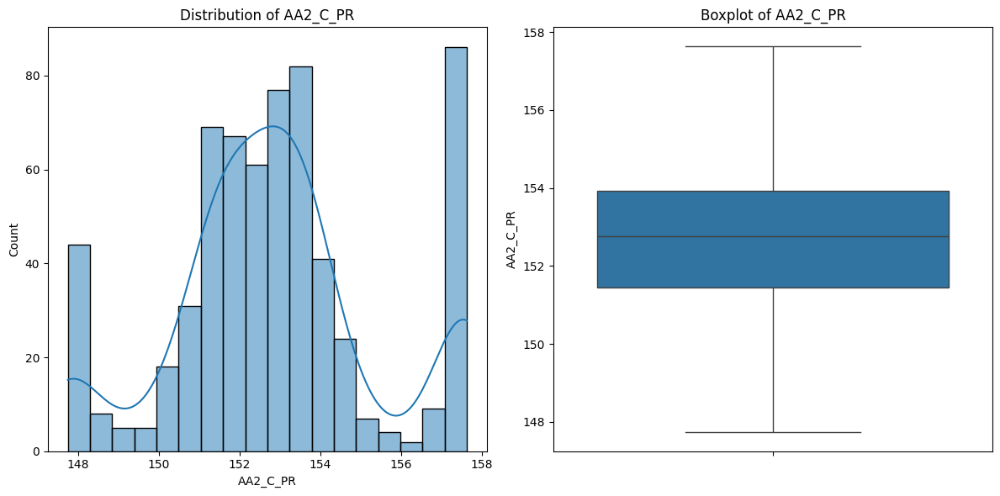


--- Summary Statistics for AA2_FBHP ---
count    640.000000
mean     242.548098
std        9.816918
min      215.572500
25%      236.242500
50%      241.765000
75%      250.022500
max      262.260000
Name: AA2_FBHP, dtype: float64


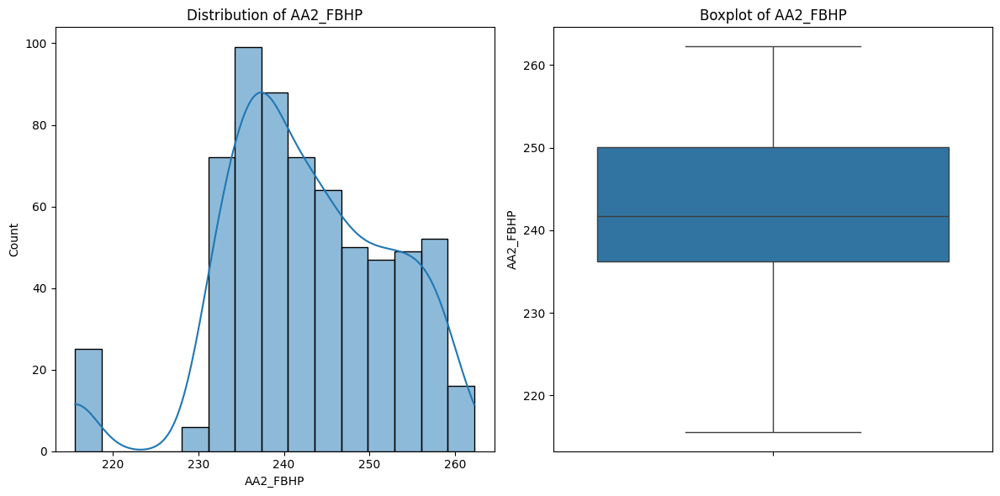


--- Summary Statistics for AA2_ANTP ---
count    640.000000
mean       6.214297
std        2.031201
min        0.350000
25%        4.700000
50%        6.800000
75%        7.600000
max       10.300000
Name: AA2_ANTP, dtype: float64


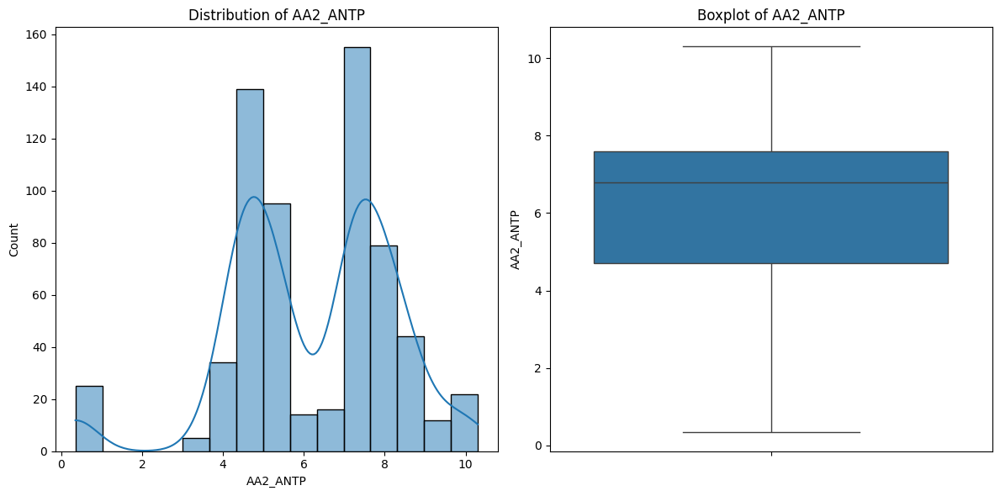


--- Summary Statistics for AA2_C_TE ---
count    640.000000
mean      19.282188
std        0.992879
min       17.150000
25%       18.800000
50%       19.400000
75%       19.900000
max       21.550000
Name: AA2_C_TE, dtype: float64


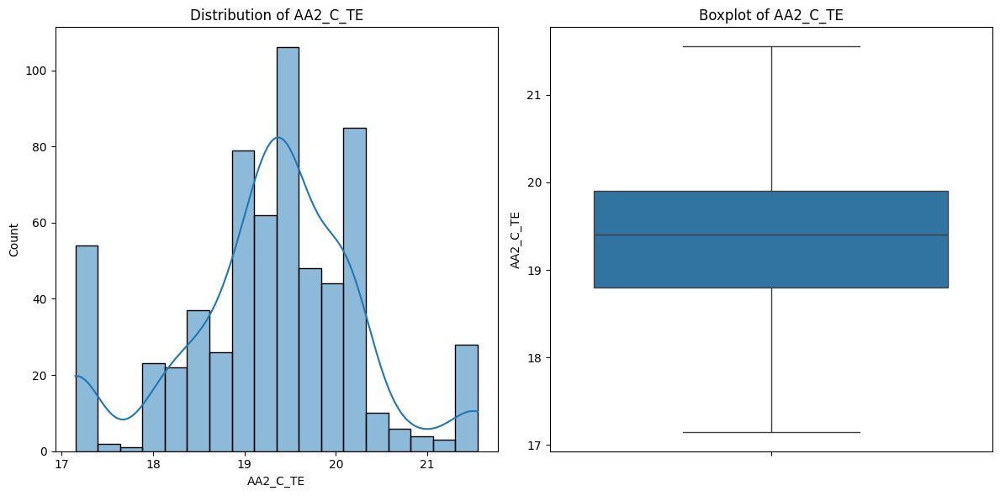


--- Summary Statistics for AA2_FBHT ---
count    640.000000
mean      36.672500
std        0.098271
min       36.450000
25%       36.600000
50%       36.700000
75%       36.700000
max       36.800000
Name: AA2_FBHT, dtype: float64


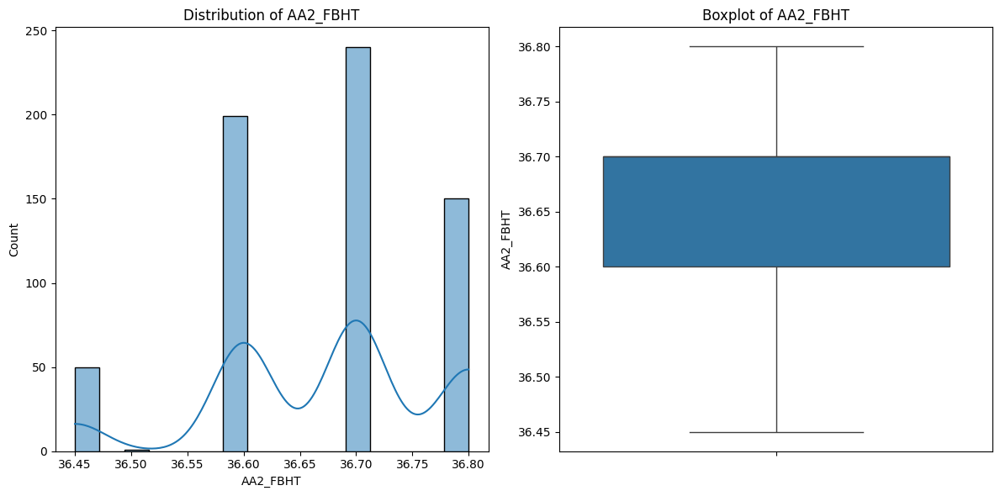


--- Summary Statistics for AA2_C_OP ---
count    640.00000
mean      30.02268
std        3.20223
min       23.06750
25%       28.16000
50%       30.10000
75%       31.55500
max       34.95000
Name: AA2_C_OP, dtype: float64


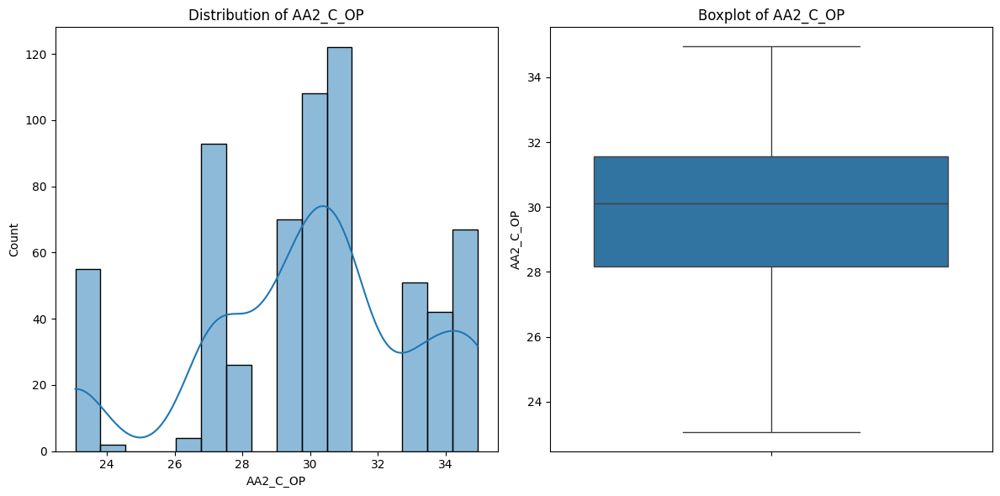


--- Summary Statistics for AA3 ---

--- Summary Statistics for AA3_91_9500062414 ---
count     640.000000
mean      894.802586
std      1356.097483
min         0.880000
25%         2.980000
50%         3.140000
75%      2377.000000
max      5939.845000
Name: AA3_91_9500062414, dtype: float64


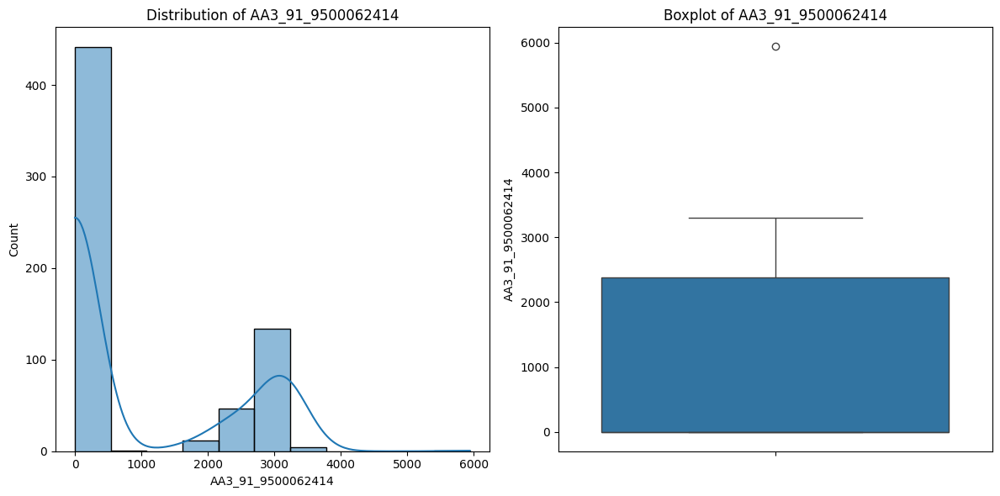


--- Summary Statistics for AA3_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.784072
std        0.107070
min        1.551117
25%        1.733825
50%        1.828840
75%        1.855630
max        2.038338
Name: AA3_91_EP_NATURAL_GAS, dtype: float64


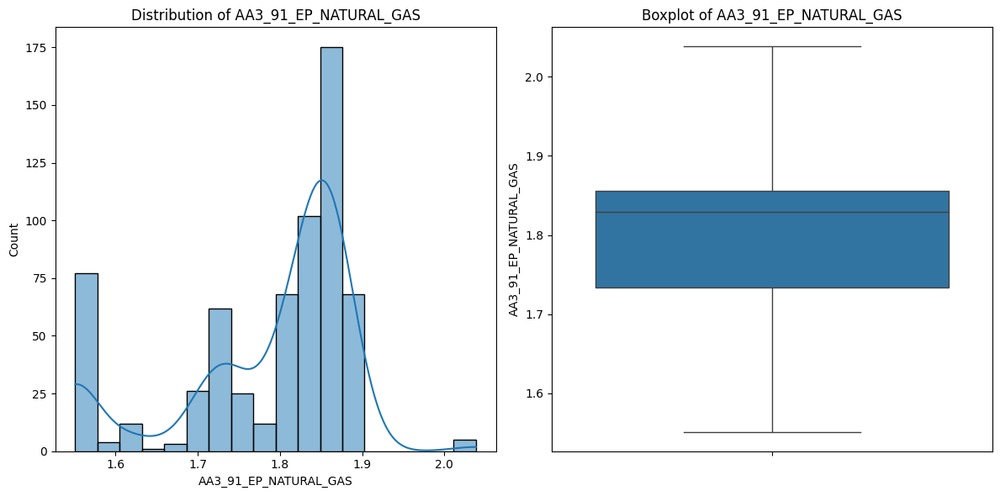


--- Summary Statistics for AA3_ANPR ---
count    640.000000
mean     290.249789
std       20.730021
min      238.475000
25%      282.320000
50%      287.885000
75%      311.550000
max      331.000000
Name: AA3_ANPR, dtype: float64


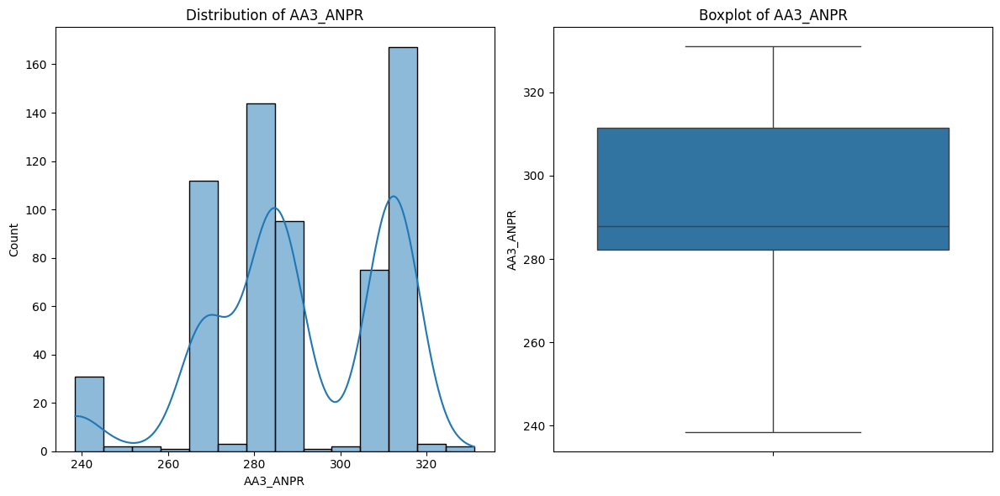


--- Summary Statistics for AA3_C_PR ---
count    640.000000
mean     129.015320
std        2.046691
min      124.677500
25%      127.805000
50%      129.040000
75%      129.890000
max      133.017500
Name: AA3_C_PR, dtype: float64


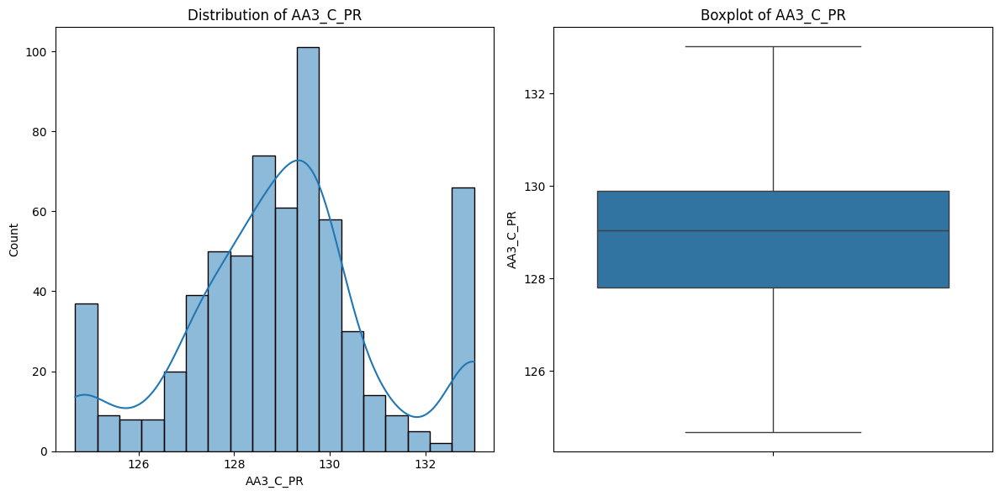


--- Summary Statistics for AA3_FBHP ---
count    640.000000
mean     302.958105
std        9.685219
min      276.342500
25%      296.532500
50%      302.890000
75%      309.992500
max      322.390000
Name: AA3_FBHP, dtype: float64


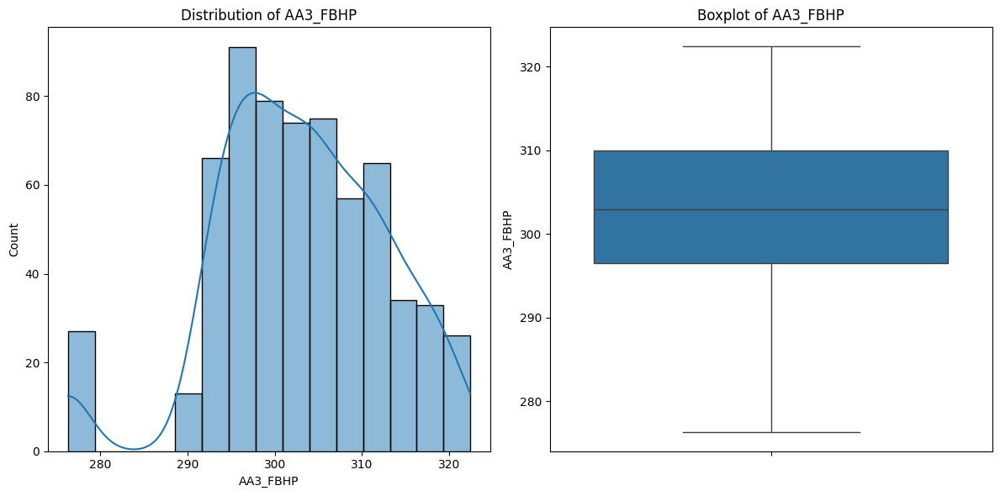


--- Summary Statistics for AA3_ANTP ---
count    640.000000
mean      14.808672
std        2.427436
min        9.312500
25%       13.700000
50%       15.400000
75%       16.625000
max       21.012500
Name: AA3_ANTP, dtype: float64


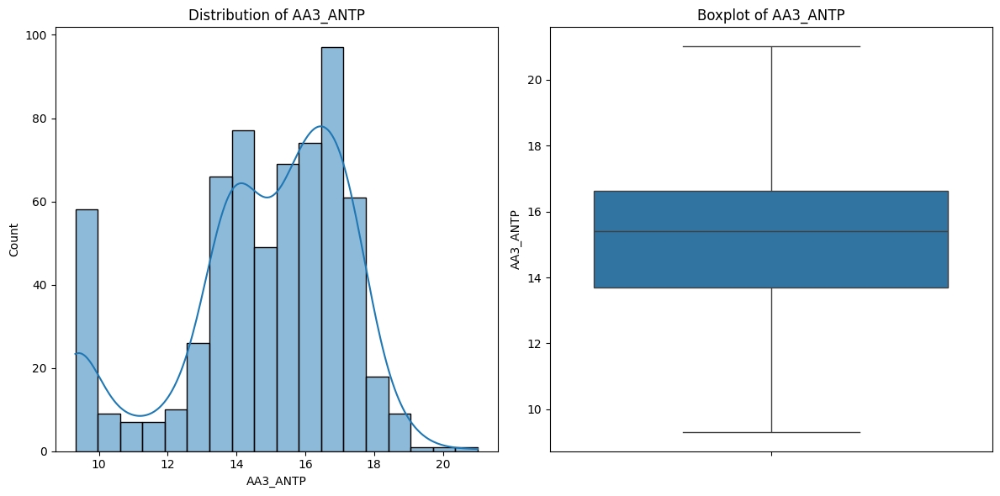


--- Summary Statistics for AA3_C_TE ---
count    640.000000
mean      59.424219
std        1.308510
min       56.550000
25%       58.800000
50%       59.900000
75%       60.300000
max       61.200000
Name: AA3_C_TE, dtype: float64


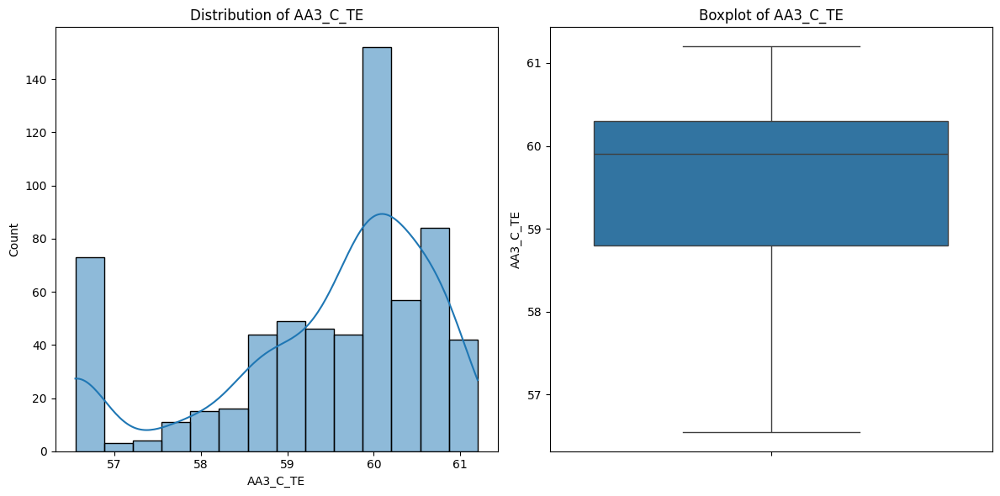


--- Summary Statistics for AA3_FBHT ---
count    640.000000
mean      92.745859
std        0.093878
min       92.550000
25%       92.700000
50%       92.700000
75%       92.800000
max       92.950000
Name: AA3_FBHT, dtype: float64


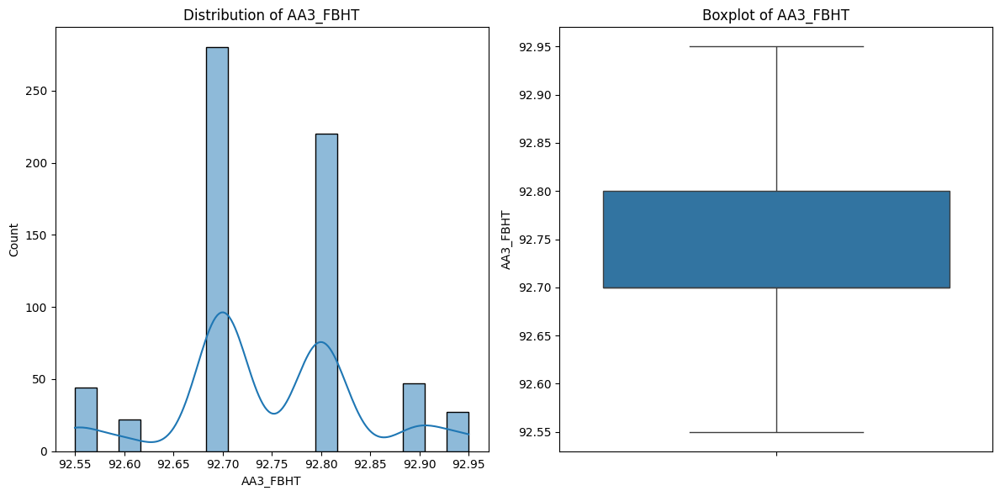


--- Summary Statistics for AA3_C_OP ---
count    640.000000
mean      38.688297
std        2.385722
min       33.180000
25%       37.500000
50%       39.420000
75%       40.380000
max       42.310000
Name: AA3_C_OP, dtype: float64


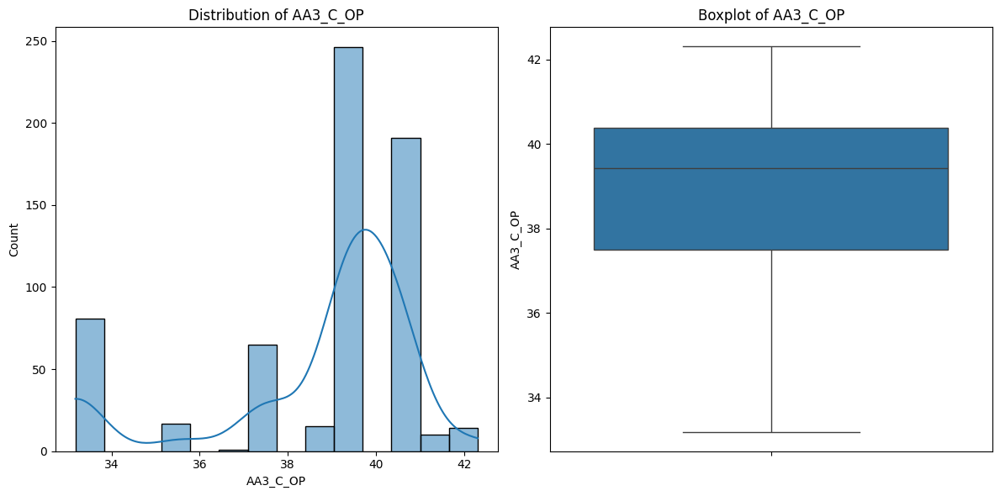


--- Summary Statistics for AA4 ---

--- Summary Statistics for AA4_91_9500062414 ---
count     640.000000
mean      579.550391
std       875.699018
min         0.850000
25%         2.070000
50%         2.140000
75%      1618.000000
max      2222.000000
Name: AA4_91_9500062414, dtype: float64


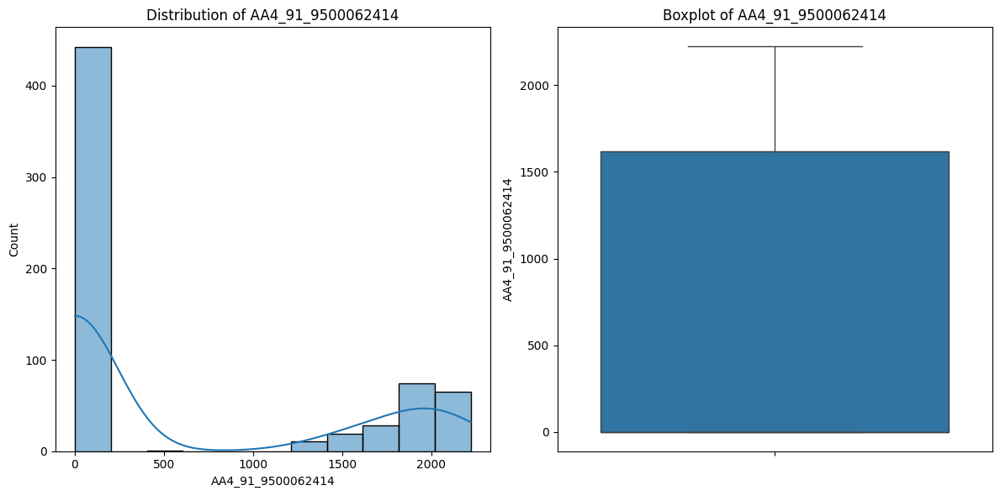


--- Summary Statistics for AA4_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.182659
std        0.089345
min        0.976083
25%        1.136005
50%        1.217240
75%        1.242620
max        1.402543
Name: AA4_91_EP_NATURAL_GAS, dtype: float64


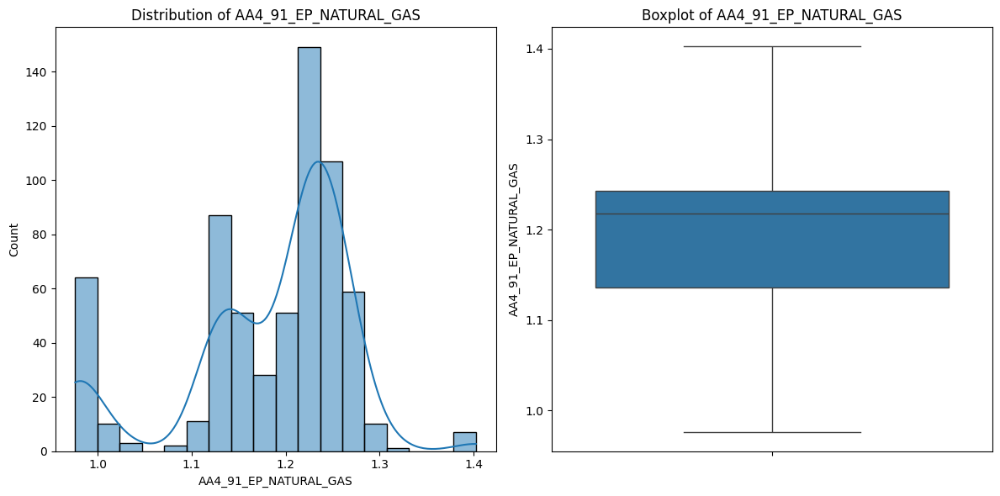


--- Summary Statistics for AA4_ANPR ---
count    640.000000
mean     208.174416
std       43.010227
min       81.268750
25%      179.177500
50%      221.230000
75%      244.450000
max      271.920000
Name: AA4_ANPR, dtype: float64


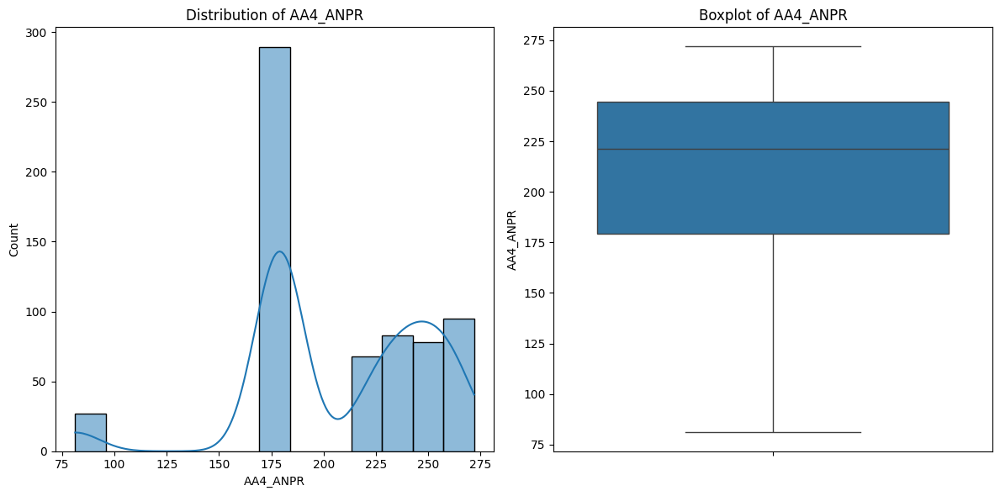


--- Summary Statistics for AA4_C_PR ---
count    640.00000
mean     140.88625
std        2.10611
min      136.64000
25%      139.76750
50%      140.95000
75%      141.85250
max      144.98000
Name: AA4_C_PR, dtype: float64


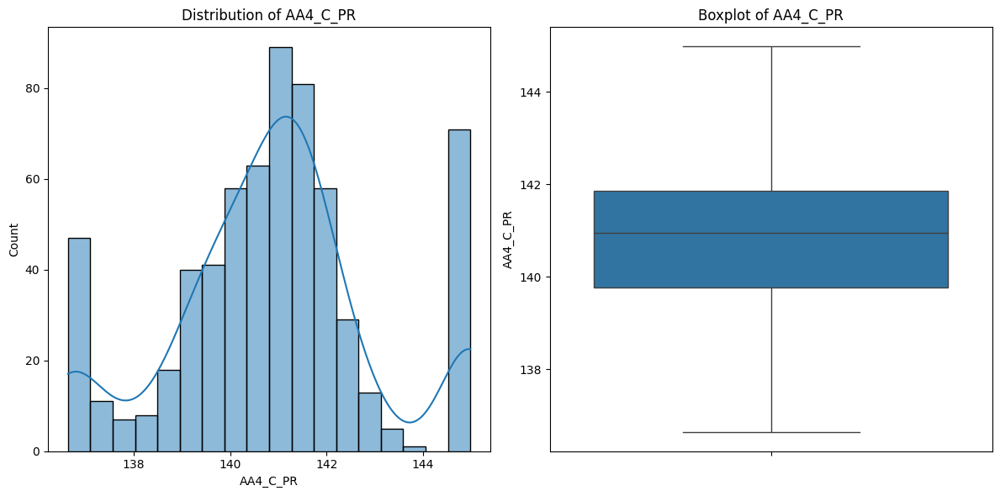


--- Summary Statistics for AA4_FBHP ---
count    640.000000
mean     234.443736
std       10.203883
min      205.823750
25%      227.427500
50%      236.150000
75%      241.830000
max      254.810000
Name: AA4_FBHP, dtype: float64


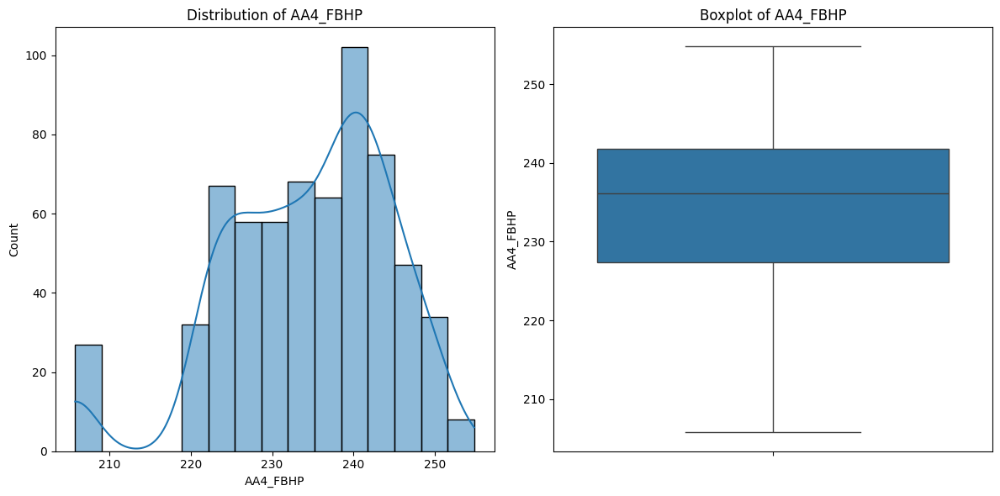


--- Summary Statistics for AA4_ANTP ---
count    640.000000
mean      11.237656
std        2.372100
min        7.100000
25%       10.700000
50%       11.400000
75%       13.100000
max       16.700000
Name: AA4_ANTP, dtype: float64


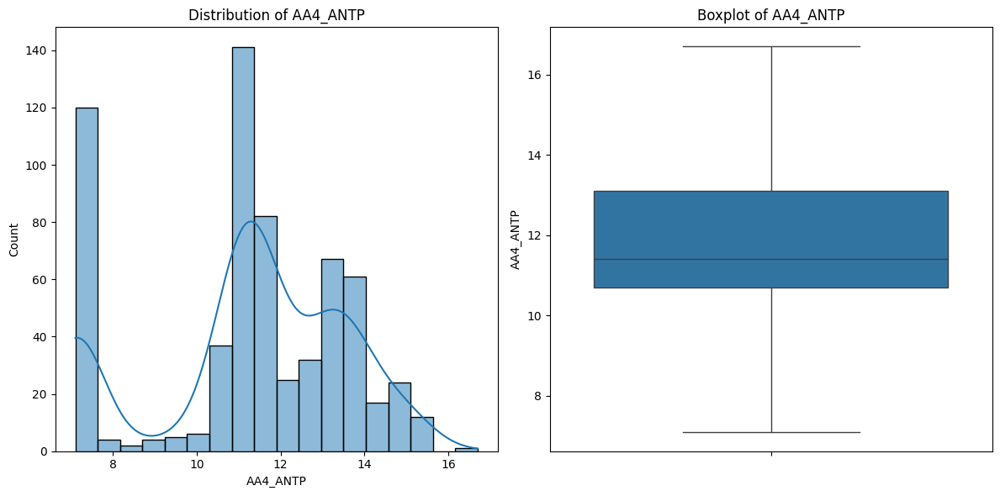


--- Summary Statistics for AA4_C_TE ---
count    640.000000
mean      28.208125
std        0.954946
min       25.900000
25%       27.700000
50%       28.400000
75%       28.900000
max       30.500000
Name: AA4_C_TE, dtype: float64


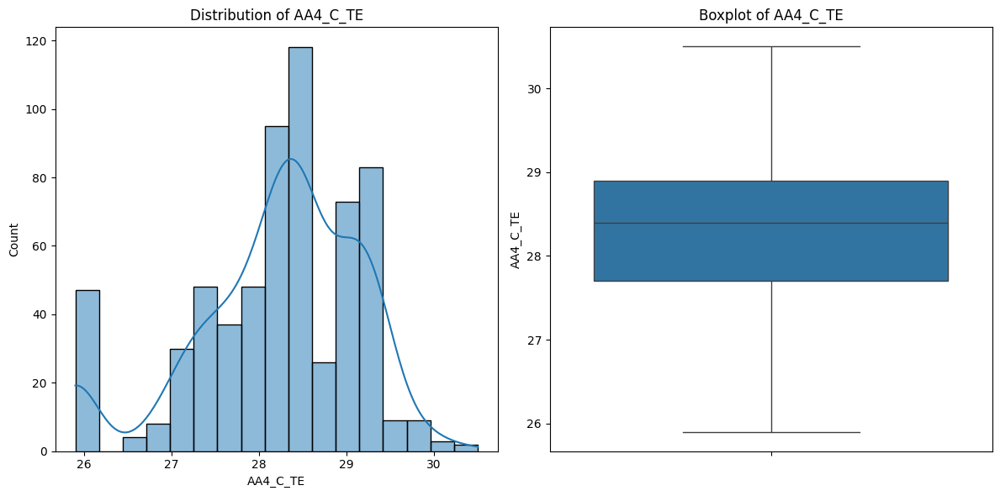


--- Summary Statistics for AA4_FBHT ---
count    640.000000
mean      48.109844
std        0.198598
min       47.550000
25%       48.000000
50%       48.100000
75%       48.300000
max       48.400000
Name: AA4_FBHT, dtype: float64


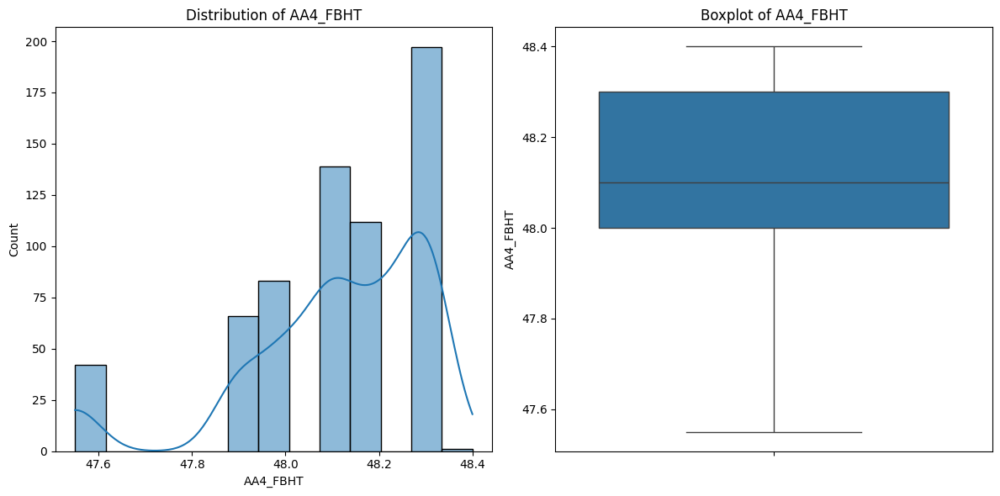


--- Summary Statistics for AA4_C_OP ---
count    6.400000e+02
mean     3.429000e+01
std      5.333239e-13
min      3.429000e+01
25%      3.429000e+01
50%      3.429000e+01
75%      3.429000e+01
max      3.429000e+01
Name: AA4_C_OP, dtype: float64


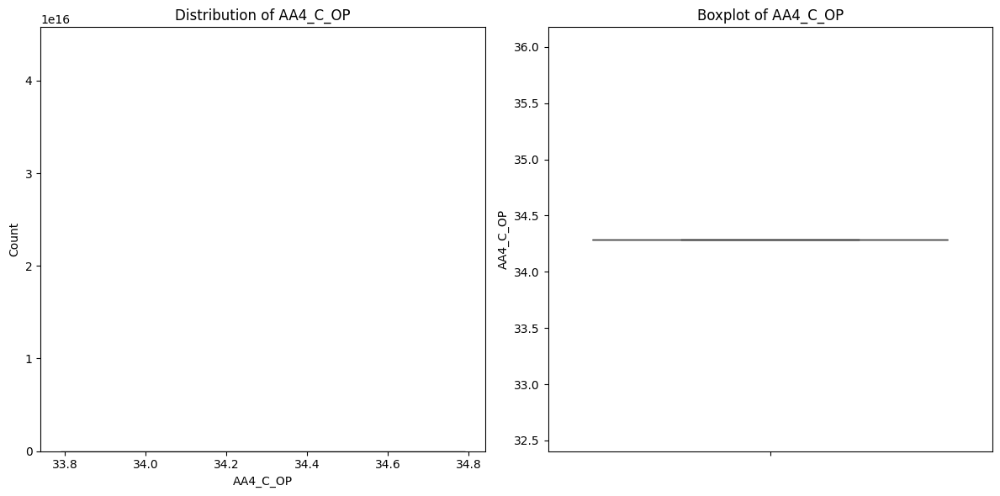


--- Summary Statistics for AA5 ---

--- Summary Statistics for AA5_91_9500062414 ---
count     640.000000
mean      645.415508
std       980.035242
min         0.130000
25%         2.140000
50%         2.190000
75%      1578.000000
max      3943.785000
Name: AA5_91_9500062414, dtype: float64


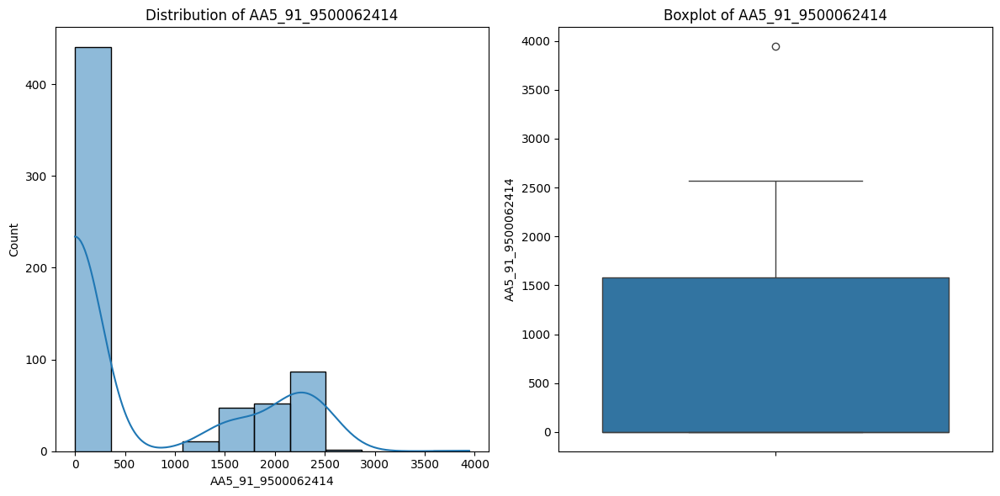


--- Summary Statistics for AA5_91_EP_NATURAL_GAS ---
count    640.000000
mean       1.262312
std        0.157254
min        0.899936
25%        1.206420
50%        1.245645
75%        1.410743
max        1.717226
Name: AA5_91_EP_NATURAL_GAS, dtype: float64


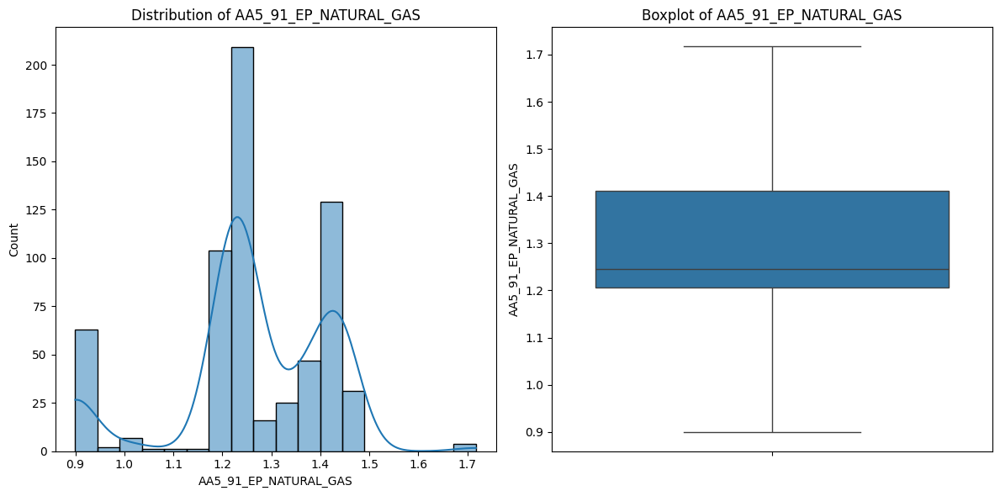


--- Summary Statistics for AA5_ANPR ---
count    640.000000
mean     235.319969
std        7.054710
min      217.820000
25%      231.057500
50%      235.440000
75%      239.882500
max      253.120000
Name: AA5_ANPR, dtype: float64


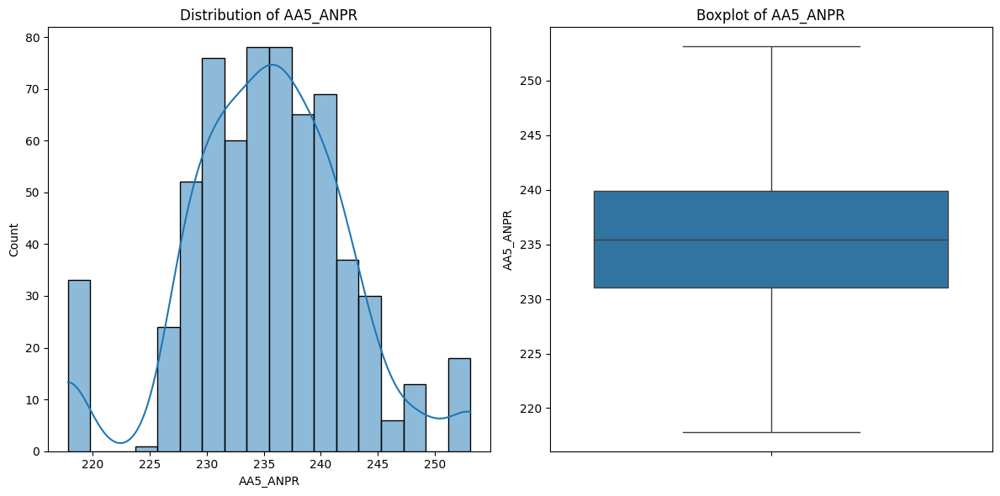


--- Summary Statistics for AA5_C_PR ---
count    640.000000
mean     147.852957
std        2.922030
min      141.567500
25%      146.240000
50%      147.490000
75%      149.355000
max      154.027500
Name: AA5_C_PR, dtype: float64


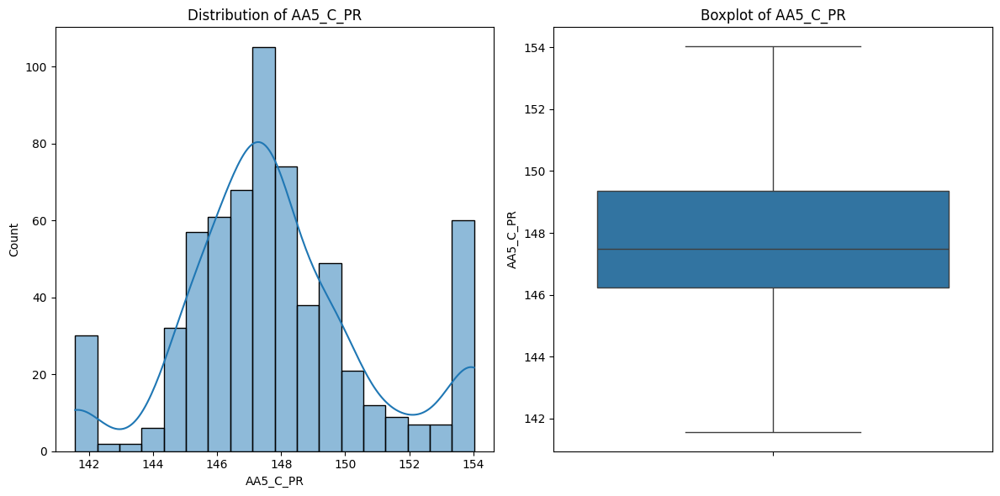


--- Summary Statistics for AA5_FBHP ---
count    640.000000
mean     243.030543
std        6.717607
min      224.253750
25%      238.372500
50%      243.245000
75%      247.785000
max      255.620000
Name: AA5_FBHP, dtype: float64


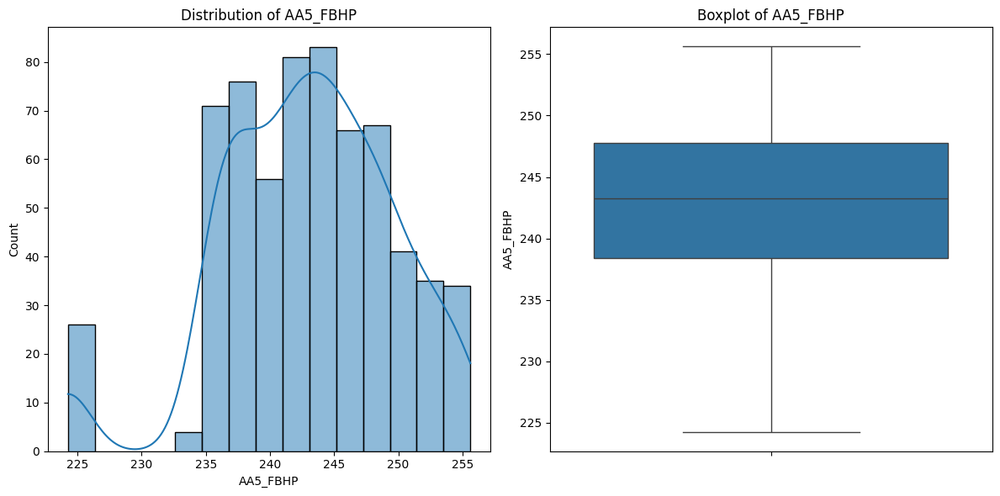


--- Summary Statistics for AA5_ANTP ---
count    640.000000
mean       5.825000
std        0.445434
min        4.850000
25%        5.600000
50%        5.900000
75%        6.100000
max        6.850000
Name: AA5_ANTP, dtype: float64


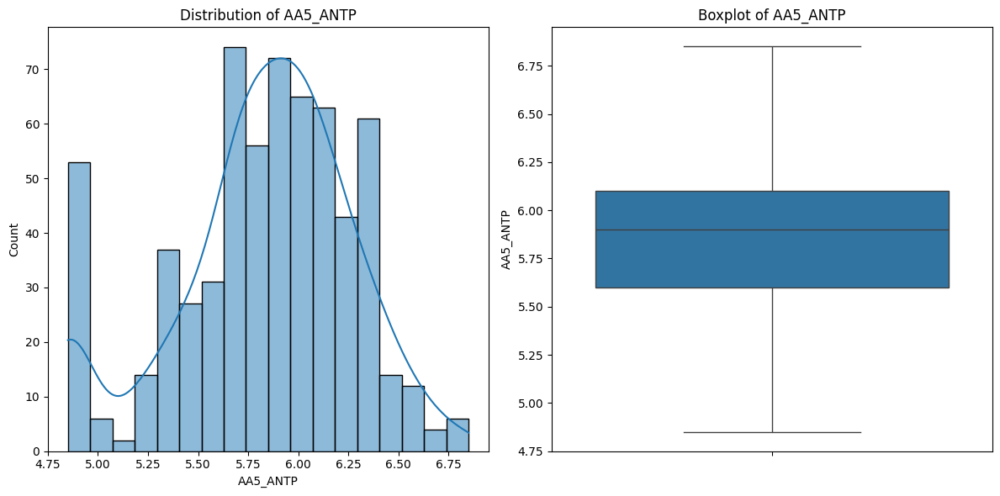


--- Summary Statistics for AA5_C_TE ---
count    640.000000
mean      11.379844
std        1.023794
min        9.100000
25%       10.900000
50%       11.200000
75%       12.100000
max       13.900000
Name: AA5_C_TE, dtype: float64


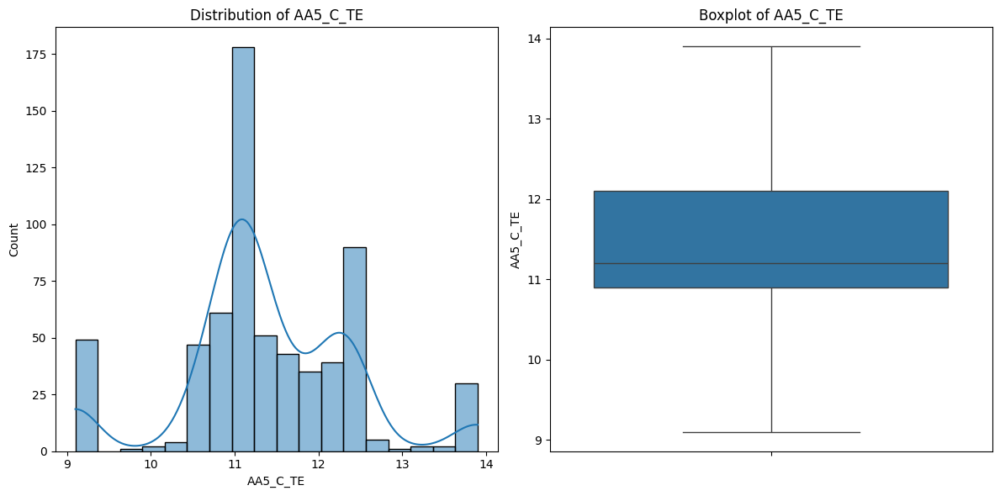


--- Summary Statistics for AA5_FBHT ---
count    640.000000
mean      29.055391
std        0.092555
min       28.850000
25%       29.000000
50%       29.100000
75%       29.100000
max       29.200000
Name: AA5_FBHT, dtype: float64


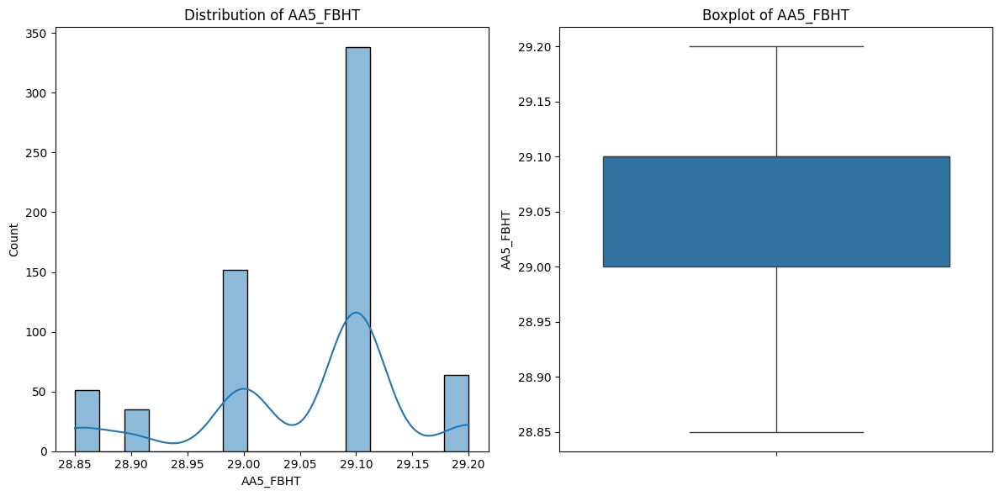


--- Summary Statistics for AA5_C_OP ---
count    640.000000
mean      30.275875
std        3.491061
min       21.650000
25%       28.850000
50%       29.810000
75%       33.650000
max       34.620000
Name: AA5_C_OP, dtype: float64


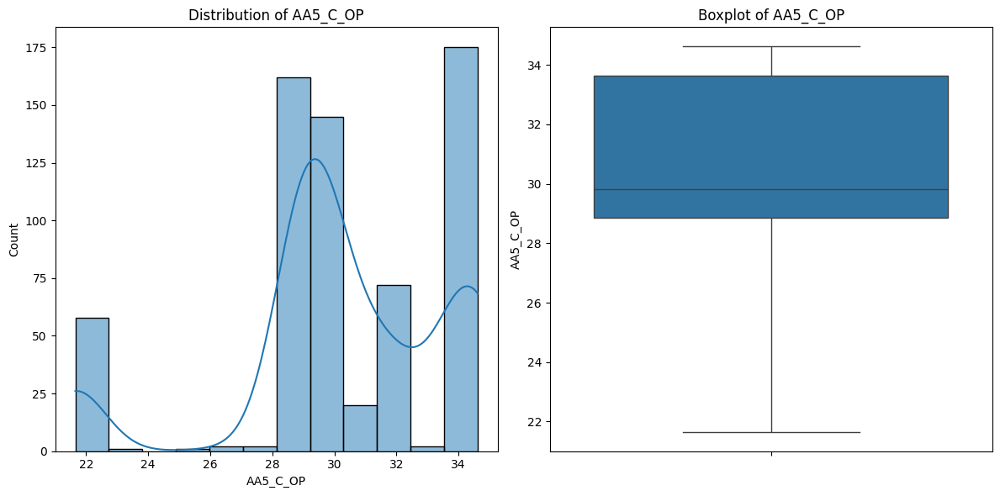

In [15]:
# Key variables for each well
key_variables = ['91_9500062414', '91_EP_NATURAL_GAS', 'ANPR', 'C_PR', 'FBHP', 'ANTP', 'C_TE', 'FBHT', 'C_OP']

# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\n--- Summary Statistics for {well} ---")
    for var in key_variables:
        column_name = f'{well}_{var}'
        print(f"\n--- Summary Statistics for {column_name} ---")
        print(df[column_name].describe())
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sns.histplot(df[column_name], kde=True)
        plt.title(f'Distribution of {column_name}')
        plt.subplot(1, 2, 2)
        sns.boxplot(y=df[column_name])
        plt.title(f'Boxplot of {column_name}')
        plt.tight_layout()
        plt.show()

In [ ]:
df.shape

(171, 56)

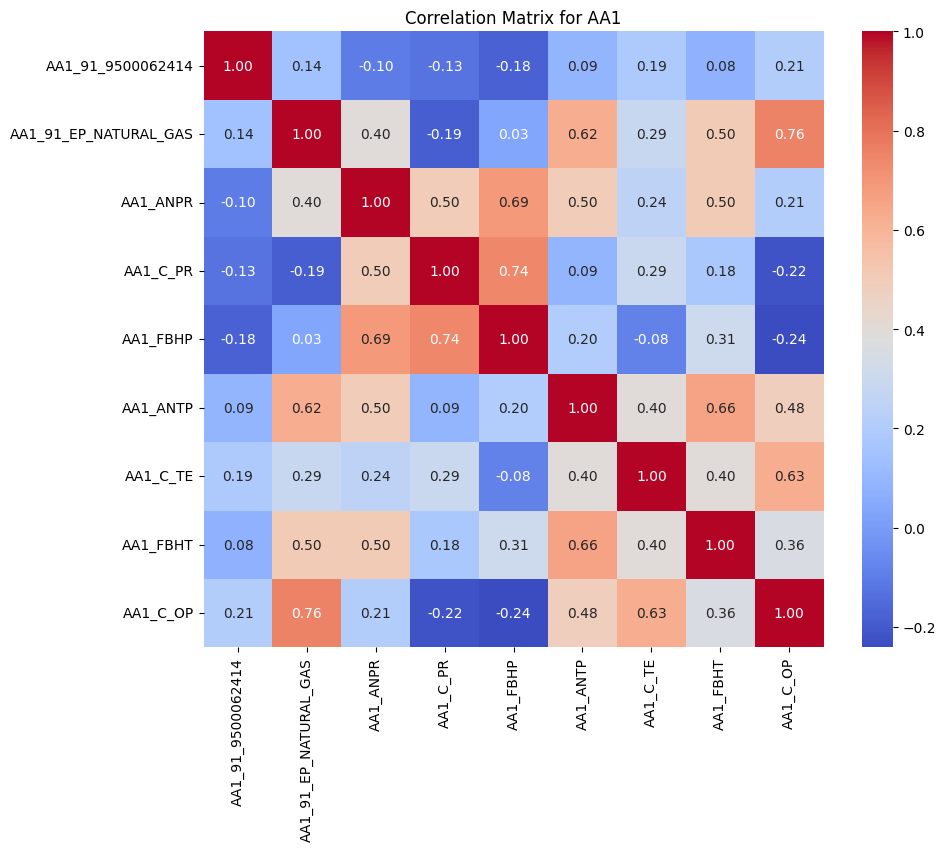

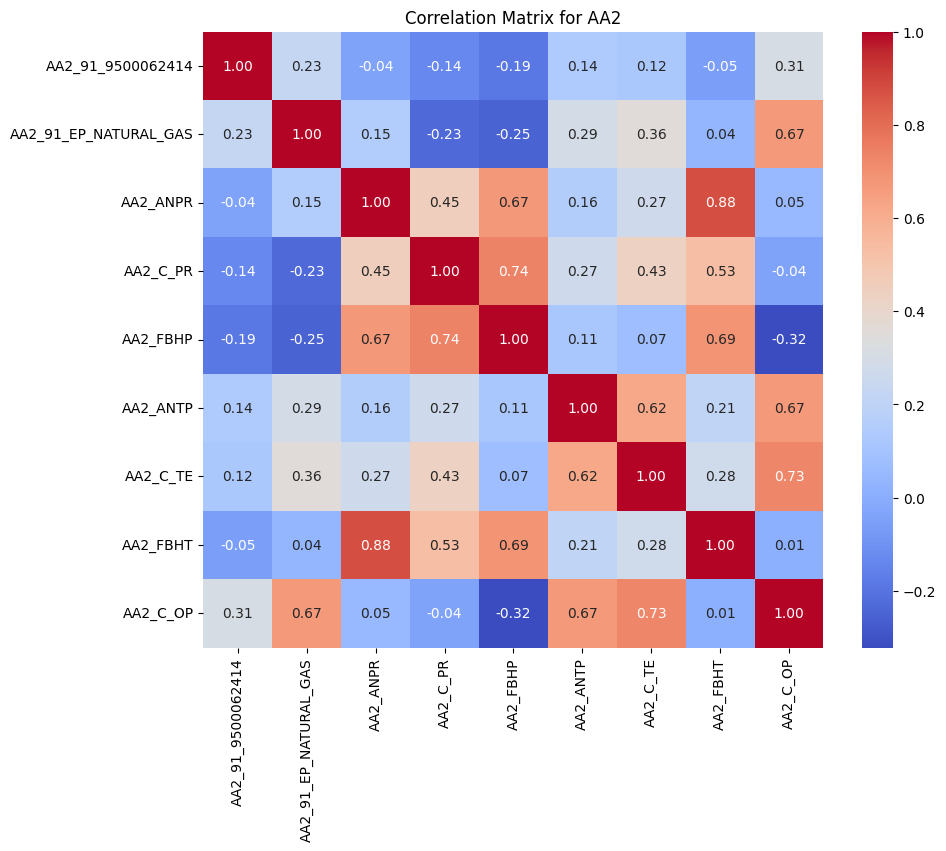

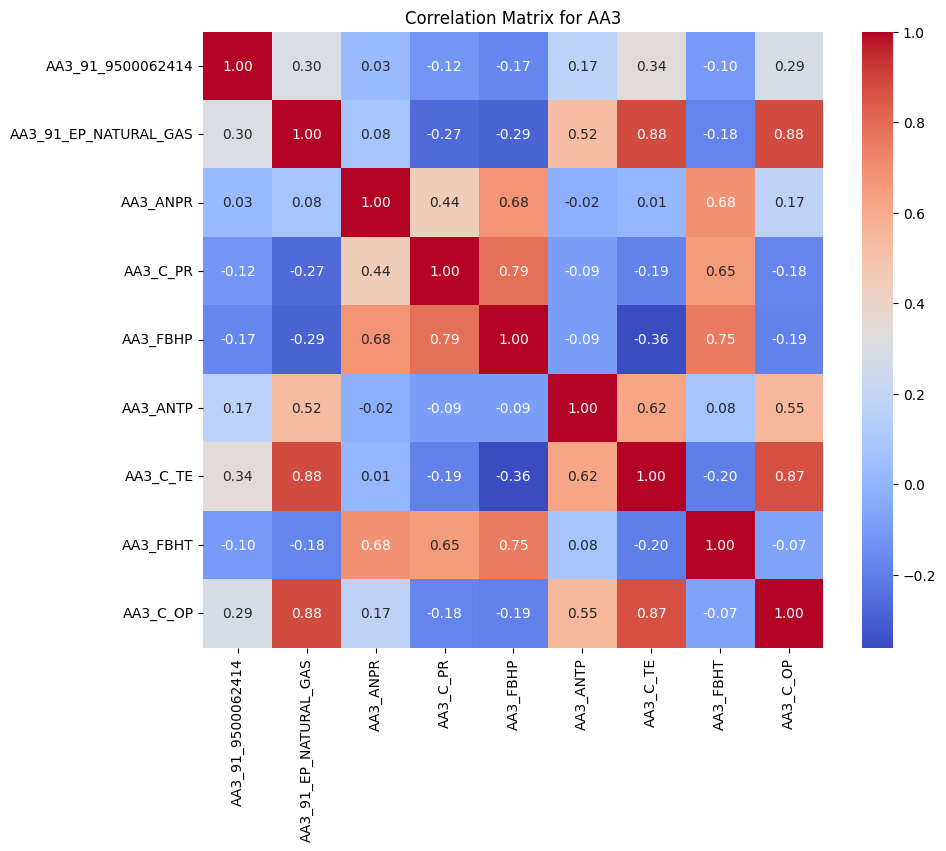

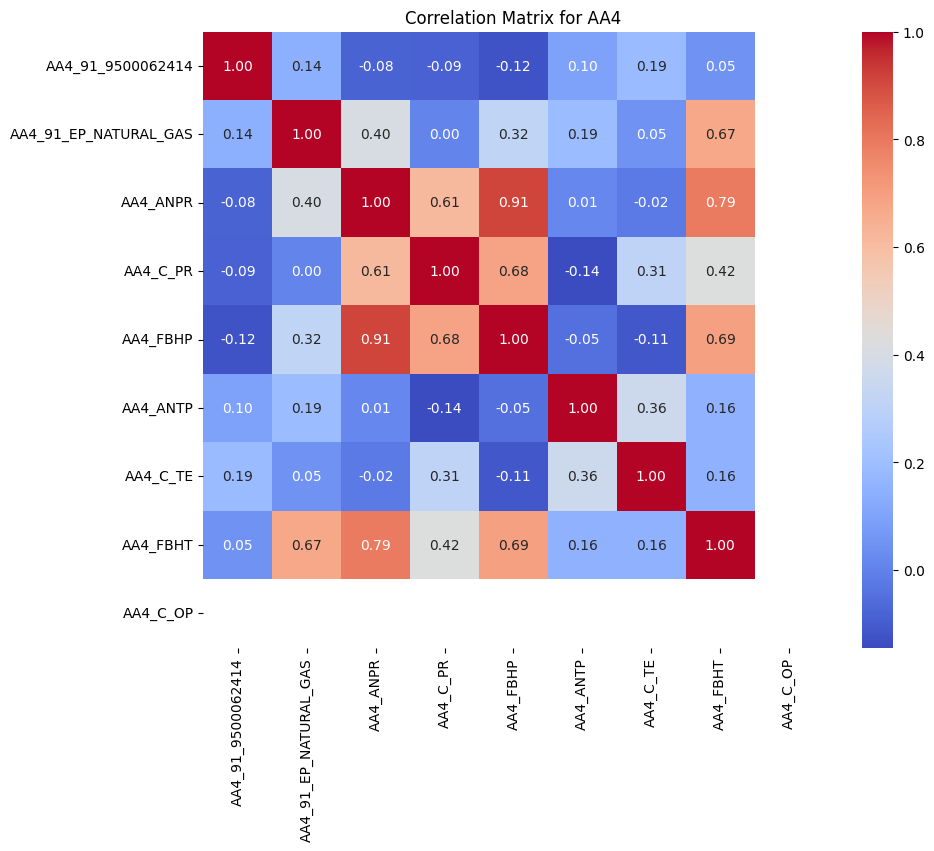

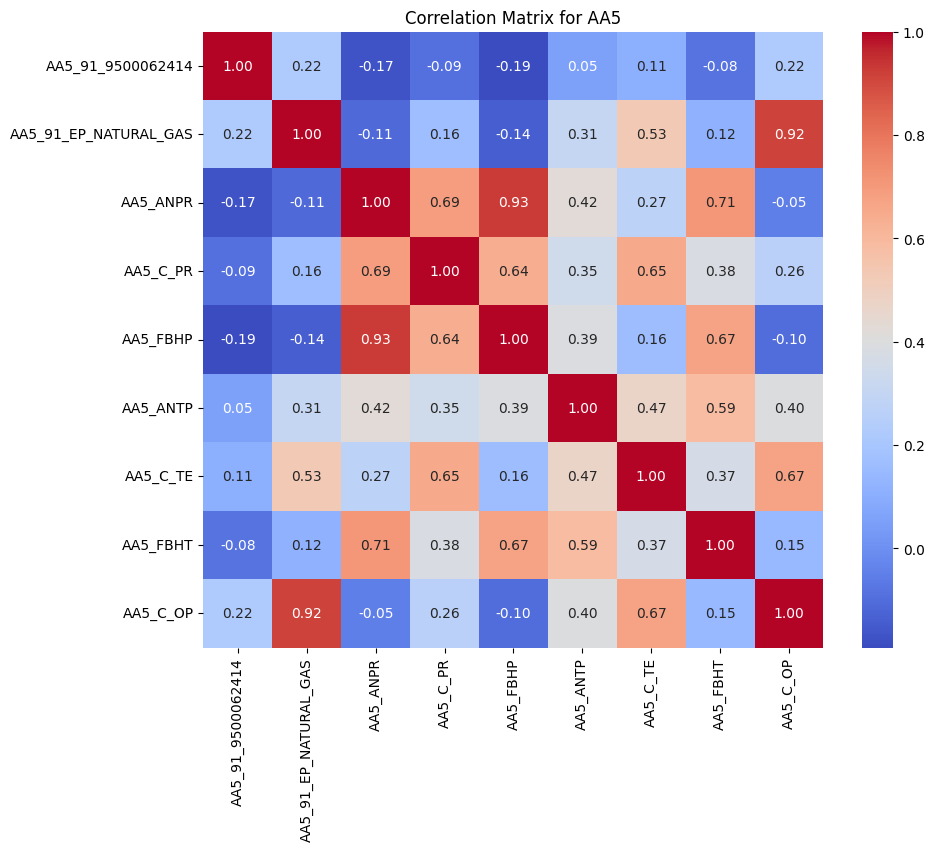

In [16]:
# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    well_data = df[[f'{well}_{var}' for var in key_variables]]
    correlation_matrix = well_data.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Matrix for {well}')
    plt.savefig(f'{well}_heatmap.png') # Save the heatmap
    plt.show()

# Making a model

In [17]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.svm import SVR

# Function to create and evaluate models for each well
def evaluate_models(X, y, well_name):
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize models
    models = {
        'Linear Regression': LinearRegression(),
        'Random Forest': RandomForestRegressor(random_state=42),
        'XGBoost': xgb.XGBRegressor(random_state=42),
        'Gradient Boosting': GradientBoostingRegressor(random_state=42),
        'SVR': SVR(kernel='rbf')
    }

    results = {}

    # Train and evaluate each model
    for name, model in models.items():
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        # Cross validation score
        cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='r2')

        results[name] = {
            'RMSE': rmse,
            'R2': r2,
            'CV_R2_mean': cv_scores.mean(),
            'CV_R2_std': cv_scores.std(),
            'model': model,
            'scaler': scaler
        }

    print(f"\nResults for {well_name}:")
    for name, metrics in results.items():
        print(f"\n{name}:")
        print(f"RMSE: {metrics['RMSE']:.4f}")
        print(f"R2 Score: {metrics['R2']:.4f}")
        print(f"Cross-val R2: {metrics['CV_R2_mean']:.4f} (+/- {metrics['CV_R2_std']*2:.4f})")

    return results

# Prepare data for each well
wells = {
    'AA1': {
        'features': ['AA1_91_9500062414', 'AA1_ANPR', 'AA1_ANTP', 'AA1_C_OP', 'AA1_C_PR',
                    'AA1_C_TE', 'AA1_FBHP', 'AA1_FBHT', 'AA1_FTHP', 'AA1_FTHT'],
        'target': 'AA1_91_EP_NATURAL_GAS'
    },
    'AA2': {
        'features': ['AA2_91_9500062414', 'AA2_ANPR', 'AA2_ANTP', 'AA2_C_OP', 'AA2_C_PR',
                    'AA2_C_TE', 'AA2_FBHP', 'AA2_FBHT', 'AA2_FTHP', 'AA2_FTHT'],
        'target': 'AA2_91_EP_NATURAL_GAS'
    },
    'AA3': {
        'features': ['AA3_91_9500062414', 'AA3_ANPR', 'AA3_ANTP', 'AA3_C_OP', 'AA3_C_PR',
                    'AA3_C_TE', 'AA3_FBHP', 'AA3_FBHT', 'AA3_FTHP', 'AA3_FTHT'],
        'target': 'AA3_91_EP_NATURAL_GAS'
    },
    'AA4': {
        'features': ['AA4_91_9500062414', 'AA4_ANPR', 'AA4_ANTP', 'AA4_C_OP', 'AA4_C_PR',
                    'AA4_C_TE', 'AA4_FBHP', 'AA4_FBHT', 'AA4_FTHP', 'AA4_FTHT'],
        'target': 'AA4_91_EP_NATURAL_GAS'
    },
    'AA5': {
        'features': ['AA5_91_9500062414', 'AA5_ANPR', 'AA5_ANTP', 'AA5_C_OP', 'AA5_C_PR',
                    'AA5_C_TE', 'AA5_FBHP', 'AA5_FBHT', 'AA5_FTHP', 'AA5_FTHT'],
        'target': 'AA5_91_EP_NATURAL_GAS'
    }
}

# Train and evaluate models for each well
all_results = {}
for well_name, well_data in wells.items():
    X = df[well_data['features']]
    y = df[well_data['target']]
    all_results[well_name] = evaluate_models(X, y, well_name)


Results for AA1:

Linear Regression:
RMSE: 0.0200
R2 Score: 0.7422
Cross-val R2: 0.7723 (+/- 0.0337)

Random Forest:
RMSE: 0.0101
R2 Score: 0.9336
Cross-val R2: 0.9281 (+/- 0.0810)

XGBoost:
RMSE: 0.0102
R2 Score: 0.9327
Cross-val R2: 0.9212 (+/- 0.1022)

Gradient Boosting:
RMSE: 0.0114
R2 Score: 0.9158
Cross-val R2: 0.9074 (+/- 0.0771)

SVR:
RMSE: 0.0397
R2 Score: -0.0196
Cross-val R2: -0.0142 (+/- 0.0270)

Results for AA2:

Linear Regression:
RMSE: 0.0288
R2 Score: 0.8192
Cross-val R2: 0.8194 (+/- 0.1674)

Random Forest:
RMSE: 0.0227
R2 Score: 0.8879
Cross-val R2: 0.8620 (+/- 0.1618)

XGBoost:
RMSE: 0.0195
R2 Score: 0.9169
Cross-val R2: 0.8490 (+/- 0.1111)

Gradient Boosting:
RMSE: 0.0222
R2 Score: 0.8922
Cross-val R2: 0.8565 (+/- 0.1509)

SVR:
RMSE: 0.0513
R2 Score: 0.4253
Cross-val R2: 0.4004 (+/- 0.0823)

Results for AA3:

Linear Regression:
RMSE: 0.0409
R2 Score: 0.8628
Cross-val R2: 0.8621 (+/- 0.0648)

Random Forest:
RMSE: 0.0313
R2 Score: 0.9196
Cross-val R2: 0.9030 (+/- 0.07


Model terbaik untuk Sumur AA1: Random Forest


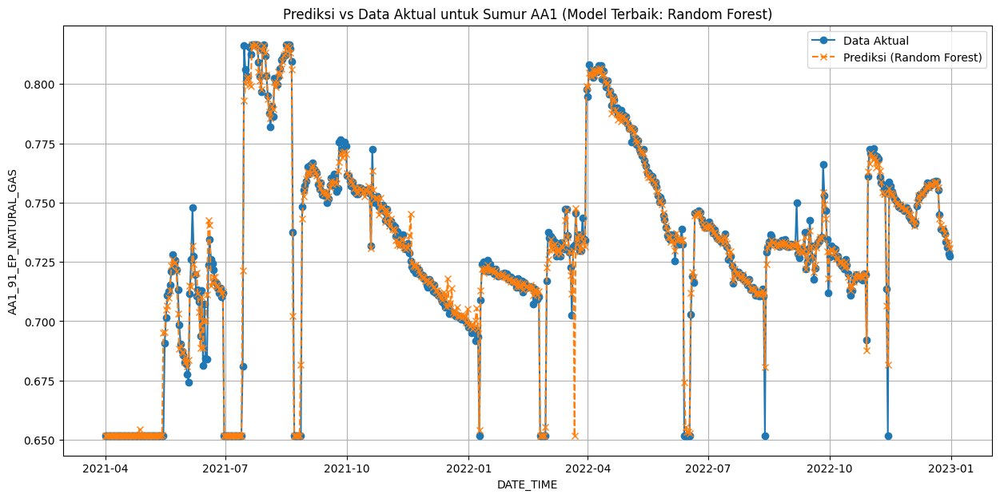


Model terbaik untuk Sumur AA2: XGBoost


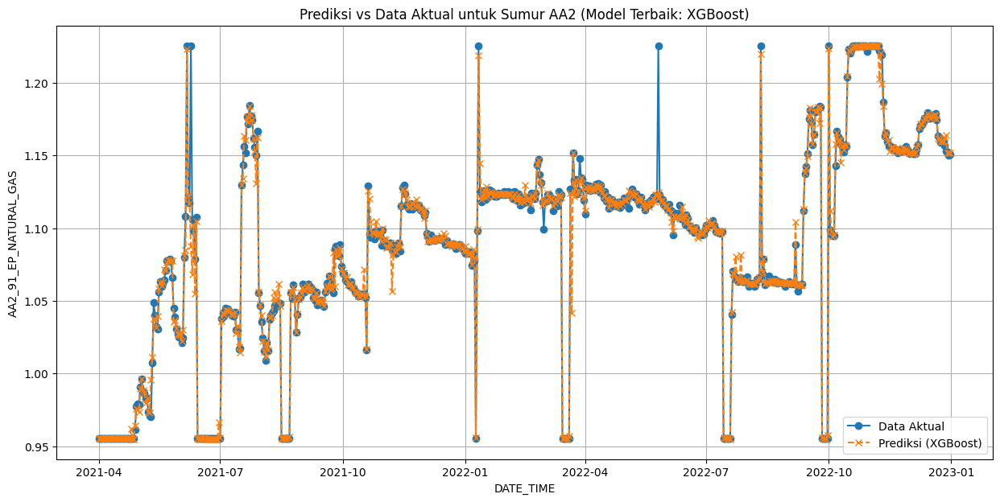


Model terbaik untuk Sumur AA3: Random Forest


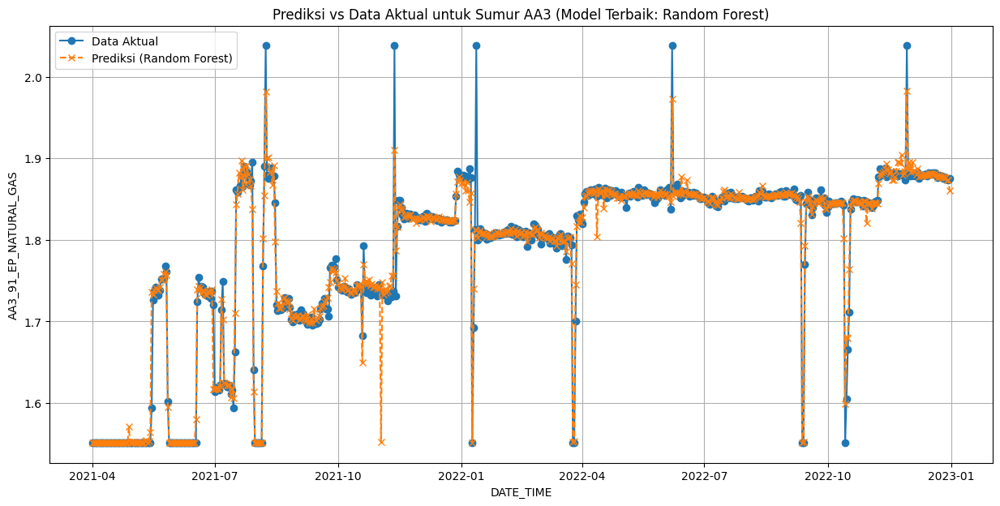


Model terbaik untuk Sumur AA4: Random Forest


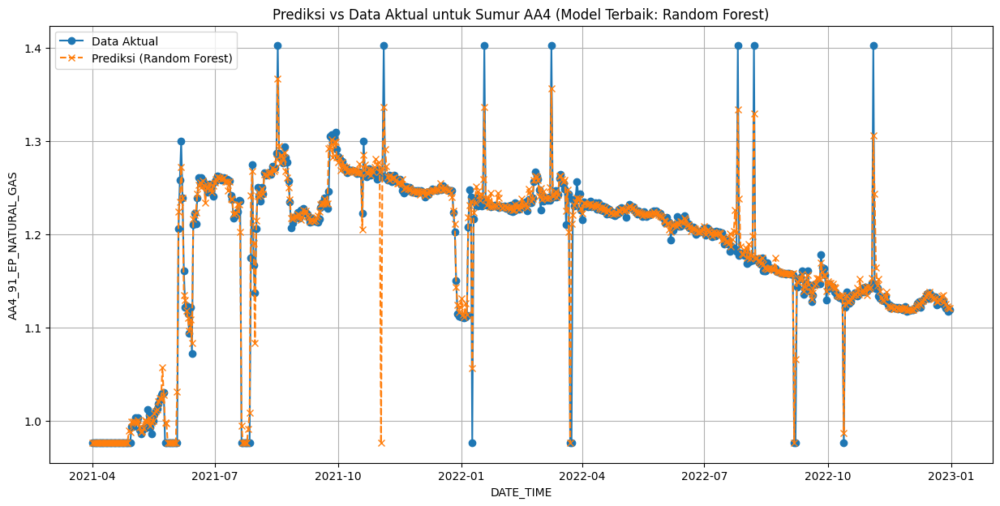


Model terbaik untuk Sumur AA5: Random Forest


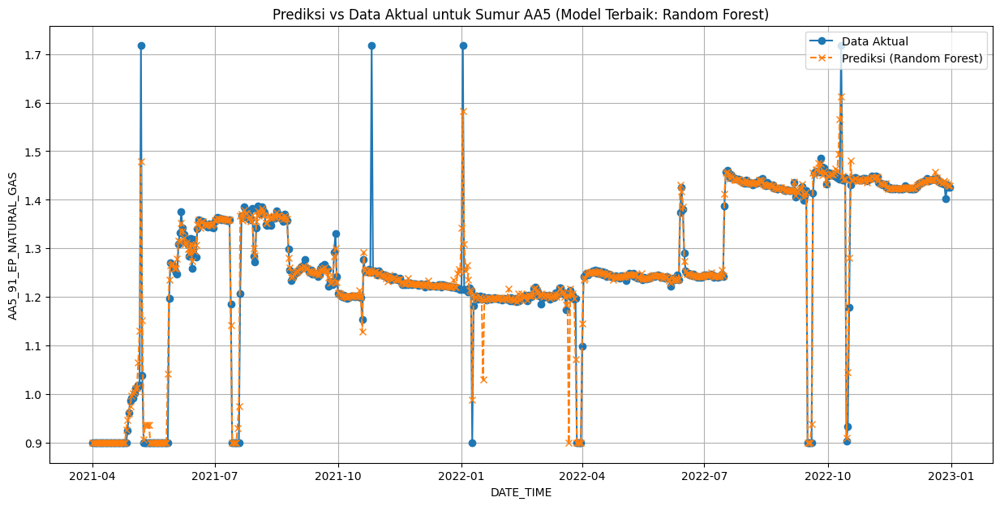

In [18]:
# prompt: Buatkan grafik yang dapat melihatkan grafik prediksi dan data aktual dengan hasil RMSE paling kecil dan r^2 paling besar

# Function to find the best model based on RMSE and R2
def find_best_model(results):
    best_model_name = None
    best_rmse = float('inf')
    best_r2 = -float('inf')

    for name, metrics in results.items():
        if metrics['RMSE'] < best_rmse and metrics['R2'] > best_r2:
            best_rmse = metrics['RMSE']
            best_r2 = metrics['R2']
            best_model_name = name
        elif metrics['RMSE'] == best_rmse and metrics['R2'] > best_r2:
            best_r2 = metrics['R2']
            best_model_name = name
        elif metrics['RMSE'] < best_rmse and metrics['R2'] == best_r2:
             best_rmse = metrics['RMSE']
             best_model_name = name


    return best_model_name

# Function to plot actual vs predicted values for the best model
def plot_best_model_prediction(df, well_name, best_model_name, model_info):
    X = df[wells[well_name]['features']]
    y = df[wells[well_name]['target']]

    # Use the trained model and scaler from the results
    best_model = model_info['model']
    scaler = model_info['scaler']

    # Scale the features
    X_scaled = scaler.transform(X)

    # Get predictions on the entire dataset (for plotting)
    y_pred = best_model.predict(X_scaled)

    plt.figure(figsize=(15, 7))
    plt.plot(df['DATE_TIME'], y, label='Data Aktual', marker='o', linestyle='-')
    plt.plot(df['DATE_TIME'], y_pred, label=f'Prediksi ({best_model_name})', marker='x', linestyle='--')
    plt.title(f'Prediksi vs Data Aktual untuk Sumur {well_name} (Model Terbaik: {best_model_name})')
    plt.xlabel('DATE_TIME')
    plt.ylabel(f'{well_name}_91_EP_NATURAL_GAS')
    plt.legend()
    plt.grid(True)
    plt.show()

# Iterate through each well, find the best model, and plot the results
for well_name, results in all_results.items():
    best_model_name = find_best_model(results)
    print(f"\nModel terbaik untuk Sumur {well_name}: {best_model_name}")

    # Get the model and scaler info for the best model
    best_model_info = results[best_model_name]

    # Plot the actual vs predicted for the best model
    plot_best_model_prediction(df, well_name, best_model_name, best_model_info)


In [19]:
# Import necessary libraries
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import xgboost as xgb
from sklearn.preprocessing import StandardScaler

# Create future dates for prediction
start_date = pd.to_datetime('2023-01-01')
end_date = pd.to_datetime('2023-12-31')
future_dates = pd.date_range(start=start_date, end=end_date, freq='D')
print("Generating predictions for period:", start_date.strftime('%Y-%m-%d'), "to", end_date.strftime('%Y-%m-%d'))

# Dictionary to store predictions for each well
predictions_dict = {}

# Train XGBoost model and make predictions for each well
for well_prefix in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\nTraining XGBoost model for {well_prefix}")

    # Select features and target for current well
    features = [f"{well_prefix}_91_9500062414", f"{well_prefix}_ANPR", f"{well_prefix}_ANTP",
                f"{well_prefix}_C_OP", f"{well_prefix}_C_PR", f"{well_prefix}_C_TE",
                f"{well_prefix}_FBHP", f"{well_prefix}_FBHT", f"{well_prefix}_FTHP",
                f"{well_prefix}_FTHT"]
    target = f"{well_prefix}_91_EP_NATURAL_GAS"

    X = df[features]
    y = df[target]

    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train XGBoost model on all data
    model = xgb.XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_scaled, y)

    # Generate synthetic future features based on historical patterns
    # Using mean values from last 30 days as a baseline
    last_30_days = X.tail(30).mean()

    # Create future features matrix
    n_days = len(future_dates)
    future_features = np.tile(last_30_days.values, (n_days, 1))

    # Add some random variation to make it more realistic
    np.random.seed(42)
    variation = np.random.normal(0, 0.1, future_features.shape)
    future_features = future_features * (1 + variation)

    # Scale future features
    future_features_scaled = scaler.transform(future_features)

    # Make predictions
    predictions = model.predict(future_features_scaled)

    # Store predictions
    predictions_dict[well_prefix] = predictions

# Create DataFrame with predictions
forecast_df = pd.DataFrame(index=future_dates)
for well_prefix in predictions_dict.keys():
    forecast_df[f"{well_prefix}_91_EP_NATURAL_GAS"] = predictions_dict[well_prefix]

# Save forecasts to CSV
forecast_df.to_csv('gas_production_forecast_2023.csv')
print("\nForecast summary:")
print(forecast_df.describe())

# Display first few rows of predictions
print("\nFirst few days of predictions:")
print(forecast_df.head())

Generating predictions for period: 2023-01-01 to 2023-12-31

Training XGBoost model for AA1

Training XGBoost model for AA2

Training XGBoost model for AA3


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Training XGBoost model for AA4

Training XGBoost model for AA5

Forecast summary:
       AA1_91_EP_NATURAL_GAS  AA2_91_EP_NATURAL_GAS  AA3_91_EP_NATURAL_GAS  \
count             365.000000             365.000000             365.000000   
mean                0.732916               1.115320               1.780675   
std                 0.043677               0.074436               0.090114   
min                 0.650090               0.949036               1.554533   
25%                 0.696744               1.082519               1.692491   
50%                 0.731619               1.140640               1.821982   
75%                 0.768075               1.166332               1.858868   
max                 0.817241               1.213856               1.912525   

       AA4_91_EP_NATURAL_GAS  AA5_91_EP_NATURAL_GAS  
count             365.000000             365.000000  
mean                1.102846               1.340025  
std                 0.059461               0.180775 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [20]:
df_predcited = pd.read_csv('gas_production_forecast_2023.csv')
df_predcited.head()

,Unnamed: 0,AA1_91_EP_NATURAL_GAS,AA2_91_EP_NATURAL_GAS,AA3_91_EP_NATURAL_GAS,AA4_91_EP_NATURAL_GAS,AA5_91_EP_NATURAL_GAS
0,2023-01-01,0.755217,1.166257,1.860991,1.126845,1.489962
1,2023-01-02,0.715355,0.962815,1.611187,1.112662,1.102353
2,2023-01-03,0.714962,1.129820,1.673742,1.109876,1.241487
3,2023-01-04,0.729662,1.136020,1.792347,1.195864,1.257975
4,2023-01-05,0.773102,0.973561,1.699008,1.111066,1.621431


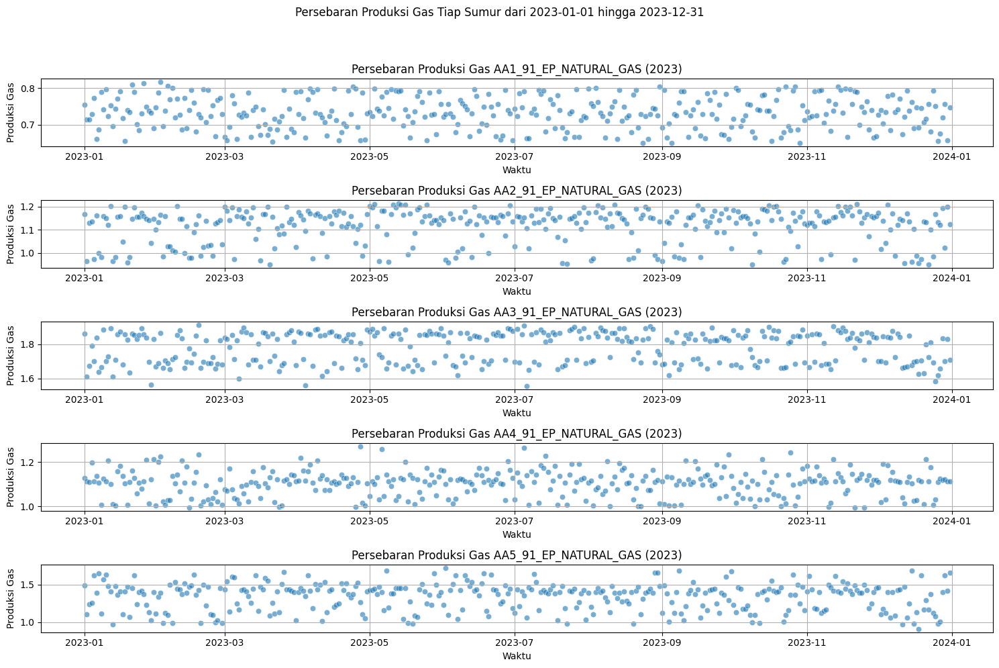

In [21]:
# prompt: Buat grafik persebaran untuk setiap waktu dari hasil gas produksi tiap sumur dari tahun 2023-01-01  sampai 2023-12-31

# Filter data for the specified date range
start_date = pd.to_datetime('2023-01-01')
end_date = pd.to_datetime('2023-12-31')
df_predcited['Unnamed: 0'] = pd.to_datetime(df_predcited['Unnamed: 0'])
forecast_df_filtered = df_predcited[(df_predcited['Unnamed: 0'] >= start_date) & (df_predcited['Unnamed: 0'] <= end_date)].copy()

# Rename the date column for clarity
forecast_df_filtered.rename(columns={'Unnamed: 0': 'DATE_TIME'}, inplace=True)

# Get the list of well columns (gas production)
well_columns = [col for col in forecast_df_filtered.columns if '_91_EP_NATURAL_GAS' in col]

# Create scatter plots for each well's gas production over time
plt.figure(figsize=(15, 10))

for i, well_col in enumerate(well_columns):
    plt.subplot(len(well_columns), 1, i + 1)
    sns.scatterplot(data=forecast_df_filtered, x='DATE_TIME', y=well_col, alpha=0.6)
    plt.title(f'Persebaran Produksi Gas {well_col} (2023)')
    plt.xlabel('Waktu')
    plt.ylabel('Produksi Gas')
    plt.grid(True)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap

plt.suptitle('Persebaran Produksi Gas Tiap Sumur dari 2023-01-01 hingga 2023-12-31', y=1.02)
plt.show()